# Measuring emission line fluxes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import lmfit
from lmfit import minimize, Parameters
from astropy.io import fits

import uncertainties.umath as uum
from uncertainties import ufloat
from uncertainties import unumpy as upy

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

from magE.directMethod import directT, run_all
from magE.functions import mergeSpec, gaussian, to_vel, FWHM, dV, save_catalog
from magE.plotutils import * 
from magE.constutils import *

PATH = '/home/benjamin/Documents/analogs/specs/final_spec/'
os.chdir(PATH)
os.getcwd()

'/home/benjamin/Documents/analogs/specs/final_spec'

In [2]:
# For intrinsic broadening
# 19A night does not have blue reduction, only red
wcal_red = fits.open('/home/benjamin/Documents/pypeit19a/redux_J0950/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')

In [3]:
# read the data
import pandas as pd
galname = 'J0950'
j0950 = pd.read_csv(galname + '.csv')

wave = j0950['wave'].to_numpy()
flux = j0950['flux'].to_numpy()
err = j0950['noise'].to_numpy()
igal = np.argmax(np.array(galnames) == galname)

class SpecPiece(object):
    
    def __init__(self, name, wavelength, flux, noise):
        self.name = name
        self.wavelength = wavelength
        self.flux = flux
        self.noise = noise

# Main lines

# [NII]6548 + Ha + [NII]6584
select = (wave > 7170) * (wave < 7245)
ha_nii = SpecPiece('ha+nii', wave[select], flux[select], err[select])

# Hb + [OIII]4959 + [OIII]5007
select = (wave > 5480) * (wave < 5515)
oiii_hei = SpecPiece('oiii+hei', wave[select], flux[select], err[select])


# Low ionization lines

# [OII]7319 + [OII]7330
select = (wave > 8010) * (wave < 8080)
oii_7320 = SpecPiece('oii7330', wave[select], flux[select], err[select])

# HeI7065
select = (wave > 7720) * (wave < 7790)
hei_7065 = SpecPiece('hei7065', wave[select], flux[select], err[select])

# HeI6678
select = (wave > 7300) * (wave < 7360)
hei_6678 = SpecPiece('hei6678', wave[select], flux[select], err[select])

# [SII]6716 + [SII]6731
select = (wave > 7350) * (wave < 7420)
sii = SpecPiece('sii', wave[select], flux[select], err[select])

# HeI5875
select = (wave > 6420) * (wave < 6480)
hei_5875 = SpecPiece('hei5875', wave[select], flux[select], err[select])

# [NII]5755
select = (wave > 6280) * (wave < 6360)
nii_5755 = SpecPiece('nii5755', wave[select], flux[select], err[select])

# Hb
select = (wave > 5310) * (wave < 5370)
hbeta = SpecPiece('hb', wave[select], flux[select], err[select])

# HeI4471
select = (wave > 4880) * (wave < 4940)
hei_4471 = SpecPiece('hei4471', wave[select], flux[select], err[select])

# Hg
select = (wave > 4750) * (wave < 4780)
hgamma = SpecPiece('hg', wave[select], flux[select], err[select])

# Hd
select = (wave > 4490) * (wave < 4520)
hdelta = SpecPiece('hd', wave[select], flux[select], err[select])

# [SII]4068 + [SII]4076
select = (wave > 4450) * (wave < 4500)
sii2 = SpecPiece('sii2', wave[select], flux[select], err[select])

# [OII]3726 + [OII]3729
select = (wave > 4077) * (wave < 4110)
oii_3727 = SpecPiece('oii3727', wave[select], flux[select], err[select])


# High ionization lines

# [SIII]9532
select = (wave > 10390) * (wave < 10550)
siii_9532 = SpecPiece('siiia', wave[select], flux[select], err[select])

# [SIII]9069
select = (wave > 9900) * (wave < 10020)
siii_9069 = SpecPiece('siiib', wave[select], flux[select], err[select])

# [OI]6300 + [SIII]6312
select = (wave > 6890) * (wave < 6960)
oi_siii = SpecPiece('oi+siiic', wave[select], flux[select], err[select])

# [OIII]4959
select = (wave > 5420) * (wave < 5470)
oiii_4959 = SpecPiece('oiiib', wave[select], flux[select], err[select])

# HeII4686
select = (wave > 5120) * (wave < 5165)
heii_4686 = SpecPiece('heii4686', wave[select], flux[select], err[select])

# [OIII]4363
select = (wave > 4780) * (wave < 4805)
oiii_4363 = SpecPiece('oiiic', wave[select], flux[select], err[select])

# [NeIII]3868
select = (wave > 4235) * (wave < 4260)
neiii_3868 = SpecPiece('neiiia', wave[select], flux[select], err[select])

(1e-17, 1e-16)

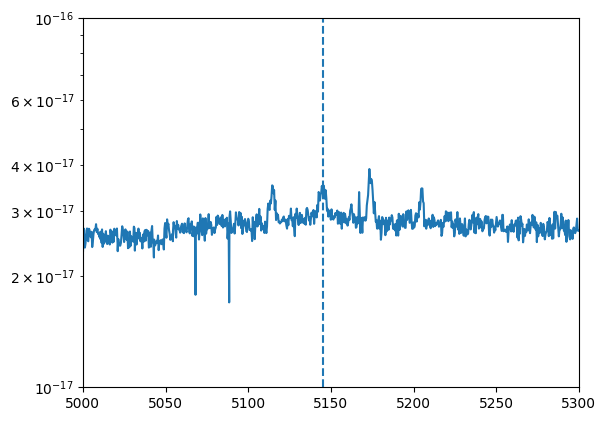

In [4]:
plt.plot(wave, flux)
plt.xlim(5000, 5300)
plt.axvline((1 + z_BN[igal])*wave_cat['HeII4685'], ls='--')
plt.yscale('log')
plt.ylim(1e-17, 1e-16)

---

# Two component model fit for [OIII] 4959

In [5]:
wcal_red.info()

Filename: /home/benjamin/Documents/pypeit19a/redux_J0950/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SPAT_IDS      1 ImageHDU        26   (10,)   int64   
  2  ECH_ORDERS    1 ImageHDU        22   (10,)   int64   
  3  SPAT_ID-491_WAVEFIT    1 BinTableHDU     41   1R x 6C   [73D, 73D, 73J, 2048D, 2048D, 88D]   
  4  SPAT_ID-491_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [73D, 73D, 1K, 73D, 5D, 73K]   
  5  SPAT_ID-563_WAVEFIT    1 BinTableHDU     41   1R x 6C   [90D, 90D, 90J, 2048D, 2048D, 104D]   
  6  SPAT_ID-563_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [90D, 90D, 1K, 90D, 5D, 90K]   
  7  SPAT_ID-629_WAVEFIT    1 BinTableHDU     41   1R x 6C   [88D, 88D, 88J, 2048D, 2048D, 107D]   
  8  SPAT_ID-629_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [88D, 88D, 1K, 88D, 5D, 88K]   
  9  SPAT_ID-690_WAVEFIT    1 BinTableHDU     41   1R x 6C   [83D, 83D

(0.0, 2000.0)

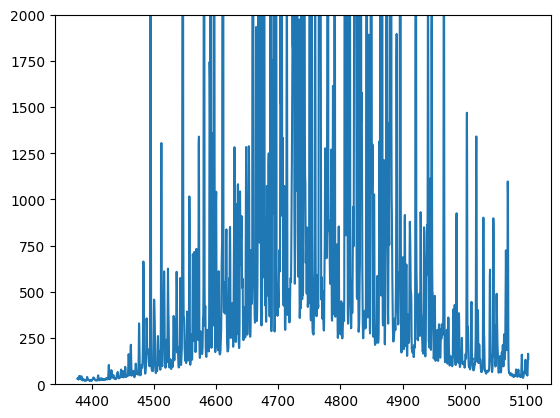

In [6]:
plt.plot(wcal_red[7].data['wave_soln'][0], wcal_red[7].data['spec'][0])
#plt.xlim(7740, 7770)
plt.ylim(0, 2000)

# [OIII]4959

### Arc lines

In [7]:
wave_cat['[OIII]4959']*(1 + z_BN[igal])

5445.057839885

In [8]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4959 = [wave_cat['[OIII]4959']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4959']*(1 + z_BN[igal]) + 10]
mask_arc_4959 = (wcal_red[11].data['wave_soln'][0] >= wlims_4959[0]) & (wcal_red[11].data['wave_soln'][0] < wlims_4959[1])

# Arc spectra around the fitted line
x_arc_4959 = wcal_red[11].data['wave_soln'][0][mask_arc_4959]
y_arc_4959 = wcal_red[11].data['spec'][0][mask_arc_4959]

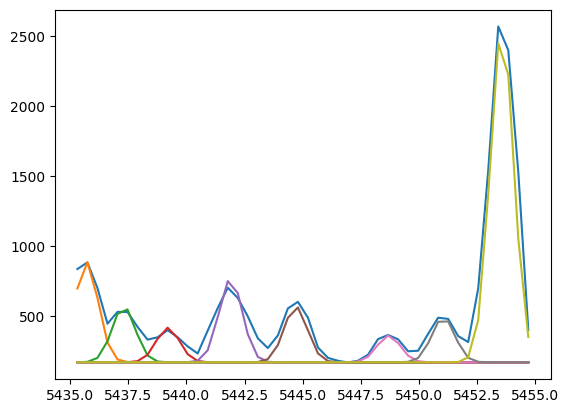

In [9]:
plt.plot(x_arc_4959, y_arc_4959)
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  900,  5435.7, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  500,  5437.3, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  310,  5439.2, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  750,  5441.9, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  500,  5444.7, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  240,  5448.7, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959,  400, 5451.05, 0, 0.5))
plt.plot(x_arc_4959, 170 + gaussian(x_arc_4959, 3000, 5453.57, 0, 0.5))

In [10]:
params_arc_4959 = Parameters()
params_arc_4959.add('z', value=0.0, vary=False)
params_arc_4959.add('mu1', value= 5435.7, vary=False)
params_arc_4959.add('mu2', value= 5437.3, vary=False)
params_arc_4959.add('mu3', value= 5439.2, vary=False)
params_arc_4959.add('mu4', value= 5441.9, vary=False)
params_arc_4959.add('mu5', value= 5444.7, vary=False)
params_arc_4959.add('mu6', value= 5448.7, vary=False)
params_arc_4959.add('mu7', value=5451.05, vary=False)
params_arc_4959.add('mu8', value=5453.57, vary=False)
params_arc_4959.add('arc1', value= 900, min=0.)
params_arc_4959.add('arc2', value= 500, min=0.)
params_arc_4959.add('arc3', value= 310, min=0.)
params_arc_4959.add('arc4', value= 750, min=0.)
params_arc_4959.add('arc5', value= 500, min=0.)
params_arc_4959.add('arc6', value= 240, min=0.)
params_arc_4959.add('arc7', value= 400, min=0.)
params_arc_4959.add('arc8', value=3000, min=0.)
params_arc_4959.add('sigma', value=0.5, min=0.)
params_arc_4959.add('bkg', value=170, vary=True)

def residual_arc_4959(params_arc_4959, x, data, uncertainty):
    
    z = params_arc_4959['z']
    mu1 = params_arc_4959['mu1']
    mu2 = params_arc_4959['mu2']
    mu3 = params_arc_4959['mu3']
    mu4 = params_arc_4959['mu4']
    mu5 = params_arc_4959['mu5']
    mu6 = params_arc_4959['mu6']
    mu7 = params_arc_4959['mu7']
    mu8 = params_arc_4959['mu8']
    flux1 = params_arc_4959['arc1']
    flux2 = params_arc_4959['arc2']
    flux3 = params_arc_4959['arc3']
    flux4 = params_arc_4959['arc4']
    flux5 = params_arc_4959['arc5']
    flux6 = params_arc_4959['arc6']
    flux7 = params_arc_4959['arc7']
    flux8 = params_arc_4959['arc8']
    sigma = params_arc_4959['sigma']
    bkg = params_arc_4959['bkg']
    
    x = x_arc_4959
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model8 = gaussian(x, flux8, mu8, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7 + model8
    return (model - y_arc_4959) / (0.05 * np.max(y_arc_4959))

np.random.seed(950)
out_arc_4959 = minimize(residual_arc_4959, params_arc_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:53<00:00, 46.97it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 10 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [81.13514399 79.08769441 83.12400306 81.92415641 80.77968129 86.26230589
 87.75931718 78.83725265 83.00905749 77.85337227]


In [11]:
out_arc_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,5435.70000,,,5435.7,-inf,inf,False
mu2,5437.30000,,,5437.3,-inf,inf,False
mu3,5439.20000,,,5439.2,-inf,inf,False
mu4,5441.90000,,,5441.9,-inf,inf,False
mu5,5444.70000,,,5444.7,-inf,inf,False
mu6,5448.70000,,,5448.7,-inf,inf,False
mu7,5451.05000,,,5451.05,-inf,inf,False
mu8,5453.57000,,,5453.57,-inf,inf,False
arc1,1036.22089,162.411937,(15.67%),900,0.00000000,inf,True


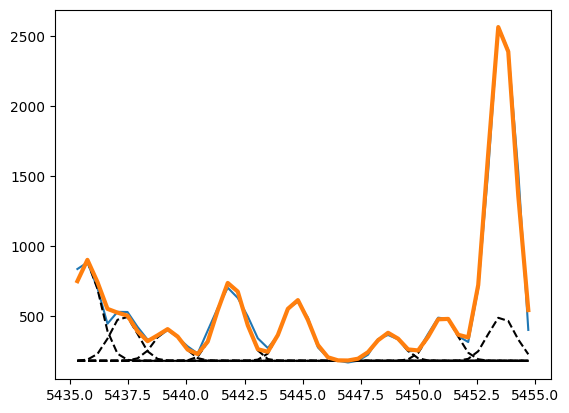

In [12]:
arc1_4959 = out_arc_4959.flatchain.arc1.mean()
arc2_4959 = out_arc_4959.flatchain.arc2.mean()
arc3_4959 = out_arc_4959.flatchain.arc3.mean()
arc4_4959 = out_arc_4959.flatchain.arc4.mean()
arc5_4959 = out_arc_4959.flatchain.arc5.mean()
arc6_4959 = out_arc_4959.flatchain.arc6.mean()
arc7_4959 = out_arc_4959.flatchain.arc7.mean()
arc8_4959 = out_arc_4959.flatchain.arc8.mean()

sigma_arc_4959 = out_arc_4959.flatchain.sigma.mean()
bkg_arc_4959 = out_arc_4959.flatchain.bkg.mean()

plt.plot(x_arc_4959, y_arc_4959)

plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc1_4959,  5435.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc2_4959,  5437.3, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc3_4959,  5439.2, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc4_4959,  5441.9, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc5_4959,  5444.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc6_4959,  5448.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc7_4959, 5451.05, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc7_4959, 5453.57, 0, sigma_arc_4959), ls='--', color='black')

plt.plot(x_arc_4959, bkg_arc_4959 + gaussian(x_arc_4959, arc1_4959,  5435.7, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc2_4959,  5437.3, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc3_4959,  5439.2, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc4_4959,  5441.9, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc5_4959,  5444.7, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc6_4959,  5448.7, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc7_4959, 5451.05, 0, sigma_arc_4959) \
                                  + gaussian(x_arc_4959, arc8_4959, 5453.57, 0, sigma_arc_4959), lw=3
)

### Line fitting

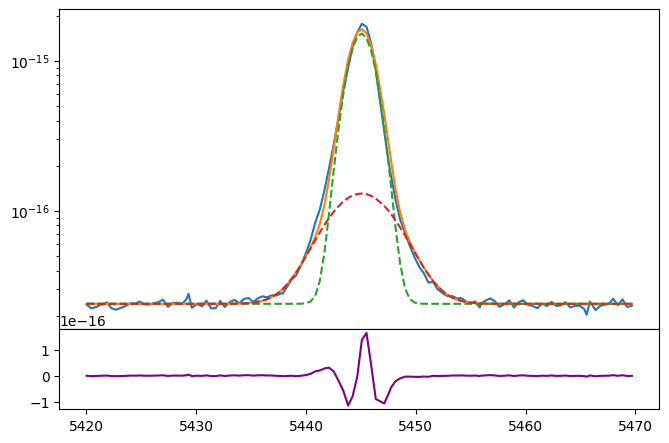

In [13]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4959.wavelength, oiii_4959.flux)
bkg = 2.4e-17

oiiib_nar = gaussian(oiii_4959.wavelength, 450e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=1.2)
oiiib_brd = gaussian(oiii_4959.wavelength, 80e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=3.0)

ax.plot(oiii_4959.wavelength, bkg + oiiib_nar + oiiib_brd)
ax.plot(oiii_4959.wavelength, bkg + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_nar - oiiib_brd, color='purple')
ax.set_yscale('log')

In [14]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal])
params_oiii_4959.add('z_brd', value=z_BN[igal])
params_oiii_4959.add('sigma_nar', value=1.2, min=0.)
params_oiii_4959.add('sigma_brd', value=3.0, min=0.)
params_oiii_4959.add('Oiiib_nar', value=450e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=80e-17, min=0.)
params_oiii_4959.add('bkg', value=2.4e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [15]:
np.random.seed(950)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:35<00:00, 69.96it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [198.11374945  90.09473074 205.37330369 197.5509967  210.34275717
 214.95593899 111.98205289]


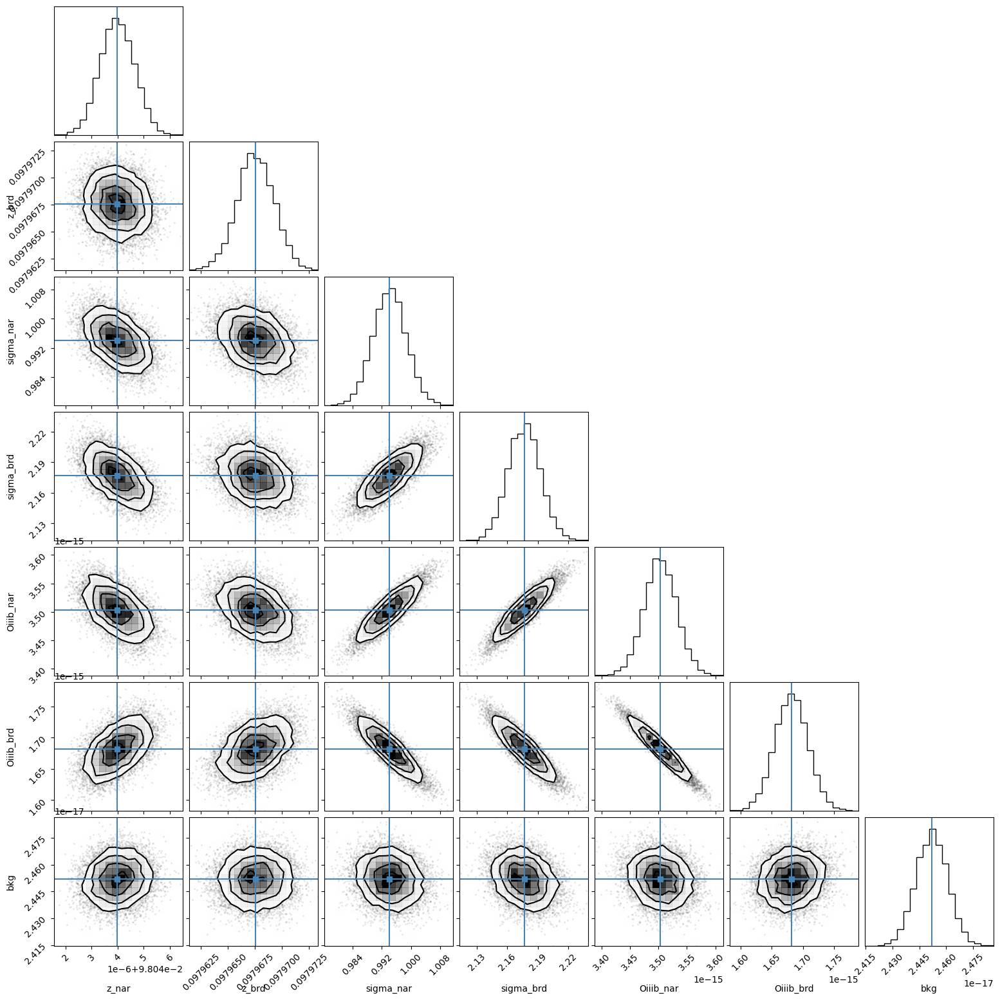

In [16]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [17]:
out_oiii_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09804398,6.6566e-07,(0.00%),0.098035,-inf,inf,True
z_brd,0.09796752,1.7124e-06,(0.00%),0.098035,-inf,inf,True
sigma_nar,0.99414834,0.00455882,(0.46%),1.2,0.00000000,inf,True
sigma_brd,2.17672990,0.01582208,(0.73%),3.0,0.00000000,inf,True
Oiiib_nar,3.5031e-15,2.8408e-17,(0.81%),4.5e-15,0.00000000,inf,True
Oiiib_brd,1.6815e-15,2.6619e-17,(1.58%),8e-16,0.00000000,inf,True
bkg,2.4519e-17,8.7850e-20,(0.36%),2.4e-17,0.00000000,inf,True


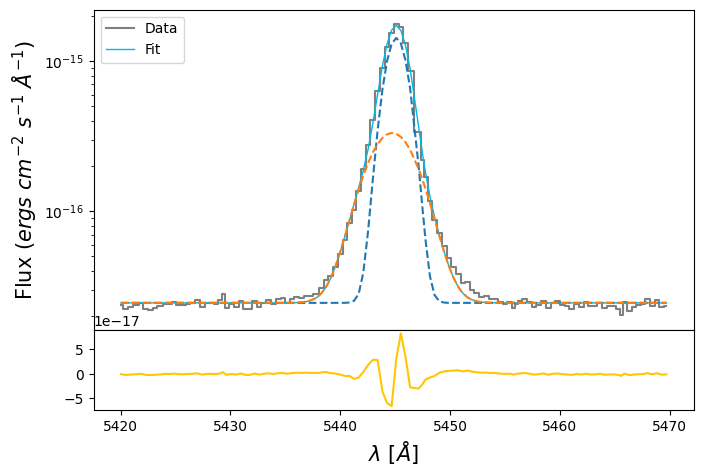

In [18]:
oiiib_nar_flux = out_oiii_4959.flatchain.Oiiib_nar.mean()
oiiib_nar_std = out_oiii_4959.flatchain.Oiiib_nar.std()

oiiib_brd_flux = out_oiii_4959.flatchain.Oiiib_brd.mean()
oiiib_brd_std = out_oiii_4959.flatchain.Oiiib_brd.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_nar_oiii_4959 = out_oiii_4959.flatchain.z_nar.mean()
z_nar_oiii_4959_std = out_oiii_4959.flatchain.z_nar.std()

z_brd_oiii_4959 = out_oiii_4959.flatchain.z_brd.mean()
z_brd_oiii_4959_std = out_oiii_4959.flatchain.z_brd.std()

sigma_nar_oiii_4959 = out_oiii_4959.flatchain.sigma_nar.mean()
sigma_nar_oiii_4959_std = out_oiii_4959.flatchain.sigma_nar.std()

sigma_brd_oiii_4959 = out_oiii_4959.flatchain.sigma_brd.mean()
sigma_brd_oiii_4959_std = out_oiii_4959.flatchain.sigma_brd.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [19]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_nar_intrinsic = upy.sqrt((ufloat(sigma_nar_oiii_4959, sigma_nar_oiii_4959_std)**2) - (sigma_arc_4959**2))
sigma_brd_intrinsic = upy.sqrt((ufloat(sigma_brd_oiii_4959, sigma_brd_oiii_4959_std)**2) - (sigma_arc_4959**2)) 

In [20]:
# EW
EW_OIII_4959_nar = ufloat(oiiib_nar_flux, oiiib_nar_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959_brd = ufloat(oiiib_brd_flux, oiiib_brd_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959 = (ufloat(oiiib_nar_flux, oiiib_nar_std) + ufloat(oiiib_brd_flux, oiiib_brd_std)) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959_nar = FWHM(sigma_nar_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))
FWHM_4959_brd = FWHM(sigma_brd_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std)))

# velocity shift
dV_4959 = dV(ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std),
             ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std))

# Ratio to fix velocity shifts between components
z_ratio = z_brd_oiii_4959 / z_nar_oiii_4959

# Ratio to distribute the flux between components in no detection
brd_to_nar = oiiib_brd_flux / oiiib_nar_flux

# Dispersion for the whole spectra
dLam = (np.max(wave) - np.min(wave)) / len(wave)

In [21]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))

Redshift of the narrow component: 0.0980+/-0.0000


In [22]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_nar_oiii_4959,
       'dV': dV_4959.nominal_value,
       'dV_err': dV_4959.std_dev,
       'FWHM_nar': FWHM_4959_nar.nominal_value,
       'FWHM_nar_err': FWHM_4959_nar.std_dev,
       'FWHM_brd': FWHM_4959_brd.nominal_value,
       'FWHM_brd_err': FWHM_4959_brd.std_dev
}

vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J0950, overwriting...
Done.


In [23]:
FWHM_4959_nar

104.62926554171396+/-0.735947537984809

In [24]:
FWHM_4959_brd

271.91834769589116+/-2.1458795440695644

---

# [NII]6548 + H$\alpha$ + [NII]6584

### Arc lines

In [25]:
wave_cat['Ha']*(1 + z_BN[igal])

7206.173117650001

In [26]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_ha = [wave_cat['Ha']*(1 + z_BN[igal]) - 10, wave_cat['Ha']*(1 + z_BN[igal]) + 10]
mask_arc_ha = (wcal_red[17].data['wave_soln'][0] >= wlims_ha[0]) & (wcal_red[17].data['wave_soln'][0] < wlims_ha[1])

# Arc spectra around the fitted line
x_arc_ha = wcal_red[17].data['wave_soln'][0][mask_arc_ha]
y_arc_ha = wcal_red[17].data['spec'][0][mask_arc_ha]

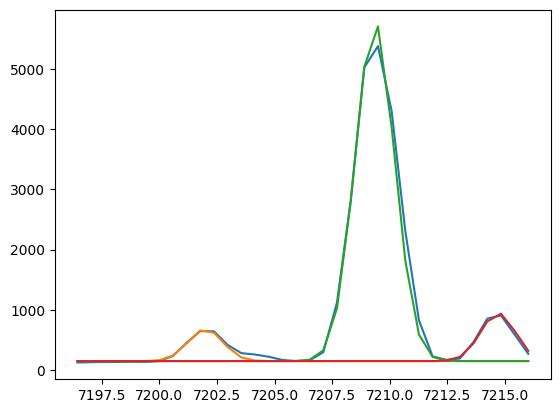

In [27]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 150 + gaussian(x_arc_ha,  1000,   7202, 0, 0.75))
plt.plot(x_arc_ha, 150 + gaussian(x_arc_ha, 12000, 7209.35, 0, 0.85))
plt.plot(x_arc_ha, 150 + gaussian(x_arc_ha,  1500, 7214.7, 0, 0.75))

In [28]:
params_arc_ha = Parameters()
params_arc_ha.add('z', value=0.0, vary=False)
params_arc_ha.add('mu1', value=   7202, vary=False)
params_arc_ha.add('mu2', value=7209.35, vary=False)
params_arc_ha.add('mu3', value= 7214.7, vary=False)
params_arc_ha.add('arc1', value= 1000, min=0.)
params_arc_ha.add('arc2', value=10000, min=0.)
params_arc_ha.add('arc3', value= 1500, min=0.)
params_arc_ha.add('sigma', value=0.8, min=0.)
params_arc_ha.add('bkg', value=150, vary=True)

def residual_arc_ha(params_arc_ha, x, data, uncertainty):
    
    z = params_arc_ha['z']
    mu1 = params_arc_ha['mu1']
    mu2 = params_arc_ha['mu2']
    mu3 = params_arc_ha['mu3']
    flux1 = params_arc_ha['arc1']
    flux2 = params_arc_ha['arc2']
    flux3 = params_arc_ha['arc3']
    sigma = params_arc_ha['sigma']
    bkg = params_arc_ha['bkg']
    
    x = x_arc_ha
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_ha) / (0.05 * np.max(y_arc_ha))

np.random.seed(950)
out_arc_ha = minimize(residual_arc_ha, params_arc_ha, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:48<00:00, 51.19it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [48.54542872 52.27158294 46.85712354 49.78357913 48.54609671]


In [29]:
out_arc_ha.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7202.00000,,,7202,-inf,inf,False
mu2,7209.35000,,,7209.35,-inf,inf,False
mu3,7214.70000,,,7214.7,-inf,inf,False
arc1,1267.43350,458.004700,(36.14%),1000,0.00000000,inf,True
arc2,12718.5237,593.711548,(4.67%),10000,0.00000000,inf,True
arc3,1739.86259,443.601090,(25.50%),1500,0.00000000,inf,True
sigma,0.93066510,0.04236101,(4.55%),0.8,0.00000000,inf,True
bkg,114.939099,72.7921883,(63.33%),150,-inf,inf,True


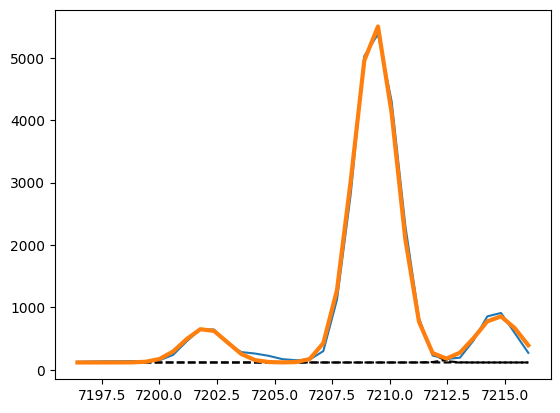

In [30]:
arc1_ha = out_arc_ha.flatchain.arc1.mean()
arc2_ha = out_arc_ha.flatchain.arc2.mean()
arc3_ha = out_arc_ha.flatchain.arc3.mean()
sigma_arc_ha = out_arc_ha.flatchain.sigma.mean()
bkg_arc_ha = out_arc_ha.flatchain.bkg.mean()

plt.plot(x_arc_ha, y_arc_ha)

plt.plot(x_arc_ha, bkg_arc_ha + gaussian(x_arc_ha, arc1_ha,    7202, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, bkg_arc_ha + gaussian(x_arc_ha, arc2_ha, 7209.35, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, bkg_arc_ha + gaussian(x_arc_ha, arc3_ha,  7214.7, 0, sigma_arc_ha), ls='--', color='black')

plt.plot(x_arc_ha, bkg_arc_ha + gaussian(x_arc_ha, arc1_ha,    7202, 0, sigma_arc_ha) \
                              + gaussian(x_arc_ha, arc2_ha, 7209.35, 0, sigma_arc_ha) \
                              + gaussian(x_arc_ha, arc3_ha,  7214.7, 0, sigma_arc_ha), lw=3
)

### Line fitting

In [31]:
sigma_nar_ha = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_ha**2))
sigma_brd_ha = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_ha**2))

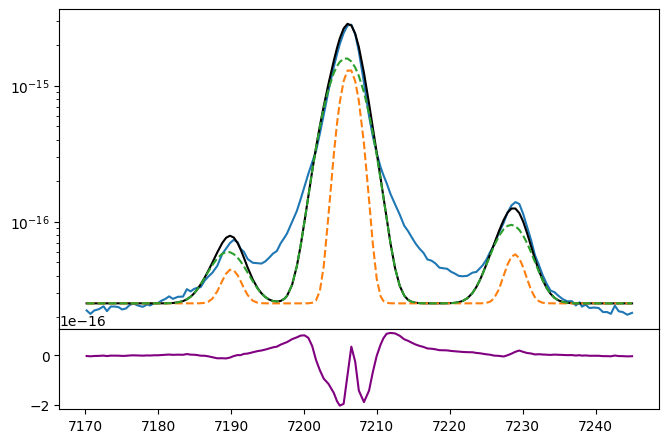

In [32]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 2.5e-17

ha_nar = gaussian(ha_nii.wavelength, 0.4e-14, wave_cat['Ha'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, 0.9e-14, wave_cat['Ha'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, 0.06e-15, wave_cat['[NII]6548'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, 0.2e-15, wave_cat['[NII]6548'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, 0.1e-15, wave_cat['[NII]6584'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, 0.4e-15, wave_cat['[NII]6584'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

ha = ha_nar + ha_brd
niib = niib_nar + niib_brd
niia = niia_nar + niia_brd

ax.plot(ha_nii.wavelength, bkg + niib + ha + niia, color='black')
ax.plot(ha_nii.wavelength, bkg + niib_nar + ha_nar + niia_nar, ls='--')
ax.plot(ha_nii.wavelength, bkg + niib_brd + ha_brd + niia_brd, ls='--')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib - ha - niia, color='purple')

#ax.axvline(7175)
#ax.axvline(7247)
ax.set_yscale('log')

In [33]:
params_ha_nii = Parameters()
params_ha_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ha_nii.add('z_ratio', value=z_ratio, vary=False)
params_ha_nii.add('sigma_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('Ha_nar', value=0.4e-14, min=0.)
params_ha_nii.add('Ha_brd', value=0.9e-14, min=0.)
params_ha_nii.add('Niia_nar', value=0.1e-15, min=0.)
params_ha_nii.add('Niia_brd', value=0.4e-15, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=2.5e-17, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_nar = params_ha_nii['z_nar']
    z_brd = params_ha_nii['z_nar'] * params_ha_nii['z_ratio']
    sigma_nar = params_ha_nii['sigma_nar']
    sigma_brd = params_ha_nii['sigma_brd']
    ha_nar = params_ha_nii['Ha_nar']
    ha_brd = params_ha_nii['Ha_brd']
    niia_nar = params_ha_nii['Niia_nar']
    niia_brd = params_ha_nii['Niia_brd']
    niib_nar = params_ha_nii['Niia_nar']*params_ha_nii['Niib_to_niia']
    niib_brd = params_ha_nii['Niia_brd']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_nar, wave_cat['Ha'], z_nar, sigma_nar) \
             + gaussian(x, ha_brd, wave_cat['Ha'], z_brd, sigma_brd)
    
    model_niia = gaussian(x, niia_nar, wave_cat['[NII]6584'], z_nar, sigma_nar) \
               + gaussian(x, niia_brd, wave_cat['[NII]6584'], z_brd, sigma_brd)
    
    model_niib = gaussian(x, niib_nar, wave_cat['[NII]6548'], z_nar, sigma_nar) \
               + gaussian(x, niib_brd, wave_cat['[NII]6548'], z_brd, sigma_brd)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [34]:
np.random.seed(950)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:20<00:00, 31.00it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 78.59260748  79.03158407  86.38757941  28.57768968  30.66252543
 121.61279929  95.97145316]


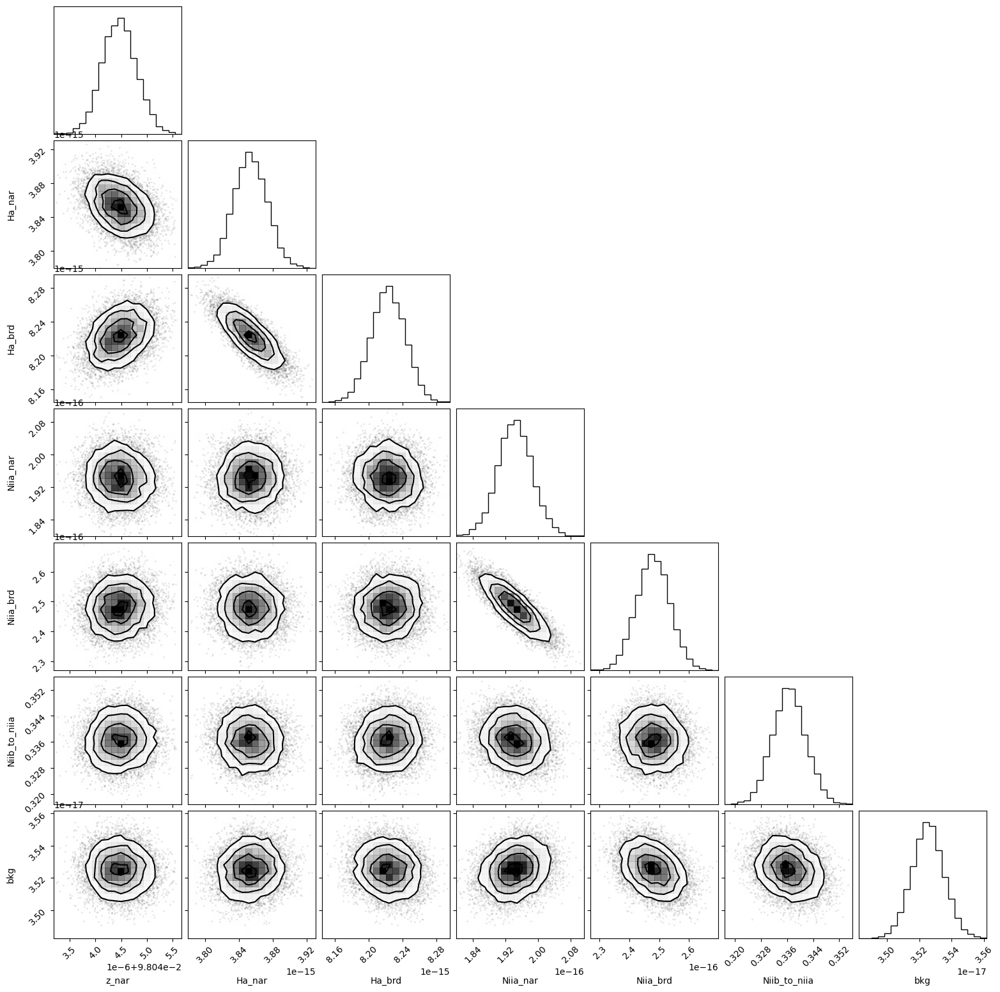

In [35]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [36]:
out_ha_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09804446,3.3438e-07,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.23306578,,,1.2330657765729414,-inf,inf,False
sigma_brd,2.29563919,,,2.295639194683873,-inf,inf,False
Ha_nar,3.8534e-15,1.9754e-17,(0.51%),4e-15,0.00000000,inf,True
Ha_brd,8.2229e-15,2.0191e-17,(0.25%),9e-15,0.00000000,inf,True
Niia_nar,1.9428e-16,4.2091e-18,(2.17%),1e-16,0.00000000,inf,True
Niia_brd,2.4795e-16,5.5717e-18,(2.25%),4e-16,0.00000000,inf,True
Niib_to_niia,0.33661485,0.00519428,(1.54%),0.3333333333333333,0.00000000,1.00000000,True
bkg,3.5254e-17,9.8881e-20,(0.28%),2.5e-17,-inf,inf,True


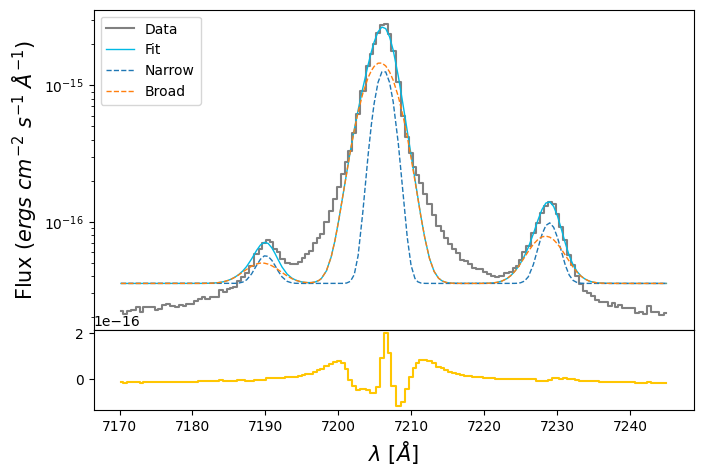

In [37]:
ha_nar_flux = out_ha_nii.flatchain.Ha_nar.mean()
ha_nar_std = out_ha_nii.flatchain.Ha_nar.std()

ha_brd_flux = out_ha_nii.flatchain.Ha_brd.mean()
ha_brd_std = out_ha_nii.flatchain.Ha_brd.std()

niia_nar_flux = out_ha_nii.flatchain.Niia_nar.mean()
niia_nar_std = out_ha_nii.flatchain.Niia_nar.std()

niia_brd_flux = out_ha_nii.flatchain.Niia_brd.mean()
niia_brd_std = out_ha_nii.flatchain.Niia_brd.std()

niib_nar_flux = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_nar_std = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).std()

niib_brd_flux = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_brd_std = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).std()

z_ha_nii = out_ha_nii.flatchain.z_nar.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_nar.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha_nar = gaussian(ha_nii.wavelength, ha_nar_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, ha_brd_flux, wave_cat['Ha'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, niia_nar_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, niia_brd_flux, wave_cat['[NII]6584'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, niib_nar_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, niib_brd_flux, wave_cat['[NII]6548'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia = niia_nar + niia_brd
ha = ha_nar + ha_brd
niib = niib_nar + niib_brd

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_nar + ha_nar + niib_nar,
        ls='--', lw=1, label='Narrow')
ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_brd + ha_brd + niib_brd,
        ls='--', lw=1, label='Broad')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
#ax1.set_ylim(-5*bkg_ha_nii, 5*bkg_ha_nii)
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
#ax.text(x=7008, y=1.5e-13, s=r'[NII]$\lambda$6548 + H$\alpha$ + [NII]$\lambda$6584',
#       fontsize=15)
ax.legend(loc='upper left')

In [38]:
# EW
EW_Ha_nar = ufloat(ha_nar_flux, ha_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha_brd = ufloat(ha_brd_flux, ha_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha = (ufloat(ha_nar_flux, ha_nar_std) + ufloat(ha_brd_flux, ha_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6584_nar = ufloat(niia_nar_flux, niia_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584_brd = ufloat(niia_brd_flux, niia_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = (ufloat(niia_nar_flux, niia_nar_std) + ufloat(niia_brd_flux, niia_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6548_nar = ufloat(niib_nar_flux, niib_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548_brd = ufloat(niib_brd_flux, niib_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = (ufloat(niib_nar_flux, niib_nar_std) + ufloat(niib_brd_flux, niib_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

### Arc lines

In [39]:
wave_cat['[OII]7330']*(1 + z_BN[igal])

8048.80517665

In [40]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7330 = [wave_cat['[OII]7330']*(1 + z_BN[igal]) - 10, wave_cat['[OII]7330']*(1 + z_BN[igal]) + 10]
mask_arc_7330 = (wcal_red[17].data['wave_soln'][0] >= wlims_7330[0]) & (wcal_red[17].data['wave_soln'][0] < wlims_7330[1])

# Arc spectra around the fitted line
x_arc_7330 = wcal_red[17].data['wave_soln'][0][mask_arc_7330]
y_arc_7330 = wcal_red[17].data['spec'][0][mask_arc_7330]

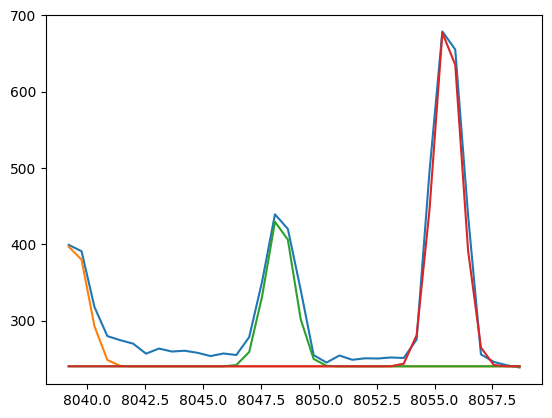

In [41]:
plt.plot(x_arc_7330, y_arc_7330)
plt.plot(x_arc_7330, 240 + gaussian(x_arc_7330, 250, 8039.4, 0, 0.6))
plt.plot(x_arc_7330, 240 + gaussian(x_arc_7330, 300, 8048.3, 0, 0.6))
plt.plot(x_arc_7330, 240 + gaussian(x_arc_7330, 700, 8055.55, 0, 0.6))

In [42]:
params_arc_7330 = Parameters()
params_arc_7330.add('z', value=0.0, vary=False)
params_arc_7330.add('mu1', value= 8039.4, vary=True)
params_arc_7330.add('mu2', value= 8048.3, vary=True)
params_arc_7330.add('mu3', value=8055.55, vary=True)
params_arc_7330.add('arc1', value=250, min=0.)
params_arc_7330.add('arc2', value=300, min=0.)
params_arc_7330.add('arc3', value=700, min=0.)
params_arc_7330.add('sigma', value=0.6, min=0.)
params_arc_7330.add('bkg', value=240, vary=True)

def residual_arc_7330(params_arc_7330, x, data, uncertainty):
    
    z = params_arc_7330['z']
    mu1 = params_arc_7330['mu1']
    mu2 = params_arc_7330['mu2']
    mu3 = params_arc_7330['mu3']
    flux1 = params_arc_7330['arc1']
    flux2 = params_arc_7330['arc2']
    flux3 = params_arc_7330['arc3']
    sigma = params_arc_7330['sigma']
    bkg = params_arc_7330['bkg']
    
    x = x_arc_7330
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_7330) / (0.05 * np.max(y_arc_7330))

np.random.seed(950)
out_arc_7330 = minimize(residual_arc_7330, params_arc_7330, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:00<00:00, 41.59it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [80.19991071 68.35637675 65.7168187  79.3642242  75.69678145 84.4935123
 88.04164335 72.02043447]


In [43]:
out_arc_7330.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,8039.42648,0.22589805,(0.00%),8039.4,-inf,inf,True
mu2,8048.32285,0.11463862,(0.00%),8048.3,-inf,inf,True
mu3,8055.55646,0.04831815,(0.00%),8055.55,-inf,inf,True
arc1,257.447467,53.4070577,(20.74%),250,0.00000000,inf,True
arc2,317.160836,46.0192857,(14.51%),300,0.00000000,inf,True
arc3,742.576241,52.7808873,(7.11%),700,0.00000000,inf,True
sigma,0.64893285,0.04522180,(6.97%),0.6,0.00000000,inf,True
bkg,252.607861,7.73065117,(3.06%),240,-inf,inf,True


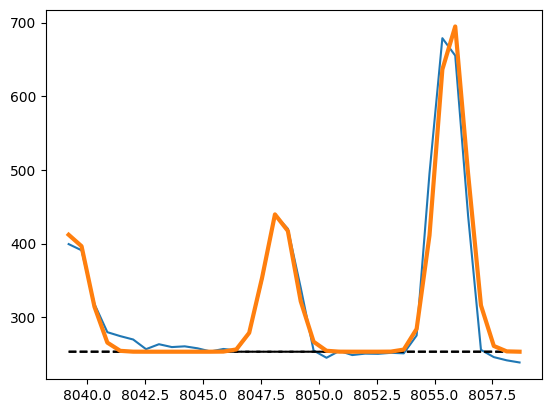

In [44]:
arc1_7330 = out_arc_7330.flatchain.arc1.mean()
arc2_7330 = out_arc_7330.flatchain.arc2.mean()
arc3_7330 = out_arc_7330.flatchain.arc3.mean()

mu1_7330 = out_arc_7330.flatchain.mu1.mean()
mu2_7330 = out_arc_7330.flatchain.mu2.mean()
mu3_7330 = out_arc_7330.flatchain.mu3.mean()

sigma_arc_7330 = out_arc_7330.flatchain.sigma.mean()
bkg_arc_7330 = out_arc_7330.flatchain.bkg.mean()

plt.plot(x_arc_7330, y_arc_7330)

plt.plot(x_arc_7330, bkg_arc_7330 + gaussian(x_arc_7330, arc1_7330, mu1_7330, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, bkg_arc_7330 + gaussian(x_arc_7330, arc2_7330, mu2_7330, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, bkg_arc_7330 + gaussian(x_arc_7330, arc3_7330, mu3_7330, 0, sigma_arc_7330), ls='--', color='black')

plt.plot(x_arc_7330, bkg_arc_7330 + gaussian(x_arc_7330, arc1_7330, mu1_7330, 0, sigma_arc_7330) \
                                  + gaussian(x_arc_7330, arc2_7330, mu2_7330, 0, sigma_arc_7330) \
                                  + gaussian(x_arc_7330, arc3_7330, mu3_7330, 0, sigma_arc_7330), lw=3
)

### Line fitting

In [45]:
sigma_nar_7330 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7330**2))
sigma_brd_7330 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7330**2))

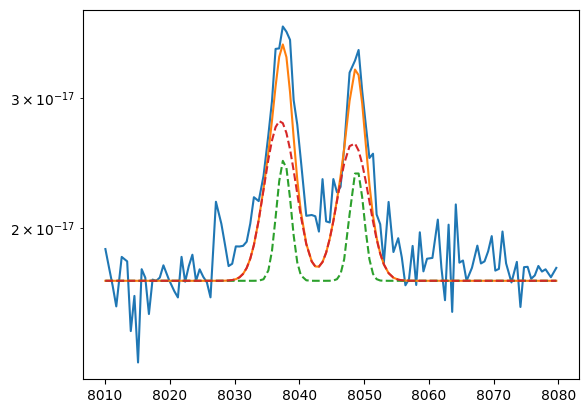

In [46]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

oiia_nar = gaussian(oii_7320.wavelength, 1.8e-17, wave_cat['[OII]7330'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiia_brd = gaussian(oii_7320.wavelength, 5e-17, wave_cat['[OII]7330'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiib_nar = gaussian(oii_7320.wavelength, 2e-17, wave_cat['[OII]7319'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiib_brd = gaussian(oii_7320.wavelength, 6e-17, wave_cat['[OII]7319'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd
bkg = 1.7e-17

plt.plot(oii_7320.wavelength, bkg + oiib + oiia)
plt.plot(oii_7320.wavelength, bkg + oiib_nar + oiia_nar, ls='--')
plt.plot(oii_7320.wavelength, bkg + oiib_brd + oiia_brd, ls='--')

plt.yscale('log')

In [47]:
params_oii_7320 = Parameters()
params_oii_7320.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_7320.add('z_ratio', value=z_ratio, vary=False)
params_oii_7320.add('sigma_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('Oiia_nar', value=1.8e-17, min=0.)
params_oii_7320.add('Oiia_brd', value=5.0e-17, min=0.)
params_oii_7320.add('Oiib_nar', value=2.0e-17, min=0.)
params_oii_7320.add('Oiib_brd', value=6.0e-17, min=0.)
params_oii_7320.add('bkg', value=1.7e-17, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_nar = params_oii_7320['z_nar']
    z_brd = params_oii_7320['z_nar'] * params_oii_7320['z_ratio']
    sigma_nar = params_oii_7320['sigma_nar']
    sigma_brd = params_oii_7320['sigma_brd']
    oiia_nar_flux = params_oii_7320['Oiia_nar']
    oiia_brd_flux = params_oii_7320['Oiia_brd']
    oiib_nar_flux = params_oii_7320['Oiib_nar']
    oiib_brd_flux = params_oii_7320['Oiib_brd']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_nar_flux, wave_cat['[OII]7330'], z_nar, sigma_nar) + \
                 gaussian(x, oiia_brd_flux, wave_cat['[OII]7330'], z_brd, sigma_brd)
    model_oiib = gaussian(x, oiib_nar_flux, wave_cat['[OII]7319'], z_nar, sigma_nar) + \
                 gaussian(x, oiib_brd_flux, wave_cat['[OII]7319'], z_brd, sigma_brd)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [48]:
np.random.seed(950)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:21<00:00, 30.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [50.97800147 54.94584399 59.98815163 57.18638294 65.76554912 48.64562037]


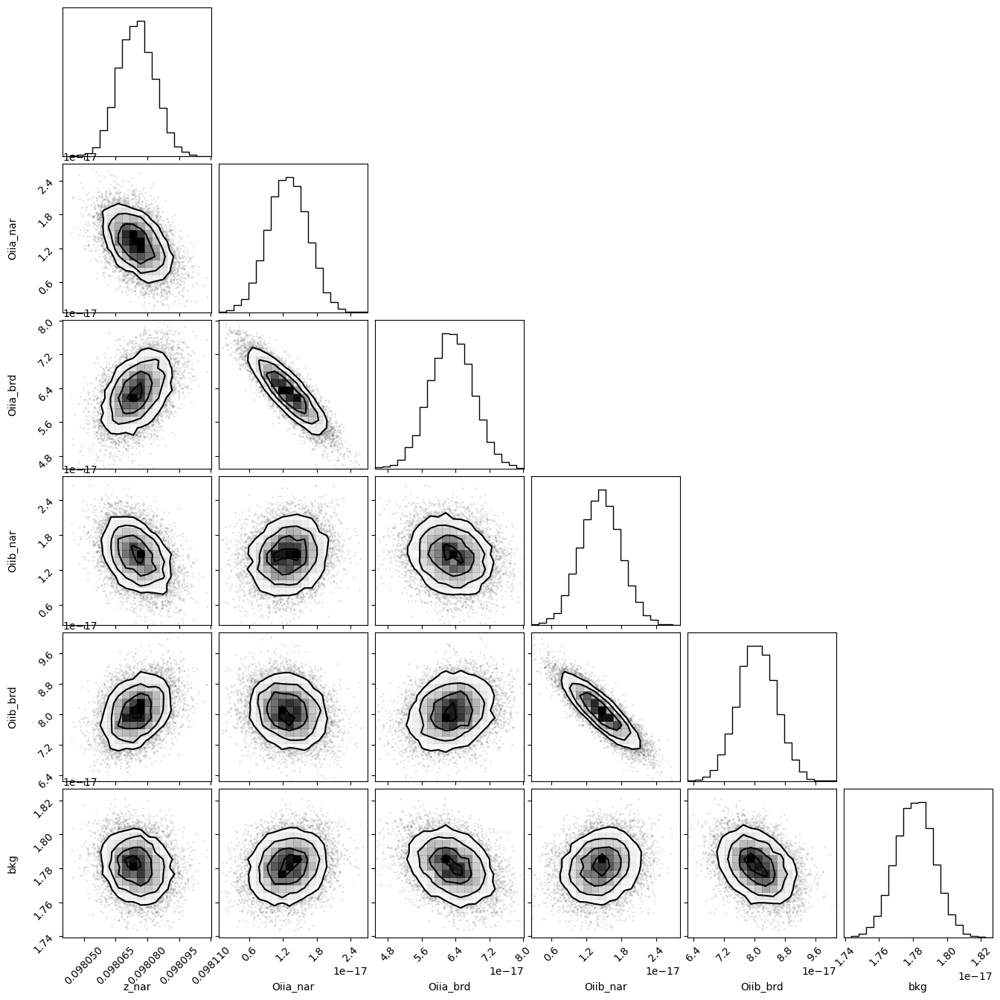

In [49]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);

In [50]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09807489,8.5409e-06,(0.01%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.03281235,,,1.0328123518008132,-inf,inf,False
sigma_brd,2.19458640,,,2.1945863976717153,-inf,inf,False
Oiia_nar,1.2861e-17,3.5590e-18,(27.67%),1.8e-17,0.00000000,inf,True
Oiia_brd,6.3077e-17,5.1465e-18,(8.16%),5e-17,0.00000000,inf,True
Oiib_nar,1.4466e-17,3.4598e-18,(23.92%),2e-17,0.00000000,inf,True
Oiib_brd,8.0711e-17,5.0644e-18,(6.27%),6e-17,0.00000000,inf,True
bkg,1.7812e-17,1.1461e-19,(0.64%),1.7e-17,0.00000000,inf,True


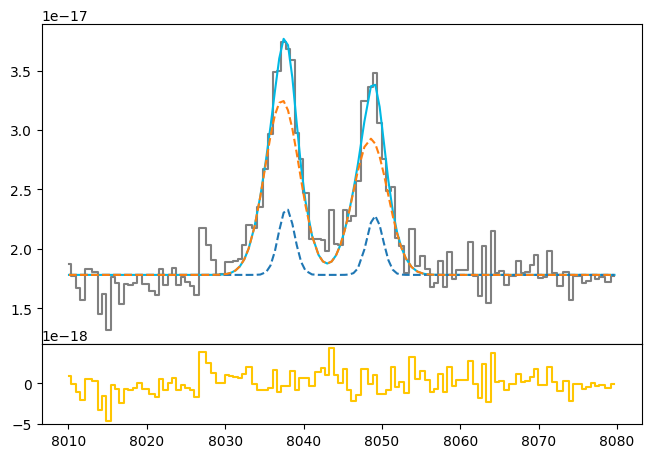

In [51]:
oiia_nar_flux = out_oii_7320.flatchain.Oiia_nar.mean()
oiia_nar_std = out_oii_7320.flatchain.Oiia_nar.std()

oiia_brd_flux = out_oii_7320.flatchain.Oiia_brd.mean()
oiia_brd_std = out_oii_7320.flatchain.Oiia_brd.std()

oiib_nar_flux = out_oii_7320.flatchain.Oiib_nar.mean()
oiib_nar_std = out_oii_7320.flatchain.Oiib_nar.std()

oiib_brd_flux = out_oii_7320.flatchain.Oiib_brd.mean()
oiib_brd_std = out_oii_7320.flatchain.Oiib_brd.std()

z_oii_7320 = out_oii_7320.flatchain.z_nar.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_nar.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_nar + oiib_nar, ls='--')
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_brd + oiib_brd, ls='--')
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

In [52]:
# EW
EW_OII_7330_nar = ufloat(oiia_nar_flux, oiia_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330_brd = ufloat(oiia_brd_flux, oiia_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330 = (ufloat(oiia_nar_flux, oiia_nar_std) + ufloat(oiia_brd_flux, oiia_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

EW_OII_7319_nar = ufloat(oiib_nar_flux, oiib_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319_brd = ufloat(oiib_brd_flux, oiib_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = (ufloat(oiib_nar_flux, oiib_nar_std) + ufloat(oiib_brd_flux, oiib_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# HeI 7065

### Arc lines

In [53]:
wave_cat['HeI7065']*(1 + z_BN[igal])

7757.825901650001

In [54]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7065 = [wave_cat['HeI7065']*(1 + z_BN[igal]) + 10, wave_cat['HeI7065']*(1 + z_BN[igal]) + 30]
mask_arc_7065 = (wcal_red[17].data['wave_soln'][0] >= wlims_7065[0]) & (wcal_red[17].data['wave_soln'][0] < wlims_7065[1])

# Arc spectra around the fitted line
x_arc_7065 = wcal_red[17].data['wave_soln'][0][mask_arc_7065]
y_arc_7065 = wcal_red[17].data['spec'][0][mask_arc_7065]

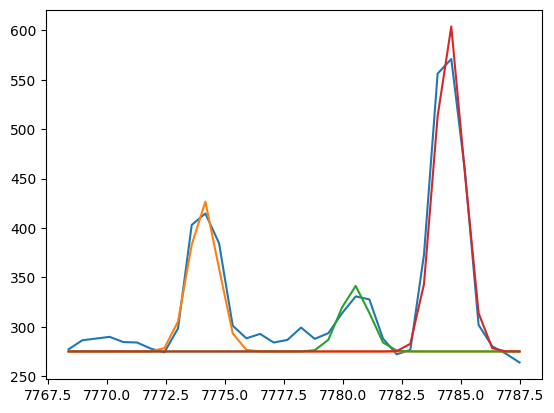

In [55]:
plt.plot(x_arc_7065, y_arc_7065)
plt.plot(x_arc_7065, 275 + gaussian(x_arc_7065, 230, 7774.1, 0, 0.6))
plt.plot(x_arc_7065, 275 + gaussian(x_arc_7065, 100, 7780.5, 0, 0.6))
plt.plot(x_arc_7065, 275 + gaussian(x_arc_7065, 500, 7784.5, 0, 0.6))

In [56]:
params_arc_7065 = Parameters()
params_arc_7065.add('z', value=0.0, vary=False)
params_arc_7065.add('mu1', value=7774.1, vary=False)
params_arc_7065.add('mu2', value=7780.5, vary=False)
params_arc_7065.add('mu3', value=7784.5, vary=False)
params_arc_7065.add('arc1', value=230, min=0.)
params_arc_7065.add('arc2', value=100, min=0.)
params_arc_7065.add('arc3', value=500, min=0.)
params_arc_7065.add('sigma', value=0.6, min=0.)
params_arc_7065.add('bkg', value=275, vary=True)

def residual_arc_7065(params_arc_7065, x, data, uncertainty):
    
    z = params_arc_7065['z']
    mu1 = params_arc_7065['mu1']
    mu2 = params_arc_7065['mu2']
    mu3 = params_arc_7065['mu3']
    flux1 = params_arc_7065['arc1']
    flux2 = params_arc_7065['arc2']
    flux3 = params_arc_7065['arc3']
    sigma = params_arc_7065['sigma']
    bkg = params_arc_7065['bkg']
    
    x = x_arc_7065
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_7065) / (0.05 * np.max(y_arc_7065))

np.random.seed(950)
out_arc_7065 = minimize(residual_arc_7065, params_arc_7065, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:17<00:00, 32.24it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [45.75570011 50.91283089 47.14566297 42.96973637 51.72898296]


In [57]:
out_arc_7065.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7774.10000,,,7774.1,-inf,inf,False
mu2,7780.50000,,,7780.5,-inf,inf,False
mu3,7784.50000,,,7784.5,-inf,inf,False
arc1,245.103349,39.0073279,(15.91%),230,0.00000000,inf,True
arc2,92.6847791,37.3380575,(40.28%),100,0.00000000,inf,True
arc3,514.781953,44.7469044,(8.69%),500,0.00000000,inf,True
sigma,0.65619320,0.05247193,(8.00%),0.6,0.00000000,inf,True
bkg,279.341102,6.60266950,(2.36%),275,-inf,inf,True


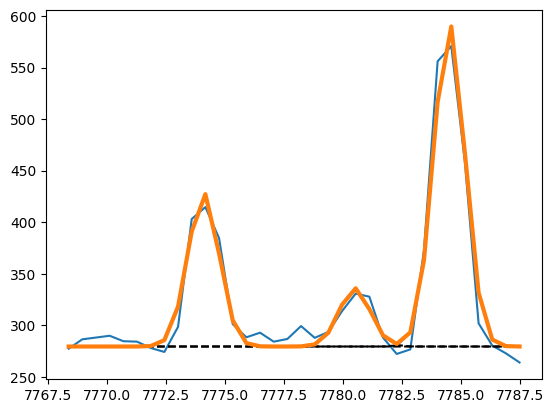

In [58]:
arc1_7065 = out_arc_7065.flatchain.arc1.mean()
arc2_7065 = out_arc_7065.flatchain.arc2.mean()
arc3_7065 = out_arc_7065.flatchain.arc3.mean()
sigma_arc_7065 = out_arc_7065.flatchain.sigma.mean()
bkg_arc_7065 = out_arc_7065.flatchain.bkg.mean()

plt.plot(x_arc_7065, y_arc_7065)

plt.plot(x_arc_7065, bkg_arc_7065 + gaussian(x_arc_7065, arc1_7065, 7774.1, 0, sigma_arc_7065), ls='--', color='black')
plt.plot(x_arc_7065, bkg_arc_7065 + gaussian(x_arc_7065, arc2_7065, 7780.5, 0, sigma_arc_7065), ls='--', color='black')
plt.plot(x_arc_7065, bkg_arc_7065 + gaussian(x_arc_7065, arc3_7065, 7784.5, 0, sigma_arc_7065), ls='--', color='black')

plt.plot(x_arc_7065, bkg_arc_7065 + gaussian(x_arc_7065, arc1_7065, 7774.1, 0, sigma_arc_7065) \
                                  + gaussian(x_arc_7065, arc2_7065, 7780.5, 0, sigma_arc_7065) \
                                  + gaussian(x_arc_7065, arc3_7065, 7784.5, 0, sigma_arc_7065), lw=3)

### Line fitting

In [59]:
sigma_nar_7065 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7065**2))
sigma_brd_7065 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7065**2))

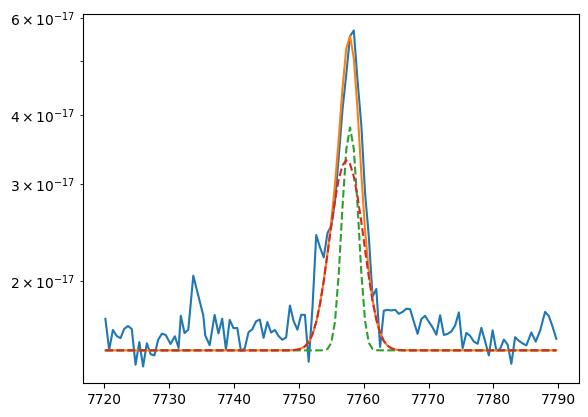

In [60]:
plt.plot(hei_7065.wavelength, hei_7065.flux)
bkg = 1.5e-17

hei7065_nar = gaussian(hei_7065.wavelength, 6e-17, wave_cat['HeI7065'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, 1e-16, wave_cat['HeI7065'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

plt.plot(hei_7065.wavelength, hei7065 + bkg)
plt.plot(hei_7065.wavelength, hei7065_nar + bkg, ls='--')
plt.plot(hei_7065.wavelength, hei7065_brd + bkg, ls='--')
plt.yscale('log')

In [61]:
params_7065 = Parameters()
params_7065.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_7065.add('z_ratio', value=z_ratio, vary=False)
params_7065.add('sigma_hei7065_nar', value=upy.nominal_values(sigma_nar_7065), vary=False)
params_7065.add('sigma_hei7065_brd', value=upy.nominal_values(sigma_brd_7065), vary=False)
params_7065.add('Hei7065_nar', value=6e-17, min=0.)
params_7065.add('Hei7065_brd', value=1e-16, min=0.)
params_7065.add('bkg', value=1.5e-17, min=0.)

def residual_hei7065(params_7065, x, data, uncertainty):
    
    z_nar = params_7065['z_nar']
    z_brd = params_7065['z_nar'] * params_7065['z_ratio']
    sigma_hei7065_nar = params_7065['sigma_hei7065_nar']
    sigma_hei7065_brd = params_7065['sigma_hei7065_brd']
    hei7065_nar_flux = params_7065['Hei7065_nar']
    hei7065_brd_flux = params_7065['Hei7065_brd']
    bkg = params_7065['bkg']
    
    x = hei_7065.wavelength
    model = gaussian(x, hei7065_nar_flux, wave_cat['HeI7065'], z_nar, sigma_hei7065_nar) + \
            gaussian(x, hei7065_brd_flux, wave_cat['HeI7065'], z_brd, sigma_hei7065_brd)
    return (model + bkg - hei_7065.flux) / hei_7065.noise

In [62]:
np.random.seed(950)
out_hei7065 = minimize(residual_hei7065, params_7065, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:12<00:00, 34.32it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [32.84970913 36.58711725 36.7801613  65.65818708]


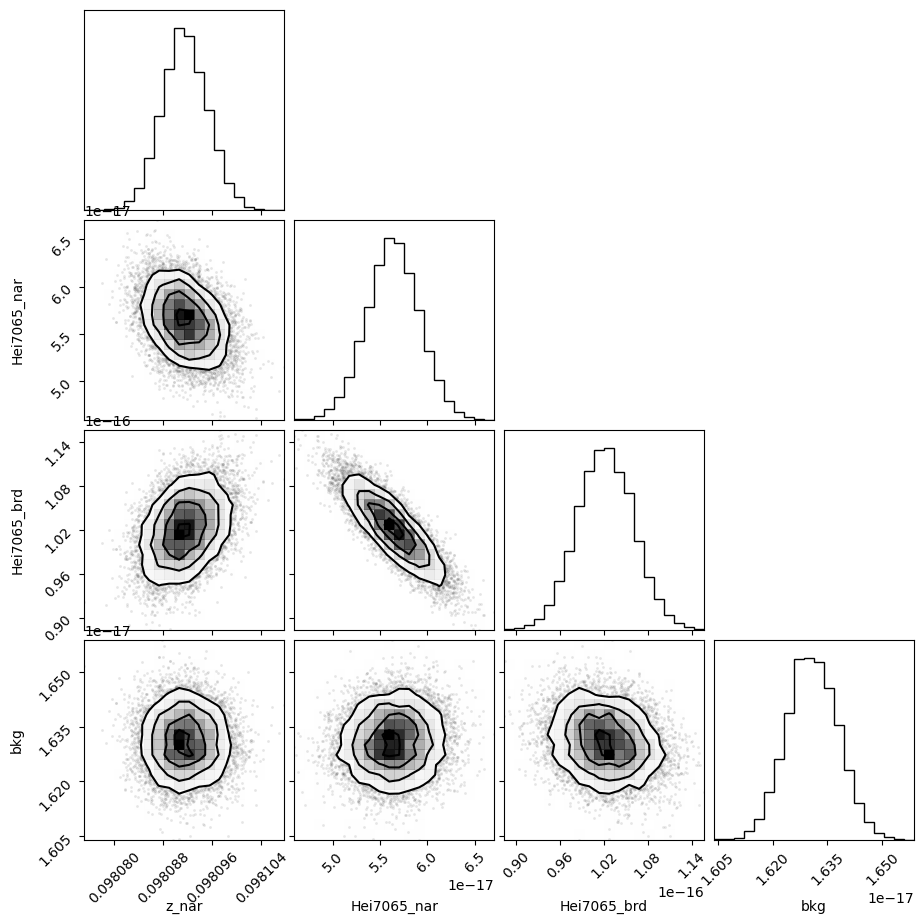

In [63]:
corner.corner(out_hei7065.flatchain, labels=out_hei7065.var_names);

In [64]:
out_hei7065.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09809146,3.6873e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_hei7065_nar,1.04097375,,,1.0409737536593646,-inf,inf,False
sigma_hei7065_brd,2.19843910,,,2.1984390959544586,-inf,inf,False
Hei7065_nar,5.6388e-17,2.7633e-18,(4.90%),6e-17,0.00000000,inf,True
Hei7065_brd,1.0218e-16,3.8263e-18,(3.74%),1e-16,0.00000000,inf,True
bkg,1.6309e-17,7.0233e-20,(0.43%),1.5e-17,0.00000000,inf,True


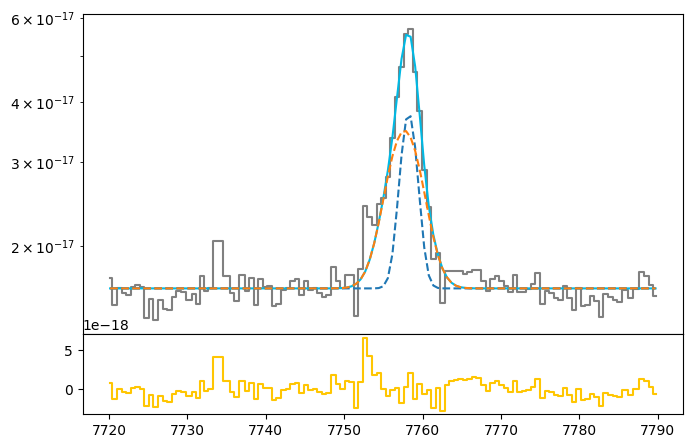

In [65]:
hei7065_nar_flux = out_hei7065.flatchain.Hei7065_nar.mean()
hei7065_nar_std = out_hei7065.flatchain.Hei7065_nar.std()

hei7065_brd_flux = out_hei7065.flatchain.Hei7065_brd.mean()
hei7065_brd_std = out_hei7065.flatchain.Hei7065_brd.std()

z_hei7065 = out_hei7065.flatchain.z_nar.mean()
z_hei7065_std = out_hei7065.flatchain.z_nar.std()

bkg_hei7065 = out_hei7065.flatchain.bkg.mean()
bkg_hei7065_std = out_hei7065.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_7065.wavelength, hei_7065.flux, color='gray', label='Data', where='mid')

hei7065_nar = gaussian(hei_7065.wavelength, hei7065_nar_flux, wave_cat['HeI7065'], z_hei7065, upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, hei7065_brd_flux, wave_cat['HeI7065'], z_hei7065 * z_ratio, upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065, color=c[0])
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_nar, ls='--')
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_7065.wavelength, hei_7065.flux - bkg_hei7065 - hei7065, color=c[3], where='mid')

In [66]:
# EW
EW_hei7065_nar = ufloat(hei7065_nar_flux, hei7065_nar_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065_brd = ufloat(hei7065_brd_flux, hei7065_brd_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065 = (ufloat(hei7065_nar_flux, hei7065_nar_std) + ufloat(hei7065_brd_flux, hei7065_brd_std)) / ufloat(bkg_hei7065, bkg_hei7065_std)

# HeI 6678

### Arc lines

In [67]:
wave_cat['HeI6678']*(1 + z_BN[igal])

7332.843533285

In [68]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6678 = [wave_cat['HeI6678']*(1 + z_BN[igal]) - 10, wave_cat['HeI6678']*(1 + z_BN[igal]) + 5]
mask_arc_6678 = (wcal_red[17].data['wave_soln'][0] >= wlims_6678[0]) & (wcal_red[17].data['wave_soln'][0] < wlims_6678[1])

# Arc spectra around the fitted line
x_arc_6678 = wcal_red[17].data['wave_soln'][0][mask_arc_6678]
y_arc_6678 = wcal_red[17].data['spec'][0][mask_arc_6678]

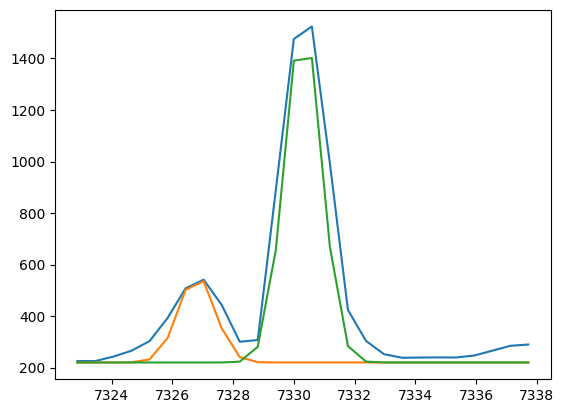

In [69]:
plt.plot(x_arc_6678, y_arc_6678)
plt.plot(x_arc_6678, 220 + gaussian(x_arc_6678,  510, 7326.8, 0, 0.6))
plt.plot(x_arc_6678, 220 + gaussian(x_arc_6678, 2000, 7330.3, 0, 0.6))

In [70]:
params_arc_6678 = Parameters()
params_arc_6678.add('z', value=0.0, vary=False)
params_arc_6678.add('mu1', value=7326.8, vary=True)
params_arc_6678.add('mu2', value=7330.3, vary=True)
params_arc_6678.add('arc1', value=510, min=0.)
params_arc_6678.add('arc2', value=2000, min=0.)
params_arc_6678.add('sigma', value=0.6, min=0.)
params_arc_6678.add('bkg', value=220, vary=True)

def residual_arc_6678(params_arc_6678, x, data, uncertainty):
    
    z = params_arc_6678['z']
    mu1 = params_arc_6678['mu1']
    mu2 = params_arc_6678['mu2']
    flux1 = params_arc_6678['arc1']
    flux2 = params_arc_6678['arc2']
    sigma = params_arc_6678['sigma']
    bkg = params_arc_6678['bkg']
    
    x = x_arc_6678
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_6678) / (0.05 * np.max(y_arc_6678))

np.random.seed(950)
out_arc_6678 = minimize(residual_arc_6678, params_arc_6678, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:09<00:00, 35.79it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [55.62073294 57.80799527 66.75875084 83.49148452 81.37443484 65.22067634]


In [71]:
out_arc_6678.params['arc1'].value

566.6459546680144

In [72]:
out_arc_6678.flatchain.mu1

0       7.326679e+03
1       7.326813e+03
2       7.326869e+03
3       7.326487e+03
4       7.326447e+03
            ...     
9995    7.326721e+03
9996    7.326984e+03
9997    7.326686e+03
9998   -1.346433e+06
9999    7.326776e+03
Name: mu1, Length: 10000, dtype: float64

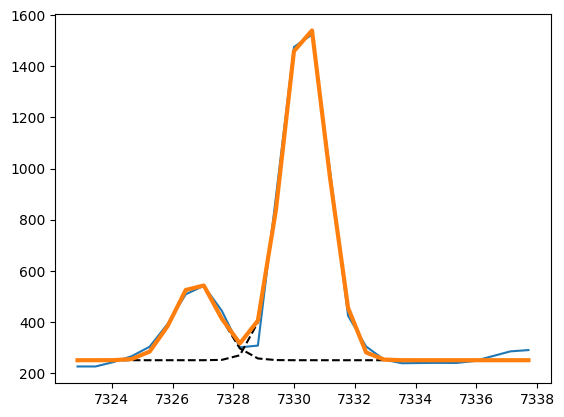

In [73]:
arc1_6678 = out_arc_6678.params['arc1'].value
arc2_6678 = out_arc_6678.flatchain.arc2.mean()

mu1_6678 = out_arc_6678.params['mu1'].value
mu2_6678 = out_arc_6678.flatchain.mu2.mean()

sigma_arc_6678 = out_arc_6678.flatchain.sigma.mean()
bkg_arc_6678 = out_arc_6678.flatchain.bkg.mean()

plt.plot(x_arc_6678, y_arc_6678)

plt.plot(x_arc_6678, bkg_arc_6678 + gaussian(x_arc_6678, arc1_6678, mu1_6678, 0, sigma_arc_6678), ls='--', color='black')
plt.plot(x_arc_6678, bkg_arc_6678 + gaussian(x_arc_6678, arc2_6678, mu2_6678, 0, sigma_arc_6678), ls='--', color='black')

plt.plot(x_arc_6678, bkg_arc_6678 + gaussian(x_arc_6678, arc1_6678, mu1_6678, 0, sigma_arc_6678) \
                                  + gaussian(x_arc_6678, arc2_6678, mu2_6678, 0, sigma_arc_6678), lw=3
)

### Line fitting

In [74]:
sigma_nar_6678 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6678**2))
sigma_brd_6678 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6678**2))

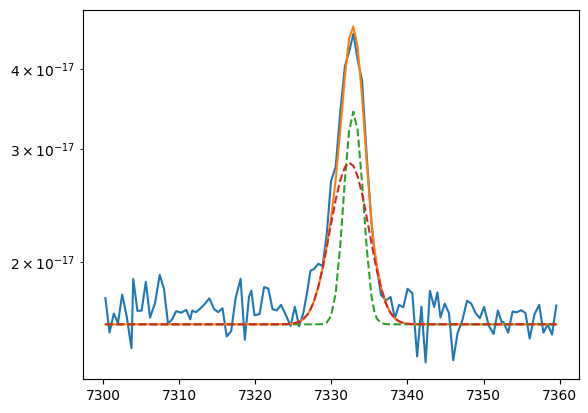

In [75]:
plt.plot(hei_6678.wavelength, hei_6678.flux)
bkg = 1.6e-17

hei6678_nar = gaussian(hei_6678.wavelength, 5e-17, wave_cat['HeI6678'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, 7e-17, wave_cat['HeI6678'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

plt.plot(hei_6678.wavelength, hei6678 + bkg)
plt.plot(hei_6678.wavelength, hei6678_nar + bkg, ls='--')
plt.plot(hei_6678.wavelength, hei6678_brd + bkg, ls='--')
plt.yscale('log')

In [76]:
params_6678 = Parameters()
params_6678.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_6678.add('z_ratio', value=z_ratio, vary=False)
params_6678.add('sigma_hei6678_nar', value=upy.nominal_values(sigma_nar_6678), vary=False)
params_6678.add('sigma_hei6678_brd', value=upy.nominal_values(sigma_brd_6678), vary=False)
params_6678.add('Hei6678_nar', value=5e-17, min=0.)
params_6678.add('Hei6678_brd', value=7e-17, min=0.)
params_6678.add('bkg', value=1.6e-17, min=0.)

def residual_hei6678(params_6678, x, data, uncertainty):
    
    z_nar = params_6678['z_nar']
    z_brd = params_6678['z_nar'] * params_6678['z_ratio']
    sigma_hei6678_nar = params_6678['sigma_hei6678_nar']
    sigma_hei6678_brd = params_6678['sigma_hei6678_brd']
    hei6678_nar_flux = params_6678['Hei6678_nar']
    hei6678_brd_flux = params_6678['Hei6678_brd']
    bkg = params_6678['bkg']
    
    x = hei_6678.wavelength
    model = gaussian(x, hei6678_nar_flux, wave_cat['HeI6678'], z_nar, sigma_hei6678_nar) + \
            gaussian(x, hei6678_brd_flux, wave_cat['HeI6678'], z_brd, sigma_hei6678_brd)
    return (model + bkg - hei_6678.flux) / hei_6678.noise

In [77]:
np.random.seed(950)
out_hei6678 = minimize(residual_hei6678, params_6678, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:09<00:00, 35.97it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [41.30970579 54.36409331 49.16580836 45.16314592]


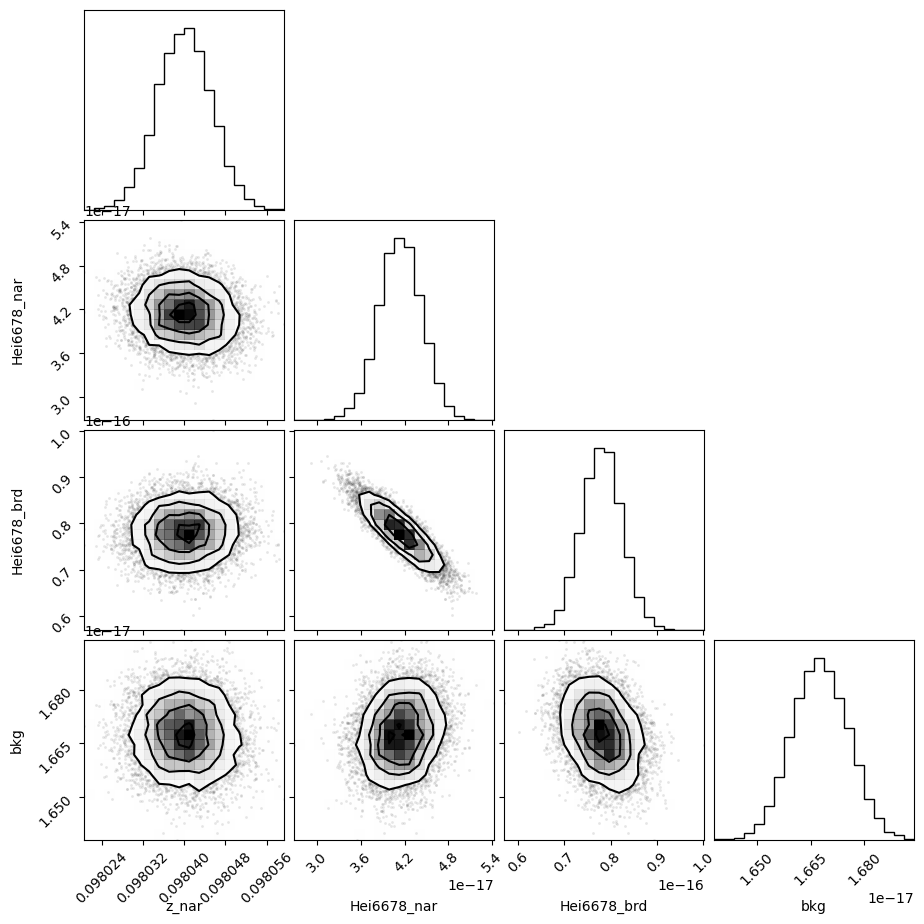

In [78]:
corner.corner(out_hei6678.flatchain, labels=out_hei6678.var_names);

In [79]:
out_hei6678.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09804009,5.2104e-06,(0.01%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_hei6678_nar,1.09020011,,,1.090200107457605,-inf,inf,False
sigma_hei6678_brd,2.22217110,,,2.222171095373613,-inf,inf,False
Hei6678_nar,4.1424e-17,2.8851e-18,(6.96%),5e-17,0.00000000,inf,True
Hei6678_brd,7.8151e-17,4.3206e-18,(5.53%),7e-17,0.00000000,inf,True
bkg,1.6677e-17,7.8668e-20,(0.47%),1.6e-17,0.00000000,inf,True


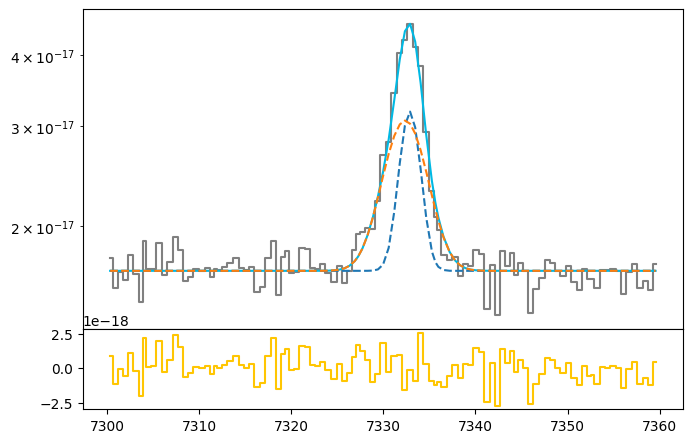

In [80]:
hei6678_nar_flux = out_hei6678.flatchain.Hei6678_nar.mean()
hei6678_nar_std = out_hei6678.flatchain.Hei6678_nar.std()

hei6678_brd_flux = out_hei6678.flatchain.Hei6678_brd.mean()
hei6678_brd_std = out_hei6678.flatchain.Hei6678_brd.std()

z_hei6678 = out_hei6678.flatchain.z_nar.mean()
z_hei6678_std = out_hei6678.flatchain.z_nar.std()

bkg_hei6678 = out_hei6678.flatchain.bkg.mean()
bkg_hei6678_std = out_hei6678.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_6678.wavelength, hei_6678.flux, color='gray', label='Data', where='mid')

hei6678_nar = gaussian(hei_6678.wavelength, hei6678_nar_flux, wave_cat['HeI6678'], z_hei6678, upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, hei6678_brd_flux, wave_cat['HeI6678'], z_hei6678 * z_ratio, upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678, color=c[0])
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_nar, ls='--')
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_6678.wavelength, hei_6678.flux - bkg_hei6678 - hei6678, color=c[3], where='mid')

In [81]:
# EW
EW_hei6678_nar = ufloat(hei6678_nar_flux, hei6678_nar_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678_brd = ufloat(hei6678_brd_flux, hei6678_brd_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678 = (ufloat(hei6678_nar_flux, hei6678_nar_std) + ufloat(hei6678_brd_flux, hei6678_brd_std)) / ufloat(bkg_hei6678, bkg_hei6678_std)

# HeI 5875

### Arc lines

In [82]:
wave_cat['HeI5875']*(1 + z_BN[igal])

6451.637504735

In [83]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5875 = [wave_cat['HeI5875']*(1 + z_BN[igal]), wave_cat['HeI5875']*(1 + z_BN[igal]) + 10]
mask_arc_5875 = (wcal_red[15].data['wave_soln'][0] >= wlims_5875[0]) & (wcal_red[15].data['wave_soln'][0] < wlims_5875[1])

# Arc spectra around the fitted line
x_arc_5875 = wcal_red[15].data['wave_soln'][0][mask_arc_5875]
y_arc_5875 = wcal_red[15].data['spec'][0][mask_arc_5875]

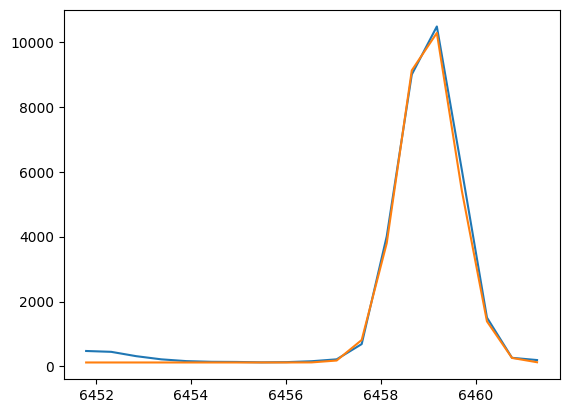

In [84]:
plt.plot(x_arc_5875, y_arc_5875)
plt.plot(x_arc_5875, 120 + gaussian(x_arc_5875, 16000, 6459, 0, 0.6))
#plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 2600, 6464.4, 0, 0.5))

In [85]:
params_arc_5875 = Parameters()
params_arc_5875.add('z', value=0.0, vary=False)
params_arc_5875.add('mu1', value=6459, vary=False)
params_arc_5875.add('arc1', value=16000, min=0.)
params_arc_5875.add('sigma', value=0.6, min=0.)
params_arc_5875.add('bkg', value=120, vary=False)

def residual_arc_5875(params_arc_5875, x, data, uncertainty):
    
    z = params_arc_5875['z']
    mu1 = params_arc_5875['mu1']
    flux1 = params_arc_5875['arc1']
    sigma = params_arc_5875['sigma']
    bkg = params_arc_5875['bkg']
    
    x = x_arc_5875
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model = bkg + model1
    return (model - y_arc_5875) / (0.05 * np.max(y_arc_5875))


np.random.seed(950)
out_arc_5875 = minimize(residual_arc_5875, params_arc_5875, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:55<00:00, 45.05it/s]


In [86]:
out_arc_5875.params['arc1'].value

16640.903679780065

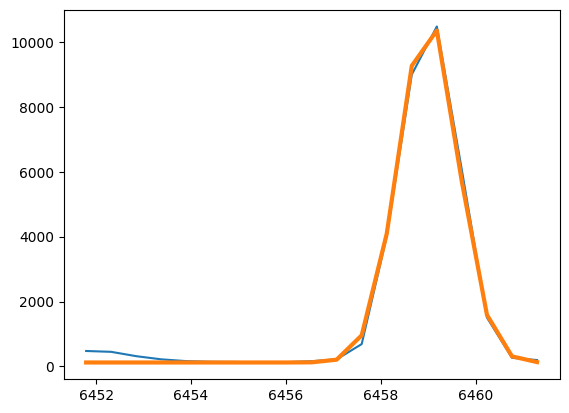

In [87]:
arc1_5875 = out_arc_5875.params['arc1'].value
mu1_5875 = out_arc_5875.params['mu1'].value
sigma_arc_5875 = out_arc_5875.flatchain.sigma.mean()
bkg_arc_5875 = out_arc_5875.params['bkg'].value

plt.plot(x_arc_5875, y_arc_5875)

plt.plot(x_arc_5875, bkg_arc_5875 + gaussian(x_arc_5875, arc1_5875, mu1_5875, 0, sigma_arc_5875), ls='--', color='black')

plt.plot(x_arc_5875, bkg_arc_5875 + gaussian(x_arc_5875, arc1_5875, mu1_5875, 0, sigma_arc_5875), lw=3)

### Line fitting

In [88]:
sigma_nar_5875 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5875**2))
sigma_brd_5875 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5875**2))

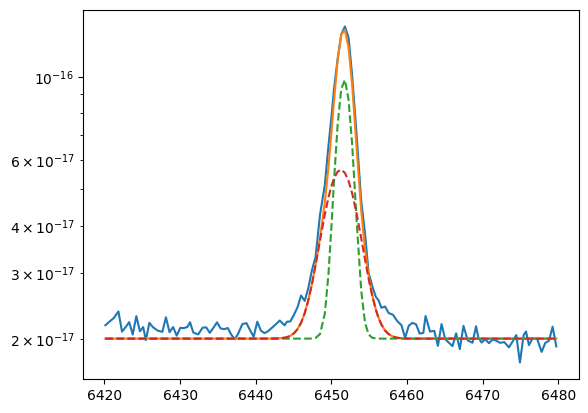

In [89]:
plt.plot(hei_5875.wavelength, hei_5875.flux)
bkg = 2.0e-17

hei5875_nar = gaussian(hei_5875.wavelength, 2e-16, wave_cat['HeI5875'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, 2e-16, wave_cat['HeI5875'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

plt.plot(hei_5875.wavelength, hei5875 + bkg)
plt.plot(hei_5875.wavelength, hei5875_nar + bkg, ls='--')
plt.plot(hei_5875.wavelength, hei5875_brd + bkg, ls='--')
plt.yscale('log')

In [90]:
params_5875 = Parameters()
params_5875.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_5875.add('z_ratio', value=z_ratio, vary=False)
params_5875.add('sigma_hei5875_nar', value=upy.nominal_values(sigma_nar_5875), vary=False)
params_5875.add('sigma_hei5875_brd', value=upy.nominal_values(sigma_brd_5875), vary=False)
params_5875.add('Hei5875_nar', value=2.0e-16, min=0.)
params_5875.add('Hei5875_brd', value=2.0e-16, min=0.)
params_5875.add('bkg', value=2.0e-17, min=0.)

def residual_hei5875(params_5875, x, data, uncertainty):
    
    z_nar = params_5875['z_nar']
    z_brd = params_5875['z_nar'] * params_5875['z_ratio']
    sigma_hei5875_nar = params_5875['sigma_hei5875_nar']
    sigma_hei5875_brd = params_5875['sigma_hei5875_brd']
    hei5875_nar_flux = params_5875['Hei5875_nar']
    hei5875_brd_flux = params_5875['Hei5875_brd']
    bkg = params_5875['bkg']
    
    x = hei_5875.wavelength
    model = gaussian(x, hei5875_nar_flux, wave_cat['HeI5875'], z_nar, sigma_hei5875_nar) + \
            gaussian(x, hei5875_brd_flux, wave_cat['HeI5875'], z_brd, sigma_hei5875_brd)
    return (model + bkg - hei_5875.flux) / hei_5875.noise

In [91]:
np.random.seed(950)
out_hei5875 = minimize(residual_hei5875, params_5875, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:09<00:00, 35.90it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [48.9636051  80.59380901 95.45349986 62.56514814]


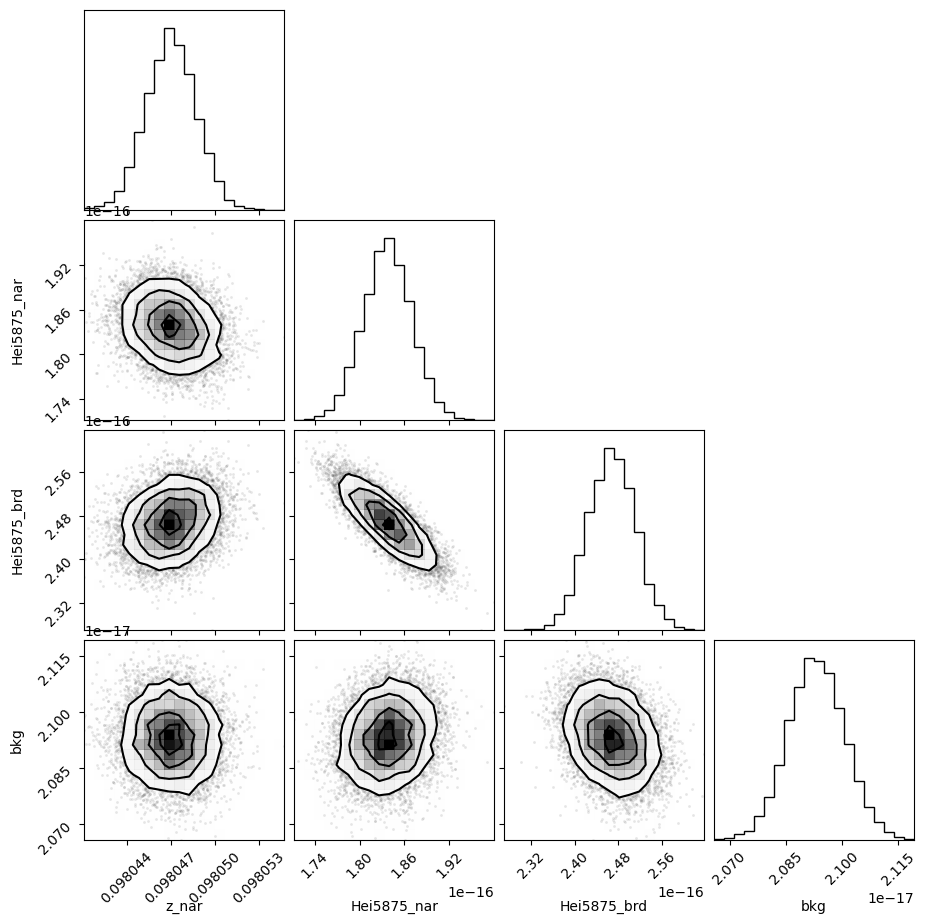

In [92]:
corner.corner(out_hei5875.flatchain, labels=out_hei5875.var_names);

In [93]:
out_hei5875.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09804702,1.6931e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_hei5875_nar,1.01875101,,,1.0187510108430728,-inf,inf,False
sigma_hei5875_brd,2.18800405,,,2.18800405047778,-inf,inf,False
Hei5875_nar,1.8374e-16,3.2180e-18,(1.75%),2e-16,0.00000000,inf,True
Hei5875_brd,2.4679e-16,4.3212e-18,(1.75%),2e-16,0.00000000,inf,True
bkg,2.0931e-17,7.5297e-20,(0.36%),2e-17,0.00000000,inf,True


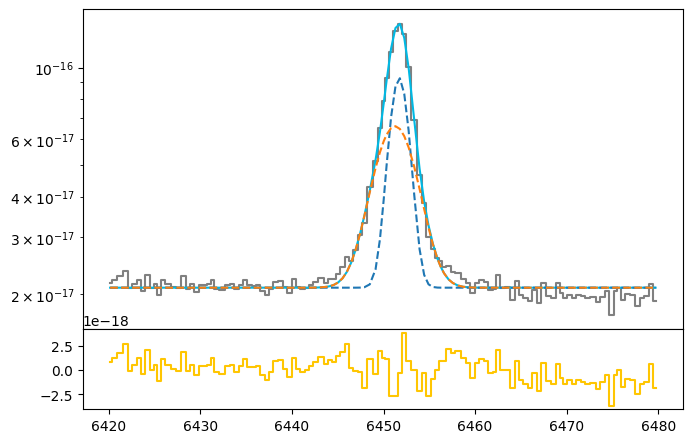

In [94]:
hei5875_nar_flux = out_hei5875.flatchain.Hei5875_nar.mean()
hei5875_nar_std = out_hei5875.flatchain.Hei5875_nar.std()

hei5875_brd_flux = out_hei5875.flatchain.Hei5875_brd.mean()
hei5875_brd_std = out_hei5875.flatchain.Hei5875_brd.std()

z_hei5875 = out_hei5875.flatchain.z_nar.mean()
z_hei5875_std = out_hei5875.flatchain.z_nar.std()

bkg_hei5875 = out_hei5875.flatchain.bkg.mean()
bkg_hei5875_std = out_hei5875.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_5875.wavelength, hei_5875.flux, color='gray', label='Data', where='mid')

hei5875_nar = gaussian(hei_5875.wavelength, hei5875_nar_flux, wave_cat['HeI5875'], z_hei5875, upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, hei5875_brd_flux, wave_cat['HeI5875'], z_hei5875 * z_ratio, upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875, color=c[0])
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_nar, ls='--')
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_5875.wavelength, hei_5875.flux - bkg_hei5875 - hei5875, color=c[3], where='mid')

In [95]:
# EW
EW_hei5875_nar = ufloat(hei5875_nar_flux, hei5875_nar_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875_brd = ufloat(hei5875_brd_flux, hei5875_brd_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875 = (ufloat(hei5875_nar_flux, hei5875_nar_std) + ufloat(hei5875_brd_flux, hei5875_brd_std)) / ufloat(bkg_hei5875, bkg_hei5875_std)

# HeI 4471

### Arc lines

In [96]:
wave_cat['HeI4471']*(1 + z_BN[igal])

4909.841761407

In [97]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4471 = [wave_cat['HeI4471']*(1 + z_BN[igal]) - 10, wave_cat['HeI4471']*(1 + z_BN[igal])]
mask_arc_4471 = (wcal_red[9].data['wave_soln'][0] >= wlims_4471[0]) & (wcal_red[9].data['wave_soln'][0] < wlims_4471[1])

# Arc spectra around the fitted line
x_arc_4471 = wcal_red[9].data['wave_soln'][0][mask_arc_4471]
y_arc_4471 = wcal_red[9].data['spec'][0][mask_arc_4471]

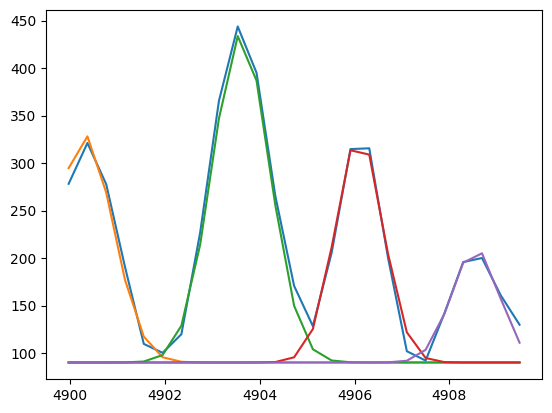

In [98]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 360, 4900.3, 0, 0.6))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 520, 4903.6, 0, 0.6))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 300, 4906.1, 0, 0.5))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 150, 4908.55, 0, 0.5))

100%|███████████████████████████████████████| 2500/2500 [01:33<00:00, 26.84it/s]


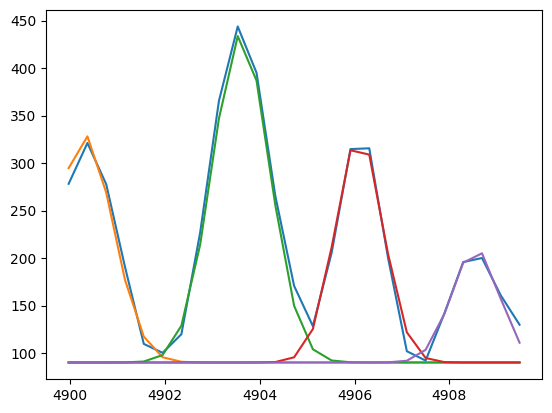

In [99]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 360, 4900.3, 0, 0.6))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 520, 4903.6, 0, 0.6))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 300, 4906.1, 0, 0.5))
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, 150, 4908.55, 0, 0.5))

params_arc_4471 = Parameters()
params_arc_4471.add('z', value=0.0, vary=False)
params_arc_4471.add('mu1', value=4900.3, vary=False)
params_arc_4471.add('mu2', value=4903.6, vary=False)
params_arc_4471.add('mu3', value=4906.1, vary=False)
params_arc_4471.add('mu4', value=4908.55, vary=False)
params_arc_4471.add('arc1', value=360, min=0.)
params_arc_4471.add('arc2', value=520, min=0.)
params_arc_4471.add('arc3', value=300, min=0.)
params_arc_4471.add('arc4', value=150, min=0.)
params_arc_4471.add('sigma', value=0.55, min=0.)
params_arc_4471.add('bkg', value=90, vary=False)

def residual_arc_4471(params_arc_4471, x, data, uncertainty):
    
    z = params_arc_4471['z']
    mu1 = params_arc_4471['mu1']
    mu2 = params_arc_4471['mu2']
    mu3 = params_arc_4471['mu3']
    mu4 = params_arc_4471['mu4']
    flux1 = params_arc_4471['arc1']
    flux2 = params_arc_4471['arc2']
    flux3 = params_arc_4471['arc3']
    flux4 = params_arc_4471['arc4']
    sigma = params_arc_4471['sigma']
    bkg = params_arc_4471['bkg']
    
    x = x_arc_4471
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_4471) / (0.05 * np.max(y_arc_4471))

np.random.seed(950)
out_arc_4471 = minimize(residual_arc_4471, params_arc_4471, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [100]:
out_arc_4471.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4900.30000,,,4900.3,-inf,inf,False
mu2,4903.60000,,,4903.6,-inf,inf,False
mu3,4906.10000,,,4906.1,-inf,inf,False
mu4,4908.55000,,,4908.55,-inf,inf,False
arc1,340.816725,22.1857760,(6.51%),360,0.00000000,inf,True
arc2,526.416027,21.9416764,(4.17%),520,0.00000000,inf,True
arc3,314.874360,19.8256991,(6.30%),300,0.00000000,inf,True
arc4,158.075650,19.7818533,(12.51%),150,0.00000000,inf,True
sigma,0.56827881,0.02095637,(3.69%),0.55,0.00000000,inf,True


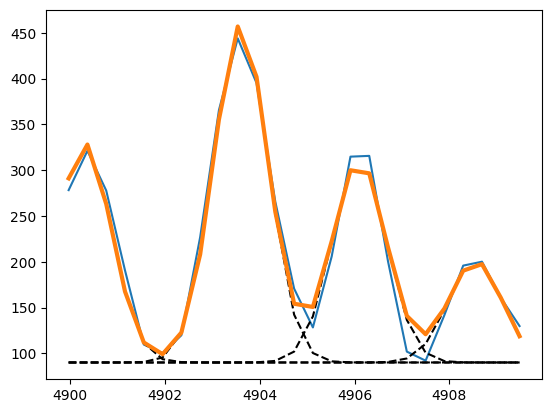

In [101]:
arc1_4471 = out_arc_4471.flatchain.arc1.mean()
arc2_4471 = out_arc_4471.flatchain.arc2.mean()
arc3_4471 = out_arc_4471.flatchain.arc3.mean()
arc4_4471 = out_arc_4471.flatchain.arc4.mean()
sigma_arc_4471 = out_arc_4471.flatchain.sigma.mean()

plt.plot(x_arc_4471, y_arc_4471)

plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, arc1_4471,  4900.3, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, arc2_4471,  4903.6, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, arc3_4471,  4906.1, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, arc4_4471, 4908.55, 0, sigma_arc_4471), ls='--', color='black')

plt.plot(x_arc_4471, 90 + gaussian(x_arc_4471, arc1_4471,  4900.3, 0, sigma_arc_4471) \
                        + gaussian(x_arc_4471, arc2_4471,  4903.6, 0, sigma_arc_4471) \
                        + gaussian(x_arc_4471, arc3_4471,  4906.1, 0, sigma_arc_4471) \
                        + gaussian(x_arc_4471, arc4_4471, 4908.55, 0, sigma_arc_4471), lw=3
)

### Line fitting

In [102]:
sigma_nar_4471 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4471**2))
sigma_brd_4471 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4471**2))

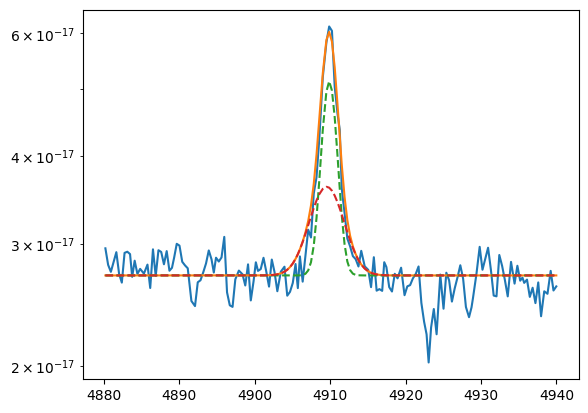

In [103]:
plt.plot(hei_4471.wavelength, hei_4471.flux)
bkg = 2.7e-17

hei4471_nar = gaussian(hei_4471.wavelength, 6e-17, wave_cat['HeI4471'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, 5e-17, wave_cat['HeI4471'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

plt.plot(hei_4471.wavelength, hei4471 + bkg)
plt.plot(hei_4471.wavelength, hei4471_nar + bkg, ls='--')
plt.plot(hei_4471.wavelength, hei4471_brd + bkg, ls='--')
plt.yscale('log')

In [104]:
params_4471 = Parameters()
params_4471.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4471.add('z_ratio', value=z_ratio, vary=False)
params_4471.add('sigma_hei4471_nar', value=upy.nominal_values(sigma_nar_4471), vary=False)
params_4471.add('sigma_hei4471_brd', value=upy.nominal_values(sigma_brd_4471), vary=False)
params_4471.add('Hei4471_nar', value=6e-17, min=0.)
params_4471.add('Hei4471_brd', value=5e-17, min=0.)
params_4471.add('bkg', value=2.7e-17, min=0.)

def residual_hei4471(params_4471, x, data, uncertainty):
    
    z_nar = params_4471['z_nar']
    z_brd = params_4471['z_nar'] * params_4471['z_ratio']
    sigma_hei4471_nar = params_4471['sigma_hei4471_nar']
    sigma_hei4471_brd = params_4471['sigma_hei4471_brd']
    hei4471_nar_flux = params_4471['Hei4471_nar']
    hei4471_brd_flux = params_4471['Hei4471_brd']
    bkg = params_4471['bkg']
    
    x = hei_4471.wavelength
    model = gaussian(x, hei4471_nar_flux, wave_cat['HeI4471'], z_nar, sigma_hei4471_nar) + \
            gaussian(x, hei4471_brd_flux, wave_cat['HeI4471'], z_brd, sigma_hei4471_brd)
    return (model + bkg - hei_4471.flux) / hei_4471.noise

In [105]:
np.random.seed(950)
out_hei4471 = minimize(residual_hei4471, params_4471, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:09<00:00, 36.00it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [40.39634301 61.51258665 66.24280849 35.80751345]


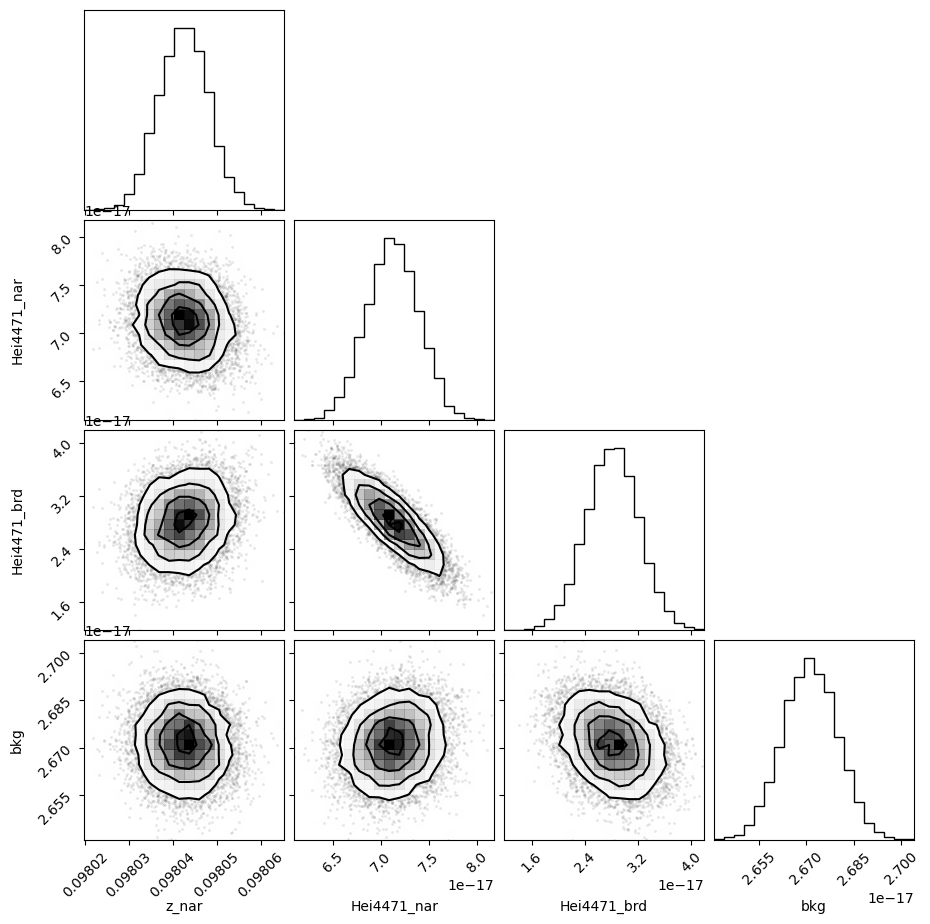

In [106]:
corner.corner(out_hei4471.flatchain, labels=out_hei4471.var_names);

In [107]:
out_hei4471.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09804253,5.6397e-06,(0.01%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_hei4471_nar,0.98747730,,,0.9874773012987518,-inf,inf,False
sigma_hei4471_brd,2.17361899,,,2.17361899223246,-inf,inf,False
Hei4471_nar,7.1271e-17,2.7290e-18,(3.83%),6e-17,0.00000000,inf,True
Hei4471_brd,2.8182e-17,3.9149e-18,(13.89%),5e-17,0.00000000,inf,True
bkg,2.6713e-17,8.5960e-20,(0.32%),2.7e-17,0.00000000,inf,True


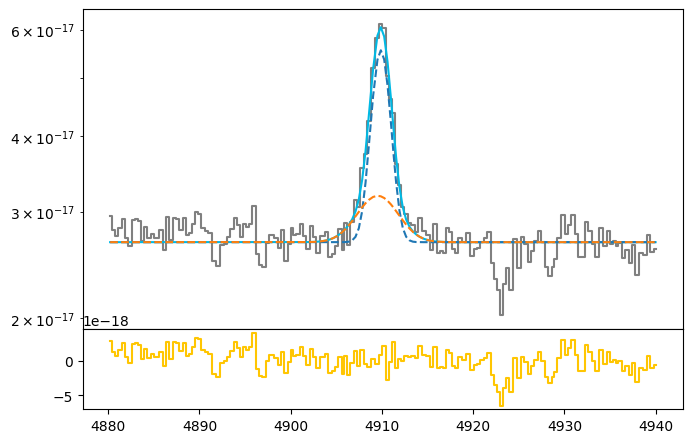

In [108]:
hei4471_nar_flux = out_hei4471.flatchain.Hei4471_nar.mean()
hei4471_nar_std = out_hei4471.flatchain.Hei4471_nar.std()

hei4471_brd_flux = out_hei4471.flatchain.Hei4471_brd.mean()
hei4471_brd_std = out_hei4471.flatchain.Hei4471_brd.std()

z_hei4471 = out_hei4471.flatchain.z_nar.mean()
z_hei4471_std = out_hei4471.flatchain.z_nar.std()

bkg_hei4471 = out_hei4471.flatchain.bkg.mean()
bkg_hei4471_std = out_hei4471.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_4471.wavelength, hei_4471.flux, color='gray', label='Data', where='mid')

hei4471_nar = gaussian(hei_4471.wavelength, hei4471_nar_flux, wave_cat['HeI4471'], z_hei4471, upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, hei4471_brd_flux, wave_cat['HeI4471'], z_hei4471 * z_ratio, upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471, color=c[0])
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_nar, ls='--')
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_4471.wavelength, hei_4471.flux - bkg_hei4471 - hei4471, color=c[3], where='mid')

In [109]:
# EW
EW_hei4471_nar = ufloat(hei4471_nar_flux, hei4471_nar_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471_brd = ufloat(hei4471_brd_flux, hei4471_brd_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471 = (ufloat(hei4471_nar_flux, hei4471_nar_std) + ufloat(hei4471_brd_flux, hei4471_brd_std)) / ufloat(bkg_hei4471, bkg_hei4471_std)

# [SII]6716 + [SII]6730

### Arc lines

In [110]:
wave_cat['[SII]6730']*(1 + z_BN[igal])

7390.670448525

In [111]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6730 = [wave_cat['[SII]6730']*(1 + z_BN[igal]), wave_cat['[SII]6730']*(1 + z_BN[igal]) + 10]
mask_arc_6730 = (wcal_red[17].data['wave_soln'][0] >= wlims_6730[0]) & (wcal_red[17].data['wave_soln'][0] < wlims_6730[1])

# Arc spectra around the fitted line
x_arc_6730 = wcal_red[17].data['wave_soln'][0][mask_arc_6730]
y_arc_6730 = wcal_red[17].data['spec'][0][mask_arc_6730]

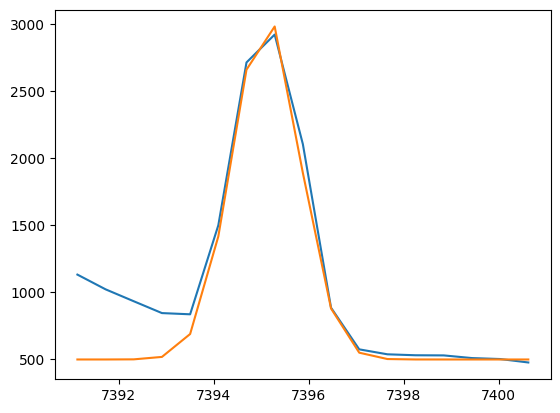

In [112]:
plt.plot(x_arc_6730, y_arc_6730)
plt.plot(x_arc_6730, 500 + gaussian(x_arc_6730, 4500, 7395.1, 0, 0.7))

In [113]:
params_arc_6730 = Parameters()
params_arc_6730.add('z', value=0.0, vary=False)
params_arc_6730.add('mu', value=7395.1, vary=False)
params_arc_6730.add('arc', value=4500, min=0.)
params_arc_6730.add('sigma', value=0.7, min=0.)
params_arc_6730.add('bkg', value=500, vary=False)

def residual_arc_6730(params_arc_6730, x, data, uncertainty):
    
    z = params_arc_6730['z']
    mu = params_arc_6730['mu']
    flux = params_arc_6730['arc']
    sigma = params_arc_6730['sigma']
    bkg = params_arc_6730['bkg']
    
    x = x_arc_6730
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_6730) / 10

np.random.seed(950)
out_arc_6730 = minimize(residual_arc_6730, params_arc_6730, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:46<00:00, 53.57it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [54.34957467 51.94094196]


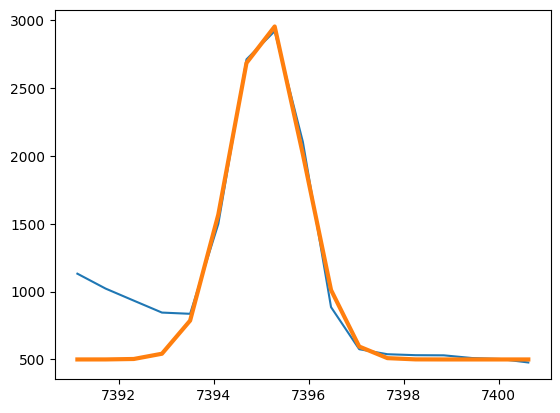

In [114]:
arc_6730 = out_arc_6730.flatchain.arc.mean()
sigma_arc_6730 = out_arc_6730.flatchain.sigma.mean()

plt.plot(x_arc_6730, y_arc_6730)

plt.plot(x_arc_6730, 500 + gaussian(x_arc_6730, arc_6730, 7395.1, 0, sigma_arc_6730), lw=3)

### Line fitting

In [115]:
sigma_nar_6730 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6730**2))
sigma_brd_6730 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6730**2))

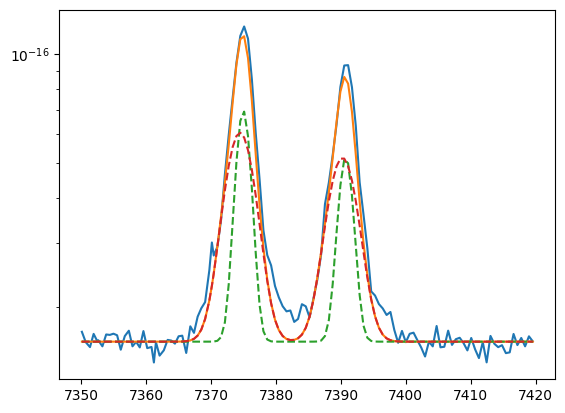

In [116]:
plt.plot(sii.wavelength, sii.flux)
bkg = 1.6e-17

siia_nar = gaussian(sii.wavelength, 1e-16, wave_cat['[SII]6730'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siia_brd = gaussian(sii.wavelength, 2e-16, wave_cat['[SII]6730'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siib_nar = gaussian(sii.wavelength, 1.5e-16, wave_cat['[SII]6716'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siib_brd = gaussian(sii.wavelength, 2.5e-16, wave_cat['[SII]6716'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

plt.plot(sii.wavelength, siia + siib + bkg)
plt.plot(sii.wavelength, siia_nar + siib_nar + bkg, ls='--')
plt.plot(sii.wavelength, siia_brd + siib_brd + bkg, ls='--')
plt.yscale('log')

In [117]:
params_sii = Parameters()
params_sii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_sii.add('z_ratio', value=z_ratio, vary=False)
params_sii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('Siia_nar', value=1.0e-16, min=0.)
params_sii.add('Siia_brd', value=2.0e-16, min=0.)
params_sii.add('Siib_nar', value=1.5e-16, min=0.)
params_sii.add('Siib_brd', value=2.5e-16, min=0.)
params_sii.add('bkg', value=1.6e-17, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_nar = params_sii['z_nar']
    z_brd = params_sii['z_nar'] * params_sii['z_ratio']
    sigma_nar = params_sii['sigma_nar']
    sigma_brd = params_sii['sigma_brd']
    siia_nar_flux = params_sii['Siia_nar']
    siia_brd_flux = params_sii['Siia_brd']
    siib_nar_flux = params_sii['Siib_nar']
    siib_brd_flux = params_sii['Siib_brd']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_nar_flux, wave_cat['[SII]6730'], z_nar, sigma_nar) + \
                 gaussian(x, siia_brd_flux, wave_cat['[SII]6730'], z_brd, sigma_brd)
    model_siib = gaussian(x, siib_nar_flux, wave_cat['[SII]6716'], z_nar, sigma_nar) + \
                 gaussian(x, siib_brd_flux, wave_cat['[SII]6716'], z_brd, sigma_brd)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [118]:
np.random.seed(950)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:25<00:00, 29.33it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [37.14819417 59.83008539 71.00741368 58.3234686  73.28297695 40.98183194]


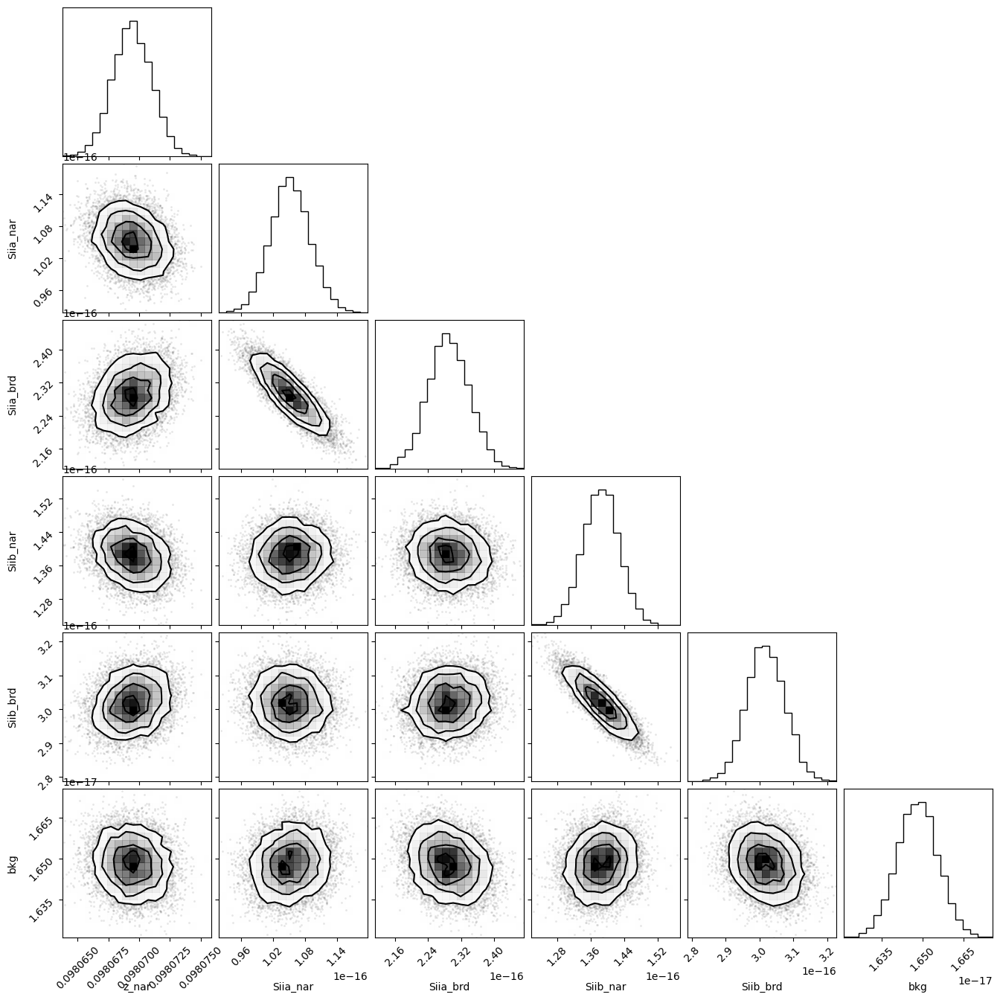

In [119]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);

In [120]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09806942,1.5898e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.11276156,,,1.1127615594077807,-inf,inf,False
sigma_brd,2.23332631,,,2.2333263064113638,-inf,inf,False
Siia_nar,1.0520e-16,3.7130e-18,(3.53%),1e-16,0.00000000,inf,True
Siia_brd,2.2892e-16,5.0399e-18,(2.20%),2e-16,0.00000000,inf,True
Siib_nar,1.3852e-16,4.3023e-18,(3.11%),1.5e-16,0.00000000,inf,True
Siib_brd,3.0184e-16,5.6272e-18,(1.86%),2.5e-16,0.00000000,inf,True
bkg,1.6482e-17,7.5007e-20,(0.46%),1.6e-17,0.00000000,inf,True


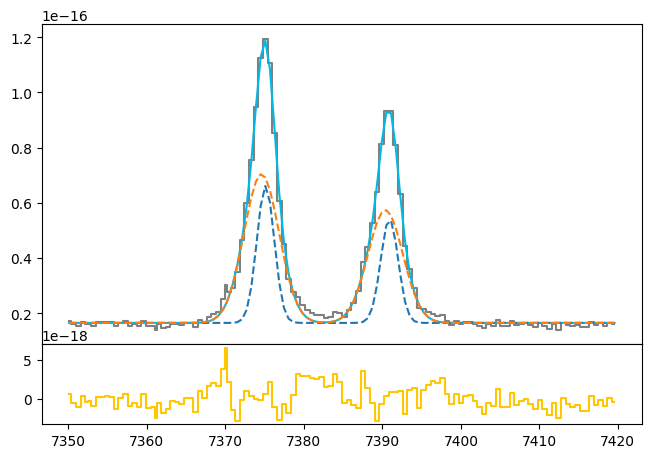

In [121]:
siia_nar_flux = out_sii.flatchain.Siia_nar.mean()
siia_nar_std = out_sii.flatchain.Siia_nar.std()

siia_brd_flux = out_sii.flatchain.Siia_brd.mean()
siia_brd_std = out_sii.flatchain.Siia_brd.std()

siib_nar_flux = out_sii.flatchain.Siib_nar.mean()
siib_nar_std = out_sii.flatchain.Siib_nar.std()

siib_brd_flux = out_sii.flatchain.Siib_brd.mean()
siib_brd_std = out_sii.flatchain.Siib_brd.std()

z_sii = out_sii.flatchain.z_nar.mean()
z_sii_std = out_sii.flatchain.z_nar.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
ax.plot(sii.wavelength, bkg_sii + siia_nar + siib_nar, ls='--')
ax.plot(sii.wavelength, bkg_sii + siia_brd + siib_brd, ls='--')
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

In [122]:
# EW
EW_SII_6730_nar = ufloat(siia_nar_flux, siia_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730_brd = ufloat(siia_brd_flux, siia_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730 = (ufloat(siia_nar_flux, siia_nar_std) + ufloat(siia_brd_flux, siia_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

EW_SII_6716_nar = ufloat(siib_nar_flux, siib_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716_brd = ufloat(siib_brd_flux, siib_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = (ufloat(siib_nar_flux, siib_nar_std) + ufloat(siib_brd_flux, siib_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

# [NII]5755

### Arc lines

In [123]:
wave_cat['[NII]5755']*(1 + z_BN[igal])

6318.741230650001

In [124]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5755 = [wave_cat['[NII]5755']*(1 + z_BN[igal]) + 3, wave_cat['[NII]5755']*(1 + z_BN[igal]) + 13]
mask_arc_5755 = (wcal_red[13].data['wave_soln'][0] >= wlims_5755[0]) & (wcal_red[13].data['wave_soln'][0] < wlims_5755[1])

# Arc spectra around the fitted line
x_arc_5755 = wcal_red[13].data['wave_soln'][0][mask_arc_5755]
y_arc_5755 = wcal_red[13].data['spec'][0][mask_arc_5755]

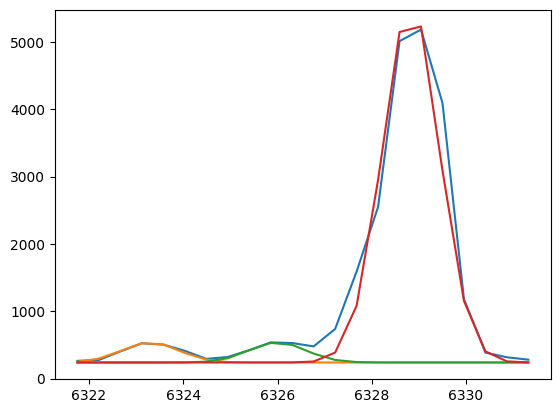

In [125]:
plt.plot(x_arc_5755, y_arc_5755)
plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, 450, 6323.3, 0, 0.6))
plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, 450, 6326, 0, 0.6))
plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, 8000, 6328.83, 0, 0.6))

In [126]:
params_arc_5755 = Parameters()
params_arc_5755.add('z', value=0.0, vary=False)
params_arc_5755.add('mu1', value=6323.3, vary=False)
params_arc_5755.add('mu2', value=6326, vary=False)
params_arc_5755.add('mu3', value=6328.83, vary=False)
params_arc_5755.add('arc1', value=450, min=0.)
params_arc_5755.add('arc2', value=450, min=0.)
params_arc_5755.add('arc3', value=8000, min=0.)
params_arc_5755.add('sigma', value=0.6, min=0.)
params_arc_5755.add('bkg', value=240, vary=False)

def residual_arc_5755(params_arc_5755, x, data, uncertainty):
    
    z = params_arc_5755['z']
    mu1 = params_arc_5755['mu1']
    mu2 = params_arc_5755['mu2']
    mu3 = params_arc_5755['mu3']
    flux1 = params_arc_5755['arc1']
    flux2 = params_arc_5755['arc2']
    flux3 = params_arc_5755['arc3']
    sigma = params_arc_5755['sigma']
    bkg = params_arc_5755['bkg']
    
    x = x_arc_5755
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_5755) / 10

np.random.seed(950)
out_arc_5755 = minimize(residual_arc_5755, params_arc_5755, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:01<00:00, 40.50it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [44.13321188 65.72080203 65.37432384 60.93647782]


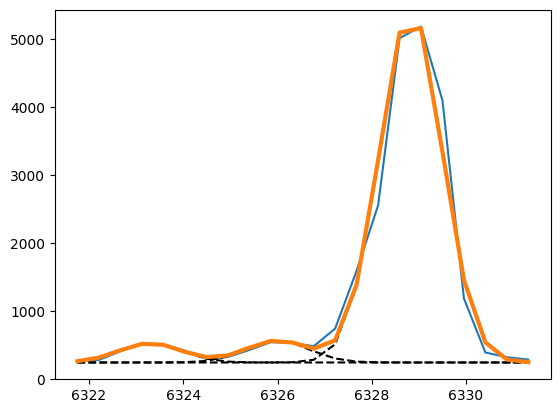

In [127]:
arc1_5755 = out_arc_5755.flatchain.arc1.mean()
arc2_5755 = out_arc_5755.flatchain.arc2.mean()
arc3_5755 = out_arc_5755.flatchain.arc3.mean()
sigma_arc_5755 = out_arc_5755.flatchain.sigma.mean()

plt.plot(x_arc_5755, y_arc_5755)

plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, arc1_5755, 6323.3, 0, sigma_arc_5755), ls='--', color='black')
plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, arc2_5755, 6326, 0, sigma_arc_5755), ls='--', color='black')
plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, arc3_5755, 6328.83, 0, sigma_arc_5755), ls='--', color='black')

plt.plot(x_arc_5755, 240 + gaussian(x_arc_5755, arc1_5755, 6323.3, 0, sigma_arc_5755) \
         + gaussian(x_arc_5755, arc2_5755, 6326, 0, sigma_arc_5755) \
         + gaussian(x_arc_5755, arc3_5755, 6328.83, 0, sigma_arc_5755), lw=3
)

### Line fitting

In [128]:
sigma_nar_5755 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5755**2))
sigma_brd_5755 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5755**2))

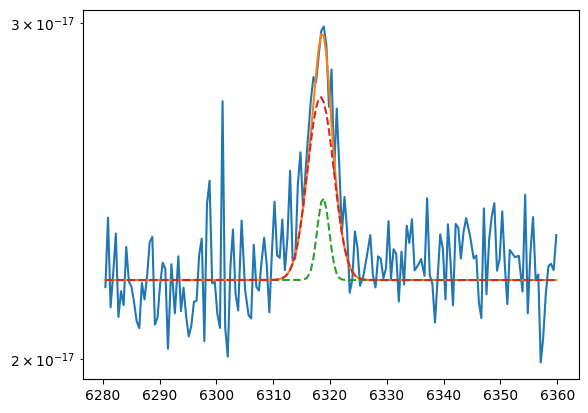

In [129]:
plt.plot(nii_5755.wavelength, nii_5755.flux)
bkg = 2.2e-17

niic_nar = gaussian(nii_5755.wavelength, 0.6e-17, wave_cat['[NII]5755'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5755))
niic_brd = gaussian(nii_5755.wavelength, 3e-17, wave_cat['[NII]5755'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5755))

niic = niic_nar + niic_brd

plt.plot(nii_5755.wavelength, niic + bkg)
plt.plot(nii_5755.wavelength, niic_nar + bkg, ls='--')
plt.plot(nii_5755.wavelength, niic_brd + bkg, ls='--')
plt.yscale('log')

In [130]:
params_nii = Parameters()
params_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_nii.add('z_ratio', value=z_ratio, vary=False)
params_nii.add('sigma_nar', value=upy.nominal_values(sigma_nar_5755), vary=False)
params_nii.add('sigma_brd', value=upy.nominal_values(sigma_brd_5755), vary=False)
params_nii.add('Niic_nar', value=0.6e-17, min=0.)
params_nii.add('Niic_brd', value=3.0e-17, min=0.)
params_nii.add('bkg', value=2.2e-17, min=0.)

def residual_nii(params_nii, x, data, uncertainty):
    
    z_nar = params_nii['z_nar']
    z_brd = params_nii['z_nar'] * params_nii['z_ratio']
    sigma_nar = params_nii['sigma_nar']
    sigma_brd = params_nii['sigma_brd']
    niic_nar_flux = params_nii['Niic_nar']
    niic_brd_flux = params_nii['Niic_brd']
    bkg = params_nii['bkg']
    
    x = nii_5755.wavelength
    model = gaussian(x, niic_nar_flux, wave_cat['[NII]5755'], z_nar, sigma_nar) + \
            gaussian(x, niic_brd_flux, wave_cat['[NII]5755'], z_brd, sigma_brd)
    return (model + bkg - nii_5755.flux) / nii_5755.noise

In [131]:
np.random.seed(950)
out_nii = minimize(residual_nii, params_nii, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:54<00:00, 46.09it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [44.88873911 58.47617498 52.39484139 41.4573304 ]


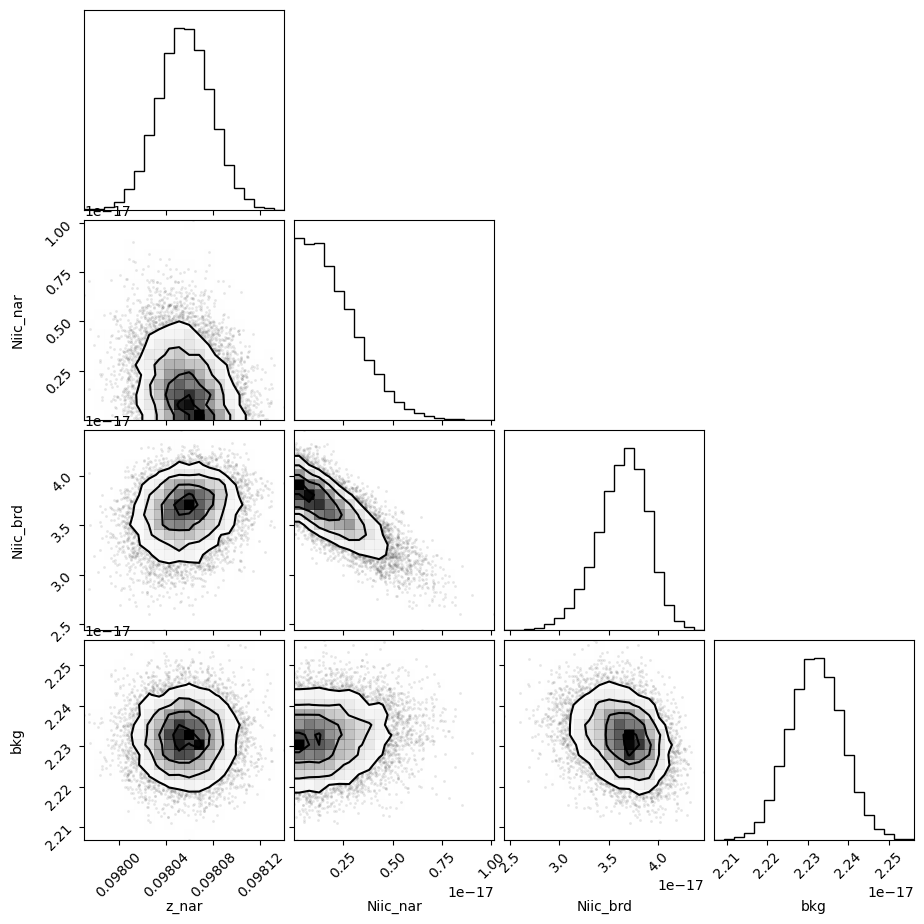

In [132]:
corner.corner(out_nii.flatchain, labels=out_nii.var_names);

In [133]:
out_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09805607,2.2202e-05,(0.02%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.04286258,,,1.0428625834028646,-inf,inf,False
sigma_brd,2.19933410,,,2.199334097101913,-inf,inf,False
Niic_nar,1.7123e-18,1.4703e-18,(85.87%),6e-18,0.00000000,inf,True
Niic_brd,3.6555e-17,2.5205e-18,(6.90%),3e-17,0.00000000,inf,True
bkg,2.2320e-17,6.5051e-20,(0.29%),2.2e-17,0.00000000,inf,True


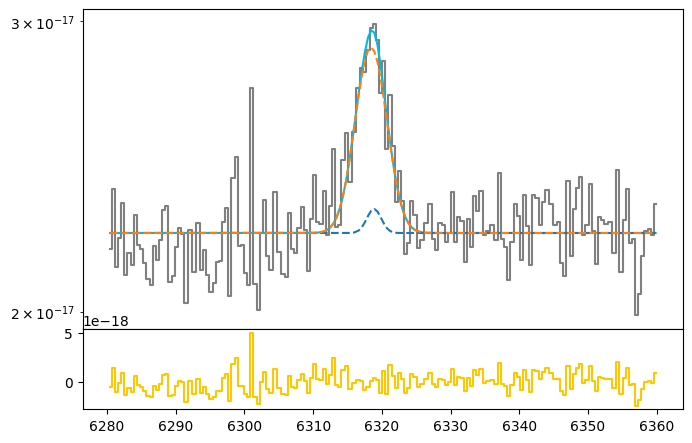

In [134]:
niic_nar_flux = out_nii.flatchain.Niic_nar.mean()
niic_nar_std = out_nii.flatchain.Niic_nar.std()

niic_brd_flux = out_nii.flatchain.Niic_brd.mean()
niic_brd_std = out_nii.flatchain.Niic_brd.std()

z_nii = out_nii.flatchain.z_nar.mean()
z_nii_std = out_nii.flatchain.z_nar.std()

bkg_nii = out_nii.flatchain.bkg.mean()
bkg_nii_std = out_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(nii_5755.wavelength, nii_5755.flux, color='gray', label='Data', where='mid')

niic_nar = gaussian(nii_5755.wavelength, niic_nar_flux, wave_cat['[NII]5755'], z_nii, upy.nominal_values(sigma_nar_5755))
niic_brd = gaussian(nii_5755.wavelength, niic_brd_flux, wave_cat['[NII]5755'], z_nii * z_ratio, upy.nominal_values(sigma_brd_5755))

niic = niic_nar + niic_brd

ax.plot(nii_5755.wavelength, bkg_nii + niic, color=c[0])
ax.plot(nii_5755.wavelength, bkg_nii + niic_nar, ls='--')
ax.plot(nii_5755.wavelength, bkg_nii + niic_brd, ls='--')
ax.set_yscale('log')
ax1.step(nii_5755.wavelength, nii_5755.flux - bkg_nii - niic, color=c[3], where='mid')

In [135]:
# EW
EW_NII_5755_nar = ufloat(niic_nar_flux, niic_nar_std) / ufloat(bkg_nii, bkg_nii_std)
EW_NII_5755_brd = ufloat(niic_brd_flux, niic_brd_std) / ufloat(bkg_nii, bkg_nii_std)
EW_NII_5755 = (ufloat(niic_nar_flux, niic_nar_std) + ufloat(niic_brd_flux, niic_brd_std)) / ufloat(bkg_nii, bkg_nii_std)

# H$\beta$

### Arc lines

In [136]:
wave_cat['Hb']*(1 + z_BN[igal])

5337.932447250001

In [137]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hb = [wave_cat['Hb']*(1 + z_BN[igal]) - 10, wave_cat['Hb']*(1 + z_BN[igal]) + 10]
mask_arc_hb = (wcal_red[11].data['wave_soln'][0] >= wlims_hb[0]) & (wcal_red[11].data['wave_soln'][0] < wlims_hb[1])

# Arc spectra around the fitted line
x_arc_hb = wcal_red[11].data['wave_soln'][0][mask_arc_hb]
y_arc_hb = wcal_red[11].data['spec'][0][mask_arc_hb]

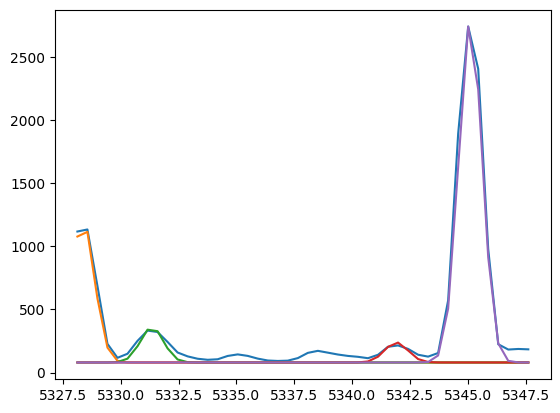

In [138]:
plt.plot(x_arc_hb, y_arc_hb)
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, 1400, 5328.37, 0, 0.5))
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, 350, 5331.35, 0, 0.5))
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, 200, 5341.9, 0, 0.5))
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, 3400, 5345.1, 0, 0.5))

In [139]:
params_arc_hb = Parameters()
params_arc_hb.add('z', value=0.0, vary=False)
params_arc_hb.add('mu1', value=5328.37, vary=False)
params_arc_hb.add('mu2', value=5331.35, vary=False)
params_arc_hb.add('mu3', value=5341.9, vary=False)
params_arc_hb.add('mu4', value=5345.1, vary=False)
params_arc_hb.add('arc1', value=1400, min=0.)
params_arc_hb.add('arc2', value=350, min=0.)
params_arc_hb.add('arc3', value=200, min=0.)
params_arc_hb.add('arc4', value=3400, min=0.)
params_arc_hb.add('sigma', value=0.5, min=0.)
params_arc_hb.add('bkg', value=80, vary=False)

def residual_arc_hb(params_arc_hb, x, data, uncertainty):
    
    z = params_arc_hb['z']
    mu1 = params_arc_hb['mu1']
    mu2 = params_arc_hb['mu2']
    mu3 = params_arc_hb['mu3']
    mu4 = params_arc_hb['mu4']
    flux1 = params_arc_hb['arc1']
    flux2 = params_arc_hb['arc2']
    flux3 = params_arc_hb['arc3']
    flux4 = params_arc_hb['arc4']
    sigma = params_arc_hb['sigma']
    bkg = params_arc_hb['bkg']
    
    x = x_arc_hb
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_hb) / 10

np.random.seed(950)
out_arc_hb = minimize(residual_arc_hb, params_arc_hb, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:11<00:00, 35.11it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [55.39082448 44.17066375 49.67285203 60.07096257 62.77346279]


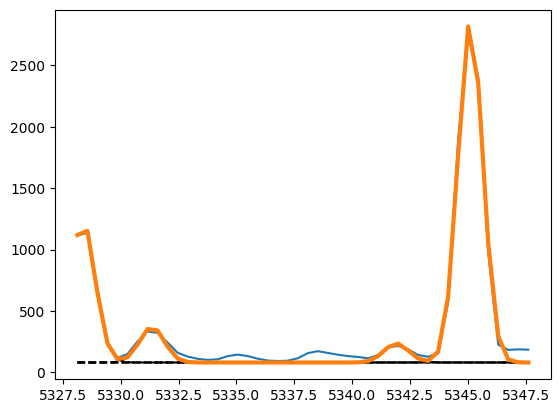

In [140]:
arc1_hb = out_arc_hb.flatchain.arc1.mean()
arc2_hb = out_arc_hb.flatchain.arc2.mean()
arc3_hb = out_arc_hb.flatchain.arc3.mean()
arc4_hb = out_arc_hb.flatchain.arc4.mean()
sigma_arc_hb = out_arc_hb.flatchain.sigma.mean()

plt.plot(x_arc_hb, y_arc_hb)

plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, arc1_hb, 5328.37, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, arc2_hb, 5331.35, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, arc3_hb, 5341.9, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, arc4_hb, 5345.1, 0, sigma_arc_hb), ls='--', color='black')

plt.plot(x_arc_hb, 80 + gaussian(x_arc_hb, arc1_hb, 5328.37, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc2_hb, 5331.35, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc3_hb, 5341.9, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc4_hb, 5345.1, 0, sigma_arc_hb), lw=3
)

### Line fitting

In [141]:
sigma_nar_hb = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hb**2))
sigma_brd_hb = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hb**2))

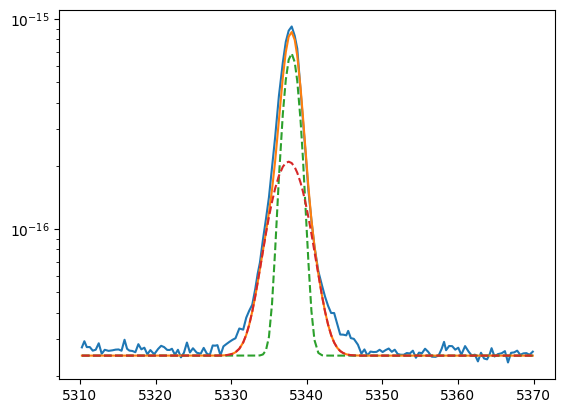

In [142]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 2.5e-17

hb_nar = gaussian(hbeta.wavelength, 1.6e-15, wave_cat['Hb'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, 1.0e-15, wave_cat['Hb'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

plt.plot(hbeta.wavelength, hb + bkg)
plt.plot(hbeta.wavelength, hb_nar + bkg, ls='--')
plt.plot(hbeta.wavelength, hb_brd + bkg, ls='--')
plt.yscale('log')

In [143]:
params_hb = Parameters()
params_hb.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hb.add('z_ratio', value=z_ratio, vary=False)
params_hb.add('sigma_nar', value=upy.nominal_values(sigma_nar_hb), vary=False)
params_hb.add('sigma_brd', value=upy.nominal_values(sigma_brd_hb), vary=False)
params_hb.add('Hb_nar', value=1.6e-15, min=0.)
params_hb.add('Hb_brd', value=1.0e-15, min=0.)
params_hb.add('bkg', value=2.5e-17, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_nar = params_hb['z_nar']
    z_brd = params_hb['z_nar'] * params_hb['z_ratio']
    sigma_nar = params_hb['sigma_nar']
    sigma_brd = params_hb['sigma_brd']
    hb_nar_flux = params_hb['Hb_nar']
    hb_brd_flux = params_hb['Hb_brd']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_nar_flux, wave_cat['Hb'], z_nar, sigma_nar) + \
            gaussian(x, hb_brd_flux, wave_cat['Hb'], z_brd, sigma_brd)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [144]:
np.random.seed(950)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:57<00:00, 43.76it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 23.16187078  50.36736206 102.37106154  94.30844188]


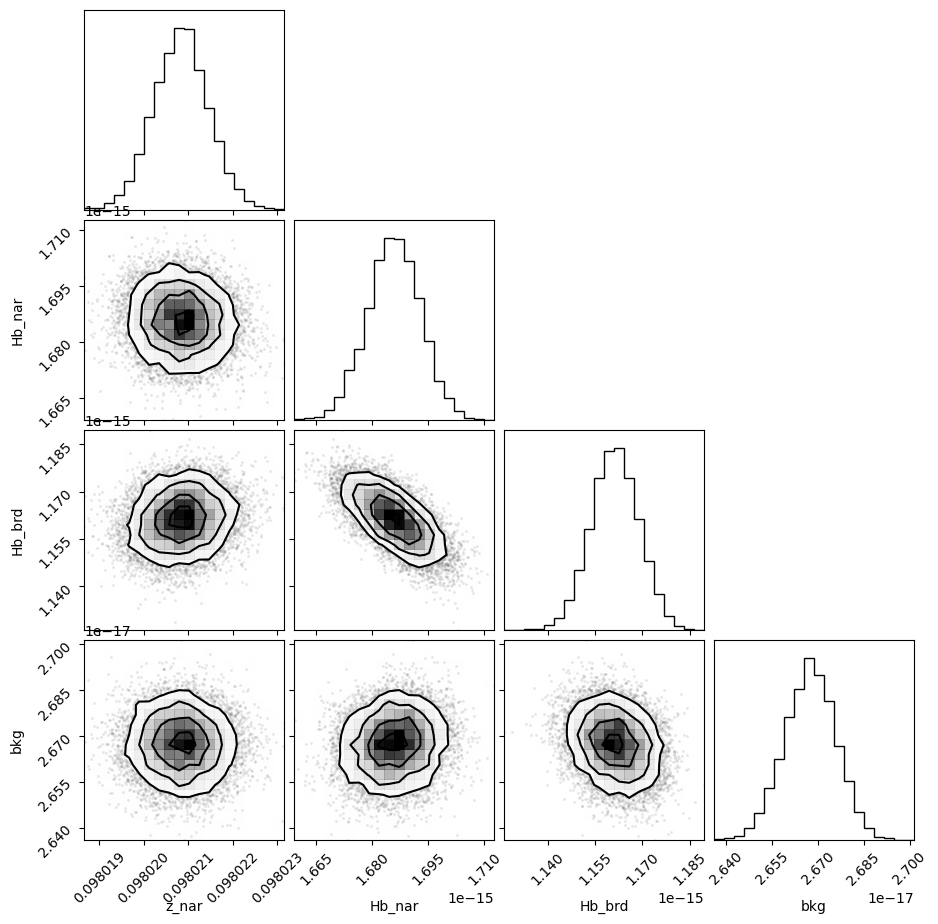

In [145]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

In [146]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09802084,6.1218e-07,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.96592730,,,0.9659272950822346,-inf,inf,False
sigma_brd,2.16391396,,,2.1639139636774547,-inf,inf,False
Hb_nar,1.6859e-15,7.0537e-18,(0.42%),1.6e-15,0.00000000,inf,True
Hb_brd,1.1612e-15,7.5439e-18,(0.65%),1e-15,0.00000000,inf,True
bkg,2.6676e-17,8.3987e-20,(0.31%),2.5e-17,0.00000000,inf,True


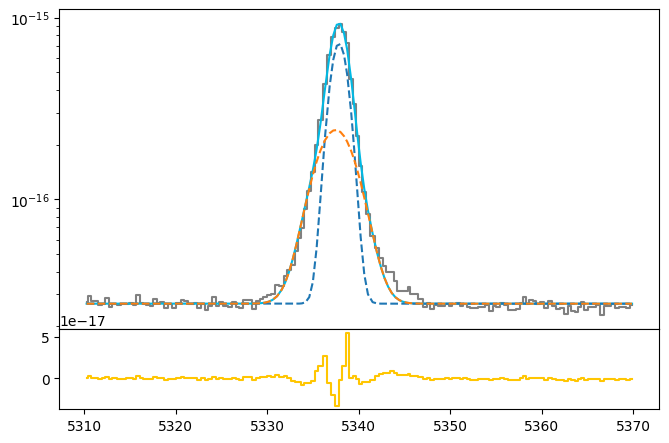

In [147]:
hb_nar_flux = out_hb.flatchain.Hb_nar.mean()
hb_nar_std = out_hb.flatchain.Hb_nar.std()

hb_brd_flux = out_hb.flatchain.Hb_brd.mean()
hb_brd_std = out_hb.flatchain.Hb_brd.std()

z_hb = out_hb.flatchain.z_nar.mean()
z_hb_std = out_hb.flatchain.z_nar.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb_nar = gaussian(hbeta.wavelength, hb_nar_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, hb_brd_flux, wave_cat['Hb'], z_hb * z_ratio, upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.plot(hbeta.wavelength, bkg_hb + hb_nar, ls='--')
ax.plot(hbeta.wavelength, bkg_hb + hb_brd, ls='--')
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [148]:
# EW
EW_Hb_nar = ufloat(hb_nar_flux, hb_nar_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb_brd = ufloat(hb_brd_flux, hb_brd_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb = (ufloat(hb_nar_flux, hb_nar_std) + ufloat(hb_brd_flux, hb_brd_std)) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

### Arc lines

In [149]:
wave_cat['Hg']*(1 + z_BN[igal]) 

4765.99017252

In [150]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hg = [wave_cat['Hg']*(1 + z_BN[igal]) - 10, wave_cat['Hg']*(1 + z_BN[igal]) + 10]
mask_arc_hg = (wcal_red[7].data['wave_soln'][0] >= wlims_hg[0]) & (wcal_red[7].data['wave_soln'][0] < wlims_hg[1])

# Arc spectra around the fitted line
x_arc_hg = wcal_red[7].data['wave_soln'][0][mask_arc_hg]
y_arc_hg = wcal_red[7].data['spec'][0][mask_arc_hg]

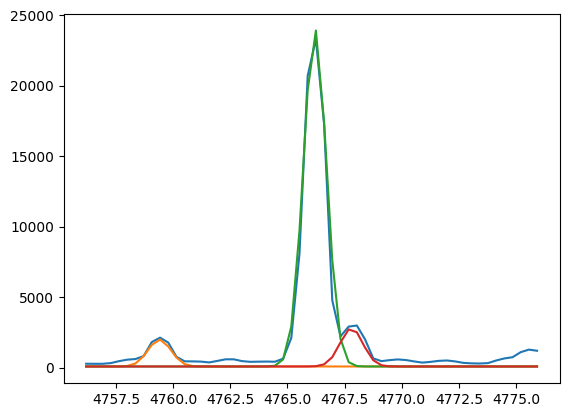

In [151]:
plt.plot(x_arc_hg, y_arc_hg)
plt.plot(x_arc_hg, 80 + gaussian(x_arc_hg,  2400, 4759.4, 0, 0.5))
plt.plot(x_arc_hg, 80 + gaussian(x_arc_hg, 30000, 4766.2, 0, 0.5))
plt.plot(x_arc_hg, 80 + gaussian(x_arc_hg,  3400, 4767.8, 0, 0.5))

In [152]:
params_arc_hg = Parameters()
params_arc_hg.add('z', value=0.0, vary=False)
params_arc_hg.add('mu1', value=4759.4, vary=False)
params_arc_hg.add('mu2', value=4766.2, vary=False)
params_arc_hg.add('mu3', value=4767.8, vary=False)
params_arc_hg.add('arc1', value= 2400, min=0.)
params_arc_hg.add('arc2', value=30000, min=0.)
params_arc_hg.add('arc3', value= 3400, min=0.)
params_arc_hg.add('sigma', value=0.5, min=0.)
params_arc_hg.add('bkg', value=80, vary=True)

def residual_arc_hg(params_arc_hg, x, data, uncertainty):
    
    z = params_arc_hg['z']
    mu1 = params_arc_hg['mu1']
    mu2 = params_arc_hg['mu2']
    mu3 = params_arc_hg['mu3']
    flux1 = params_arc_hg['arc1']
    flux2 = params_arc_hg['arc2']
    flux3 = params_arc_hg['arc3']
    sigma = params_arc_hg['sigma']
    bkg = params_arc_hg['bkg']
    
    x = x_arc_hg
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_hg) / 10

np.random.seed(950)
out_arc_hg = minimize(residual_arc_hg, params_arc_hg, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:56<00:00, 44.04it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [124.6378372   99.41598625 126.28073607  72.30862996 124.30669476]


In [153]:
out_arc_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4759.40000,,,4759.4,-inf,inf,False
mu2,4766.20000,,,4766.2,-inf,inf,False
mu3,4767.80000,,,4767.8,-inf,inf,False
arc1,1849.35604,7.70639222,(0.42%),2400,0.00000000,inf,True
arc2,26650.6753,9.17345403,(0.03%),30000,0.00000000,inf,True
arc3,2684.09124,7.85326801,(0.29%),3400,0.00000000,inf,True
sigma,0.43714261,1.6409e-04,(0.04%),0.5,0.00000000,inf,True
bkg,494.612094,1.53391962,(0.31%),80,-inf,inf,True


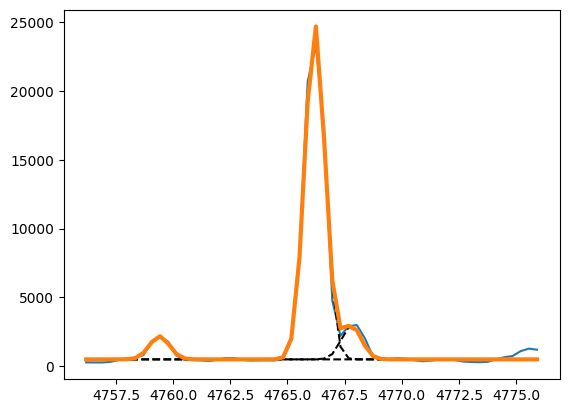

In [154]:
arc1_hg = out_arc_hg.flatchain.arc1.mean()
arc2_hg = out_arc_hg.flatchain.arc2.mean()
arc3_hg = out_arc_hg.flatchain.arc3.mean()
sigma_arc_hg = out_arc_hg.flatchain.sigma.mean()
bkg_arc_hg = out_arc_hg.flatchain.bkg.mean()

plt.plot(x_arc_hg, y_arc_hg)

plt.plot(x_arc_hg, bkg_arc_hg + gaussian(x_arc_hg, arc1_hg, 4759.4, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, bkg_arc_hg + gaussian(x_arc_hg, arc2_hg, 4766.2, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, bkg_arc_hg + gaussian(x_arc_hg, arc3_hg, 4767.8, 0, sigma_arc_hg), ls='--', color='black')

plt.plot(x_arc_hg, bkg_arc_hg + gaussian(x_arc_hg, arc1_hg, 4759.4, 0, sigma_arc_hg) \
                              + gaussian(x_arc_hg, arc2_hg, 4766.2, 0, sigma_arc_hg) \
                              + gaussian(x_arc_hg, arc3_hg, 4767.8, 0, sigma_arc_hg), lw=3
)

### Line fitting

In [155]:
sigma_nar_hg = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hg**2))
sigma_brd_hg = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hg**2))

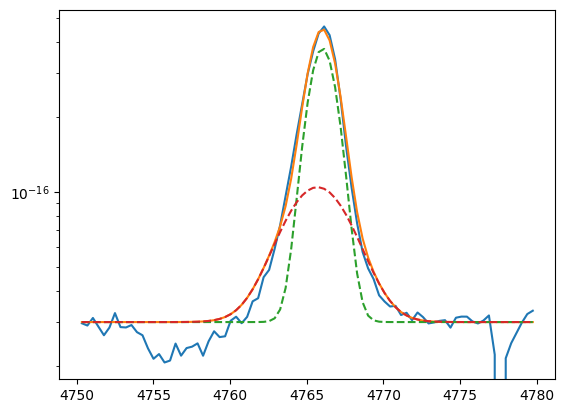

In [156]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 3e-17

hg_nar = gaussian(hgamma.wavelength, 8e-16, wave_cat['Hg'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, 4e-16, wave_cat['Hg'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

plt.plot(hgamma.wavelength, hg + bkg)
plt.plot(hgamma.wavelength, hg_nar + bkg, ls='--')
plt.plot(hgamma.wavelength, hg_brd + bkg, ls='--')
plt.yscale('log')

In [157]:
params_hg = Parameters()
params_hg.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hg.add('z_ratio', value=z_ratio, vary=False)
params_hg.add('sigma_nar', value=upy.nominal_values(sigma_nar_hg), vary=False)
params_hg.add('sigma_brd', value=upy.nominal_values(sigma_brd_hg), vary=False)
params_hg.add('Hg_nar', value=8.0e-16, min=0.)
params_hg.add('Hg_brd', value=4.0e-16, min=0.)
params_hg.add('bkg', value=3e-17, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_nar = params_hg['z_nar']
    z_brd = params_hg['z_nar'] * params_hg['z_ratio']
    sigma_nar = params_hg['sigma_nar']
    sigma_brd = params_hg['sigma_brd']
    hg_nar_flux = params_hg['Hg_nar']
    hg_brd_flux = params_hg['Hg_brd']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_nar_flux, wave_cat['Hg'], z_nar, sigma_nar) + \
            gaussian(x, hg_brd_flux, wave_cat['Hg'], z_brd, sigma_brd)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [158]:
np.random.seed(950)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:46<00:00, 53.63it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [40.27353701 65.59985406 46.35978311 83.07215407]


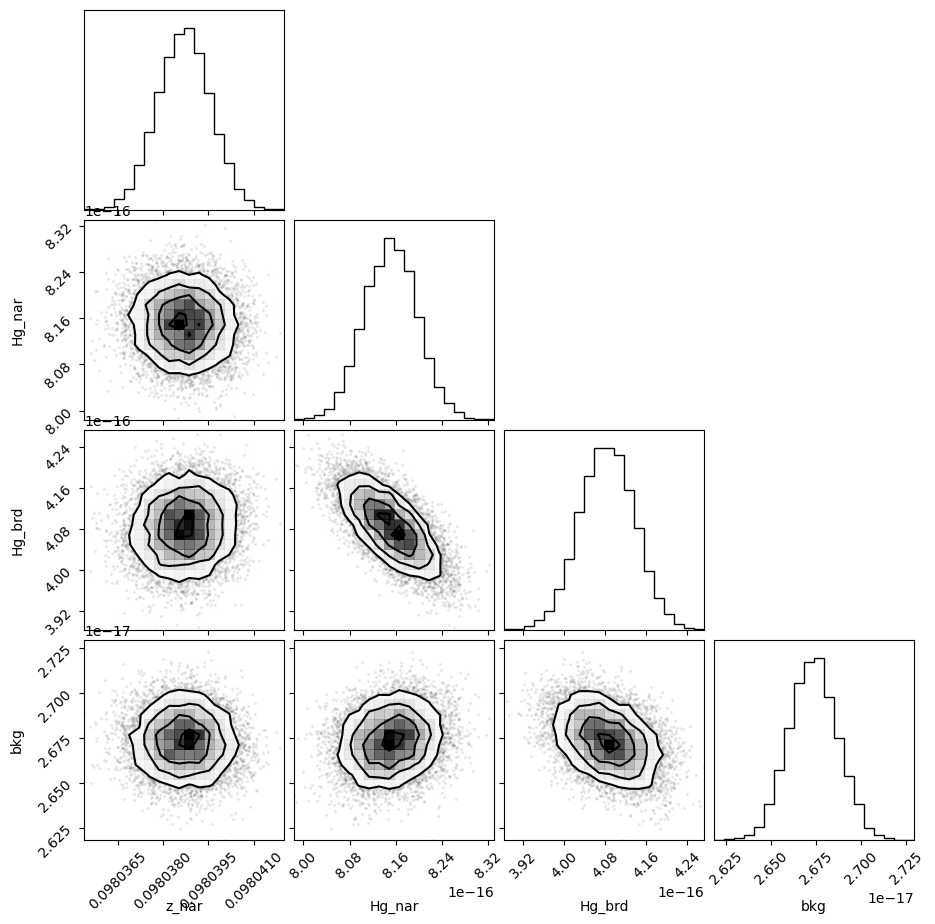

In [159]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

In [160]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09803871,8.8355e-07,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.91805169,,,0.9180516912364484,-inf,inf,False
sigma_brd,2.14297154,,,2.1429715375140876,-inf,inf,False
Hg_nar,8.1516e-16,4.5479e-18,(0.56%),8e-16,0.00000000,inf,True
Hg_brd,4.0842e-16,5.3565e-18,(1.31%),4e-16,0.00000000,inf,True
bkg,2.6733e-17,1.3480e-19,(0.50%),3e-17,0.00000000,inf,True


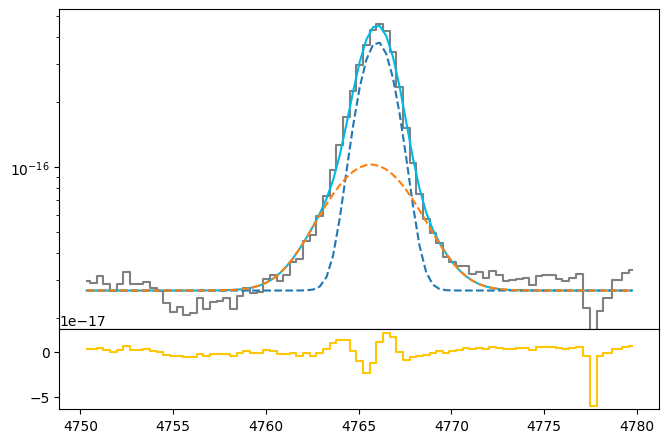

In [161]:
hg_nar_flux = out_hg.flatchain.Hg_nar.mean()
hg_nar_std = out_hg.flatchain.Hg_nar.std()

hg_brd_flux = out_hg.flatchain.Hg_brd.mean()
hg_brd_std = out_hg.flatchain.Hg_brd.std()

z_hg = out_hg.flatchain.z_nar.mean()
z_hg_std = out_hg.flatchain.z_nar.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg_nar = gaussian(hgamma.wavelength, hg_nar_flux, wave_cat['Hg'], z_hg,           upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, hg_brd_flux, wave_cat['Hg'], z_hg * z_ratio, upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.plot(hgamma.wavelength, bkg_hg + hg_nar, ls='--')
ax.plot(hgamma.wavelength, bkg_hg + hg_brd, ls='--')
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

#ls_hg = (wave_cat['Hg'] * (1 + z_hg)) + (3 * sigma_brd_oiii_4959)
#li_hg = (wave_cat['Hg'] * (1 + z_hg)) - (3 * sigma_brd_oiii_4959)

#ax.axvline(ls_hg, ls='--', color='black', lw=0.8)
#ax.axvline(li_hg, ls='--', color='black', lw=0.8)

In [162]:
# EW
EW_Hg_nar = ufloat(hg_nar_flux, hg_nar_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg_brd = ufloat(hg_brd_flux, hg_brd_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg = (ufloat(hg_nar_flux, hg_nar_std) + ufloat(hg_brd_flux, hg_brd_std)) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

### Arc lines

In [163]:
wave_cat['Hg']*(1 + z_BN[igal]) 

4765.99017252

In [164]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hd = [wave_cat['Hd']*(1 + z_BN[igal]) - 13, wave_cat['Hd']*(1 + z_BN[igal]) + 10]
mask_arc_hd = (wcal_red[7].data['wave_soln'][0] >= wlims_hd[0]) & (wcal_red[7].data['wave_soln'][0] < wlims_hd[1])

# Arc spectra around the fitted line
x_arc_hd = wcal_red[7].data['wave_soln'][0][mask_arc_hd]
y_arc_hd = wcal_red[7].data['spec'][0][mask_arc_hd]

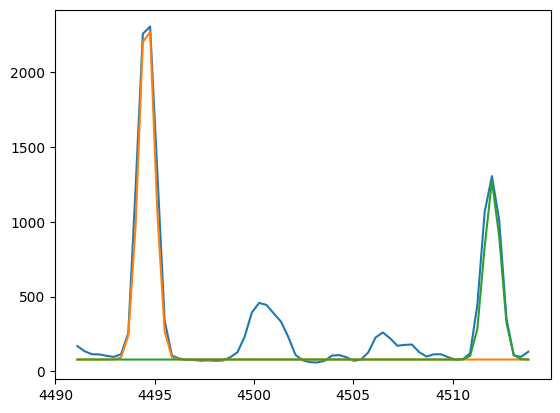

In [165]:
plt.plot(x_arc_hd, y_arc_hd)
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd,  2400, 4494.6, 0, 0.4))
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd,  1200,   4512, 0, 0.4))

In [166]:
params_arc_hd = Parameters()
params_arc_hd.add('z', value=0.0, vary=False)
params_arc_hd.add('mu1', value=4494.6, vary=False)
params_arc_hd.add('mu2', value=  4512, vary=False)
params_arc_hd.add('arc1', value=2400, min=0.)
params_arc_hd.add('arc2', value=1200, min=0.)
params_arc_hd.add('sigma', value=0.4, min=0.)
params_arc_hd.add('bkg', value=80, vary=False)

def residual_arc_hd(params_arc_hd, x, data, uncertainty):
    
    z = params_arc_hd['z']
    mu1 = params_arc_hd['mu1']
    mu2 = params_arc_hd['mu2']
    flux1 = params_arc_hd['arc1']
    flux2 = params_arc_hd['arc2']
    sigma = params_arc_hd['sigma']
    bkg = params_arc_hd['bkg']
    
    x = x_arc_hd
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_hd) / 10

np.random.seed(950)
out_arc_hd = minimize(residual_arc_hd, params_arc_hd, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:40<00:00, 62.05it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [69.93521507 79.79615921 72.41927746]


In [167]:
out_arc_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4494.60000,,,4494.6,-inf,inf,False
mu2,4512.00000,,,4512,-inf,inf,False
arc1,2705.92883,8.93436185,(0.33%),2400,0.00000000,inf,True
arc2,1430.29938,7.86528333,(0.55%),1200,0.00000000,inf,True
sigma,0.44685508,0.00157457,(0.35%),0.4,0.00000000,inf,True
bkg,80.0000000,,,80,-inf,inf,False


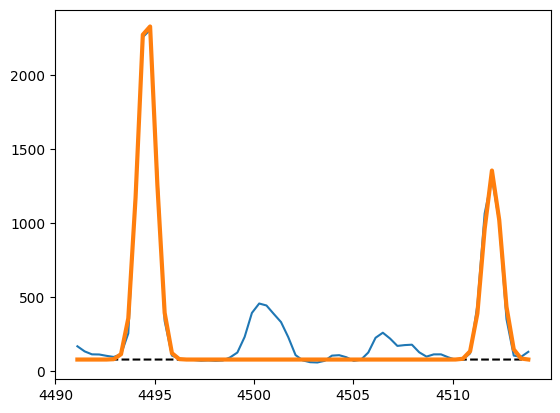

In [168]:
arc1_hd = out_arc_hd.flatchain.arc1.mean()
arc2_hd = out_arc_hd.flatchain.arc2.mean()
sigma_arc_hd = out_arc_hd.flatchain.sigma.mean()

plt.plot(x_arc_hd, y_arc_hd)

plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc1_hd, 4494.6, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc2_hd,   4512, 0, sigma_arc_hd), ls='--', color='black')

plt.plot(x_arc_hd, 80 + gaussian(x_arc_hd, arc1_hd, 4494.6, 0, sigma_arc_hd) \
                      + gaussian(x_arc_hd, arc2_hd,   4512, 0, sigma_arc_hd), lw=3
)

### Line fitting

In [169]:
sigma_nar_hd = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hd**2))
sigma_brd_hd = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hd**2))

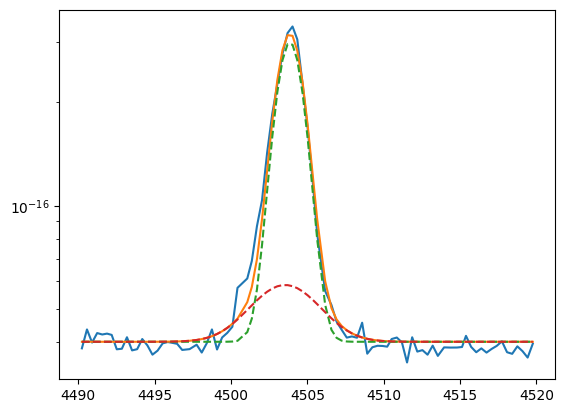

In [170]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 4e-17

hd_nar = gaussian(hdelta.wavelength, 6e-16, wave_cat['Hd'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, 1e-16, wave_cat['Hd'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

plt.plot(hdelta.wavelength, hd + bkg)
plt.plot(hdelta.wavelength, hd_nar + bkg, ls='--')
plt.plot(hdelta.wavelength, hd_brd + bkg, ls='--')
plt.yscale('log')

In [171]:
params_hd = Parameters()
params_hd.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hd.add('z_ratio', value=z_ratio, vary=False)
params_hd.add('sigma_nar', value=upy.nominal_values(sigma_nar_hd), vary=False)
params_hd.add('sigma_brd', value=upy.nominal_values(sigma_brd_hd), vary=False)
params_hd.add('Hd_nar', value=6.0e-16, min=0.)
params_hd.add('Hd_brd', value=1.0e-16, min=0.)
params_hd.add('bkg', value=4e-17, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_nar = params_hd['z_nar']
    z_brd = params_hd['z_nar'] * params_hd['z_ratio']
    sigma_nar = params_hd['sigma_nar']
    sigma_brd = params_hd['sigma_brd']
    hd_nar_flux = params_hd['Hd_nar']
    hd_brd_flux = params_hd['Hd_brd']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_nar_flux, wave_cat['Hd'], z_nar, sigma_nar) + \
            gaussian(x, hd_brd_flux, wave_cat['Hd'], z_brd, sigma_brd)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [172]:
np.random.seed(950)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:39<00:00, 63.25it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [39.90945059 66.9078876  91.84309297 80.9236587 ]


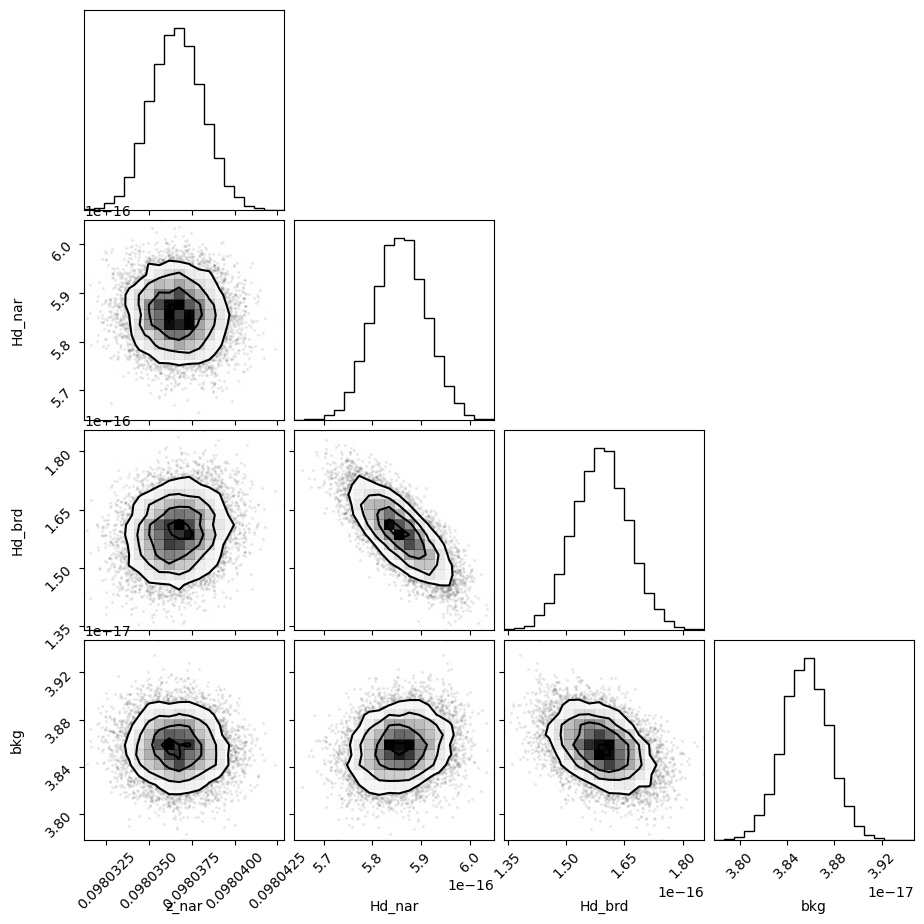

In [173]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

In [174]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09803662,1.5199e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.92271808,,,0.9227180800613862,-inf,inf,False
sigma_brd,2.14497477,,,2.144974768636116,-inf,inf,False
Hd_nar,5.8561e-16,5.3760e-18,(0.92%),6e-16,0.00000000,inf,True
Hd_brd,1.5908e-16,6.9833e-18,(4.39%),1e-16,0.00000000,inf,True
bkg,3.8563e-17,1.9434e-19,(0.50%),4e-17,0.00000000,inf,True


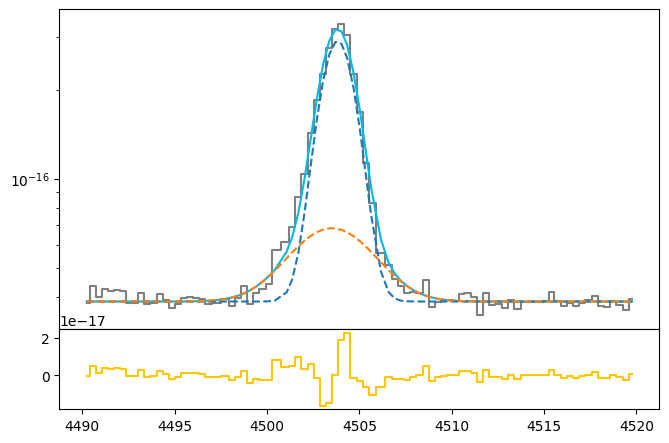

In [175]:
hd_nar_flux = out_hd.flatchain.Hd_nar.mean()
hd_nar_std = out_hd.flatchain.Hd_nar.std()

hd_brd_flux = out_hd.flatchain.Hd_brd.mean()
hd_brd_std = out_hd.flatchain.Hd_brd.std()

z_hd = out_hd.flatchain.z_nar.mean()
z_hd_std = out_hd.flatchain.z_nar.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd_nar = gaussian(hdelta.wavelength, hd_nar_flux, wave_cat['Hd'], z_hd,           upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, hd_brd_flux, wave_cat['Hd'], z_hd * z_ratio, upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.plot(hdelta.wavelength, bkg_hd + hd_nar, ls='--')
ax.plot(hdelta.wavelength, bkg_hd + hd_brd, ls='--')
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

#ls_hd = (wave_cat['Hd'] * (1 + z_hd)) + (3 * sigma_brd_oiii_4959)
#li_hd = (wave_cat['Hd'] * (1 + z_hd)) - (3 * sigma_brd_oiii_4959)

#ax.axvline(ls_hd, ls='--', color='black', lw=0.8)
#ax.axvline(li_hd, ls='--', color='black', lw=0.8)

In [176]:
# EW
EW_Hd_nar = ufloat(hd_nar_flux, hd_nar_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd_brd = ufloat(hd_brd_flux, hd_brd_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd = (ufloat(hd_nar_flux, hd_nar_std) + ufloat(hd_brd_flux, hd_brd_std)) / ufloat(bkg_hd, bkg_hd_std)

# HeII 4686

### Arc lines

In [177]:
wave_cat['HeII4685']*(1 + z_BN[igal])

5145.073579850001

In [178]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4685 = [wave_cat['HeII4685']*(1 + z_BN[igal]) - 10, wave_cat['HeII4685']*(1 + z_BN[igal]) - 5]
mask_arc_4685 = (wcal_red[9].data['wave_soln'][0] >= wlims_4685[0]) & (wcal_red[9].data['wave_soln'][0] < wlims_4685[1])

# Arc spectra around the fitted line
x_arc_4685 = wcal_red[9].data['wave_soln'][0][mask_arc_4685]
y_arc_4685 = wcal_red[9].data['spec'][0][mask_arc_4685]

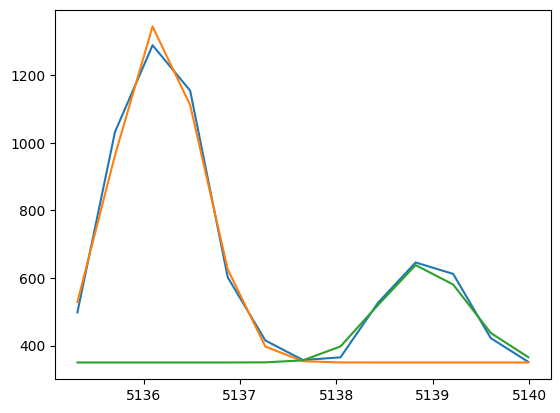

In [179]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 350 + gaussian(x_arc_4685, 1130, 5136.15, 0, 0.45))
plt.plot(x_arc_4685, 350 + gaussian(x_arc_4685, 330, 5138.9, 0, 0.45))

In [180]:
params_arc_4685 = Parameters()
params_arc_4685.add('z', value=0.0, vary=False)
params_arc_4685.add('mu1', value=5136.15, vary=False)
params_arc_4685.add('mu2', value= 5138.9, vary=False)
params_arc_4685.add('arc1', value=1130, min=0.)
params_arc_4685.add('arc2', value= 330, min=0.)
params_arc_4685.add('sigma', value=0.45, min=0.)
params_arc_4685.add('bkg', value=350, vary=False)

def residual_arc_4685(params_arc_4685, x, data, uncertainty):
    
    z = params_arc_4685['z']
    mu1 = params_arc_4685['mu1']
    mu2 = params_arc_4685['mu2']
    flux1 = params_arc_4685['arc1']
    flux2 = params_arc_4685['arc2']
    sigma = params_arc_4685['sigma']
    bkg = params_arc_4685['bkg']
    
    x = x_arc_4685
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_4685) / 10

np.random.seed(950)
out_arc_4685 = minimize(residual_arc_4685, params_arc_4685, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:31<00:00, 80.26it/s]


In [181]:
out_arc_4685.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,5136.15000,,,5136.15,-inf,inf,False
mu2,5138.90000,,,5138.9,-inf,inf,False
arc1,1141.56039,9.52993800,(0.83%),1130,0.00000000,inf,True
arc2,345.830819,8.05894442,(2.33%),330,0.00000000,inf,True
sigma,0.45530620,0.00424161,(0.93%),0.45,0.00000000,inf,True
bkg,350.000000,,,350,-inf,inf,False


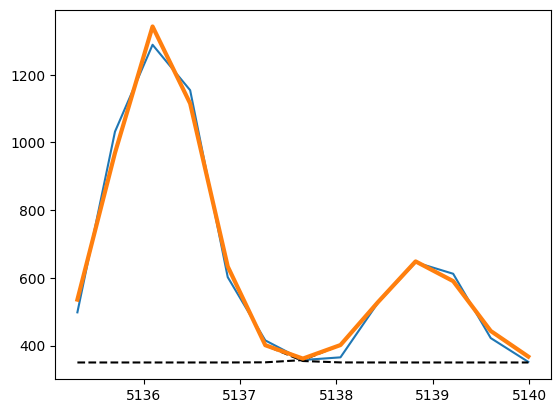

In [182]:
arc1_4685 = out_arc_4685.flatchain.arc1.mean()
arc2_4685 = out_arc_4685.flatchain.arc2.mean()
sigma_arc_4685 = out_arc_4685.flatchain.sigma.mean()

plt.plot(x_arc_4685, y_arc_4685)

plt.plot(x_arc_4685, 350 + gaussian(x_arc_4685, arc1_4685, 5136.15, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 350 + gaussian(x_arc_4685, arc2_4685,  5138.9, 0, sigma_arc_4685), ls='--', color='black')

plt.plot(x_arc_4685, 350 + gaussian(x_arc_4685, arc1_4685, 5136.15, 0, sigma_arc_4685) \
                         + gaussian(x_arc_4685, arc2_4685,  5138.9, 0, sigma_arc_4685), lw=3
)

### Line fitting

In [183]:
sigma_nar_4685 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4685**2))
sigma_brd_4685 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4685**2))

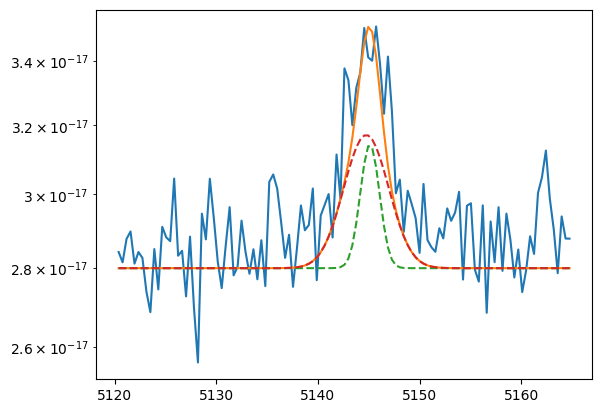

In [184]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 2.8e-17

heii4685_nar = gaussian(heii_4686.wavelength, 0.8e-17, wave_cat['HeII4685'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, 2e-17, wave_cat['HeII4685'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

plt.plot(heii_4686.wavelength, heii4685 + bkg)
plt.plot(heii_4686.wavelength, heii4685_nar + bkg, ls='--')
plt.plot(heii_4686.wavelength, heii4685_brd + bkg, ls='--')
plt.yscale('log')

In [185]:
params_4685 = Parameters()
params_4685.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4685.add('z_ratio', value=z_ratio, vary=False)
params_4685.add('sigma_heii4685_nar', value=upy.nominal_values(sigma_nar_4685), vary=False)
params_4685.add('sigma_heii4685_brd', value=upy.nominal_values(sigma_brd_4685), vary=False)
params_4685.add('Heii4685_nar', value=0.7e-17, min=0.)
params_4685.add('Heii4685_brd', value=2e-17, min=0.)
params_4685.add('bkg', value=2.8e-17, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_nar = params_4685['z_nar']
    z_brd = params_4685['z_nar'] * params_4685['z_ratio']
    sigma_heii4685_nar = params_4685['sigma_heii4685_nar']
    sigma_heii4685_brd = params_4685['sigma_heii4685_brd']
    heii4685_nar_flux = params_4685['Heii4685_nar']
    heii4685_brd_flux = params_4685['Heii4685_brd']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_nar_flux, wave_cat['HeII4685'], z_nar, sigma_heii4685_nar) + \
            gaussian(x, heii4685_brd_flux, wave_cat['HeII4685'], z_brd, sigma_heii4685_brd)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [186]:
np.random.seed(950)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:27<00:00, 89.50it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [42.04699118 64.58713419 61.63257651 38.48576633]


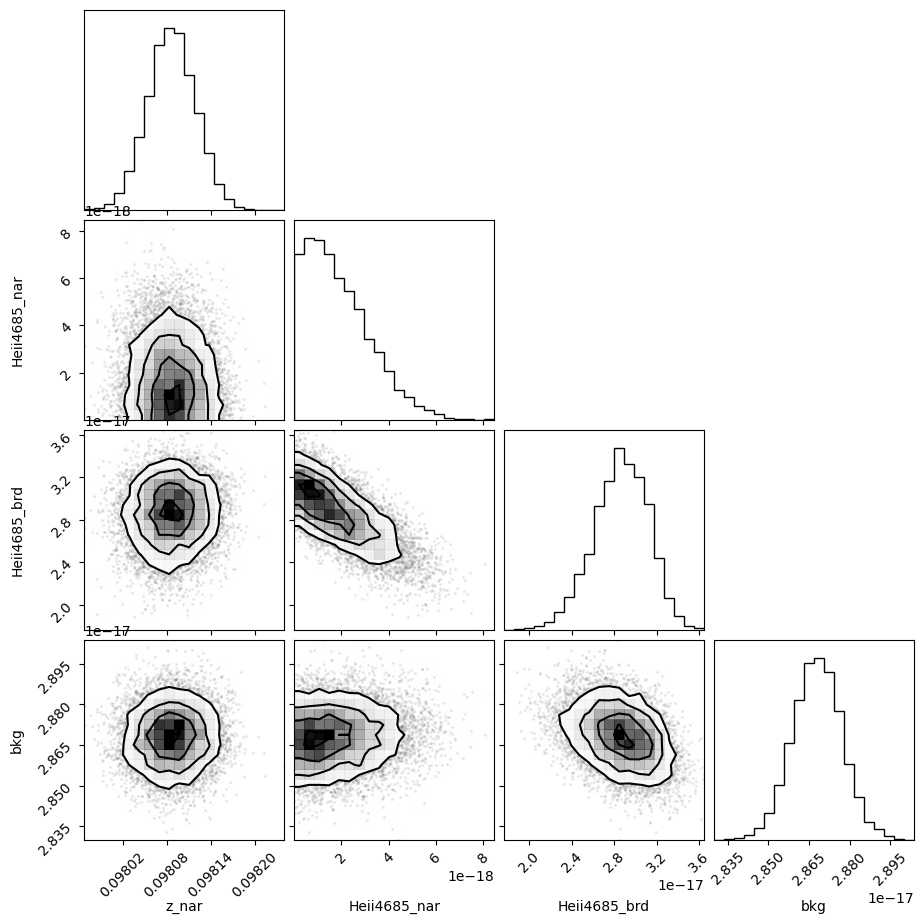

In [187]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

In [188]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09808652,3.2873e-05,(0.03%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_heii4685_nar,0.92685823,,,0.9268582303920481,-inf,inf,False
sigma_heii4685_brd,2.14675902,,,2.1467590181617657,-inf,inf,False
Heii4685_nar,1.6545e-18,1.3859e-18,(83.76%),7e-18,0.00000000,inf,True
Heii4685_brd,2.8736e-17,2.5427e-18,(8.85%),2e-17,0.00000000,inf,True
bkg,2.8682e-17,8.9929e-20,(0.31%),2.8e-17,0.00000000,inf,True


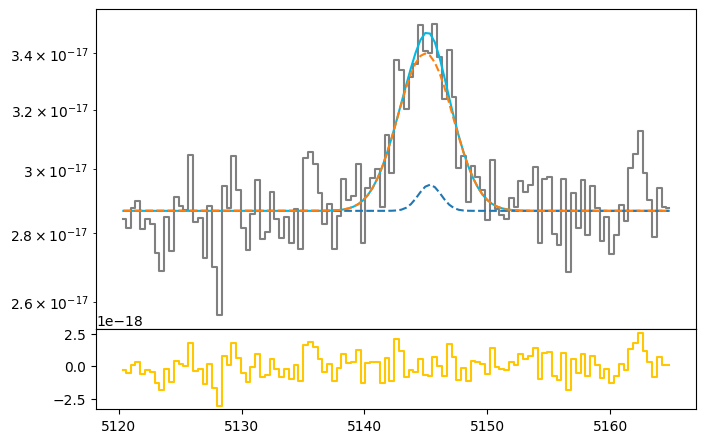

In [189]:
heii4685_nar_flux = out_heii4685.flatchain.Heii4685_nar.mean()
heii4685_nar_std = out_heii4685.flatchain.Heii4685_nar.std()

heii4685_brd_flux = out_heii4685.flatchain.Heii4685_brd.mean()
heii4685_brd_std = out_heii4685.flatchain.Heii4685_brd.std()

z_heii4685 = out_heii4685.flatchain.z_nar.mean()
z_heii4685_std = out_heii4685.flatchain.z_nar.std()

bkg_heii4685 = out_heii4685.flatchain.bkg.mean()
bkg_heii4685_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color=c[0])
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')

In [190]:
# EW
EW_heii4685_nar = ufloat(heii4685_nar_flux, heii4685_nar_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685_brd = ufloat(heii4685_brd_flux, heii4685_brd_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685 = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std)) / ufloat(bkg_heii4685, bkg_heii4685_std)

In [191]:
heii4685_tot_flux = ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std)

Text(5123, 3.1e-17, 'S/N flux = 10.53')

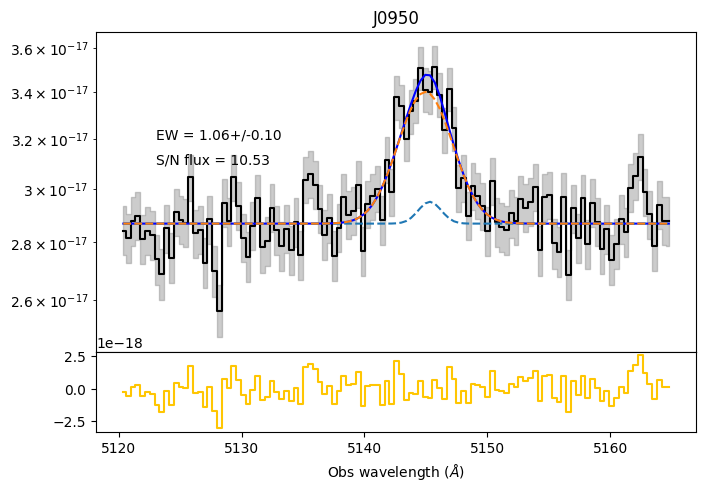

In [192]:
fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='black', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color='blue')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')
ax.fill_between(heii_4686.wavelength, heii_4686.flux - heii_4686.noise,
                                      heii_4686.flux + heii_4686.noise,
                                      color='gray', alpha=0.4, step='mid')
ax.set_title('J0950')
ax1.set_xlabel('Obs wavelength ($\AA$)')
ax.text(5123, 3.2e-17, 'EW = '+str(EW_heii4685))
ax.text(5123, 3.1e-17, s='S/N flux = '+str(round(heii4685_tot_flux.nominal_value/heii4685_tot_flux.std_dev, 2)))
#fig.savefig('/home/benjamin/Documents/analogs/HeIIJ0950.pdf', bbox_inches='tight')

# [OII]3726 + [OII]3729

In [193]:
wave_cat['[OII]3729']*(1 + z_BN[igal])

4094.3693785250002

### Arc lines

In [194]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3729 = [wave_cat['[OII]3729']*(1 + z_BN[igal]) - 10, wave_cat['[OII]3729']*(1 + z_BN[igal])]
mask_arc_3729 = (wcal_red[3].data['wave_soln'][0] >= wlims_3729[0]) & (wcal_red[3].data['wave_soln'][0] < wlims_3729[1])

# Arc spectra around the fitted line
x_arc_3729 = wcal_red[3].data['wave_soln'][0][mask_arc_3729]
y_arc_3729 = wcal_red[3].data['spec'][0][mask_arc_3729]

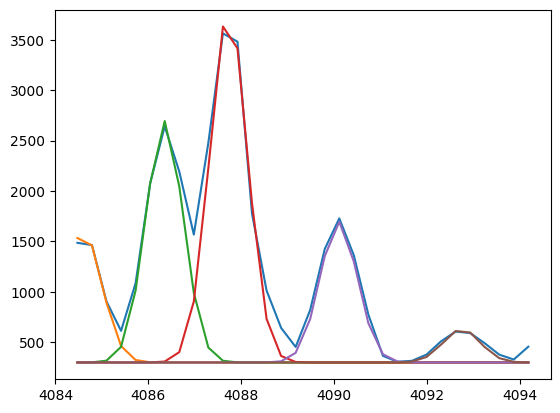

In [195]:
plt.plot(x_arc_3729, y_arc_3729)
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, 1300, 4084.6, 0, 0.4))
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, 2400, 4086.35, 0, 0.4))
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, 3500, 4087.73, 0, 0.4))
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, 1400, 4090.1, 0, 0.4))
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, 330, 4092.75, 0, 0.4))

In [196]:
params_arc_3729 = Parameters()
params_arc_3729.add('z', value=0.0, vary=False)
params_arc_3729.add('mu1', value=4084.6, vary=False)
params_arc_3729.add('mu2', value=4086.35, vary=False)
params_arc_3729.add('mu3', value=4087.73, vary=False)
params_arc_3729.add('mu4', value=4090.1, vary=False)
params_arc_3729.add('mu5', value=4092.75, vary=False)
params_arc_3729.add('arc1', value=1300, min=0.)
params_arc_3729.add('arc2', value=2400, min=0.)
params_arc_3729.add('arc3', value=3500, min=0.)
params_arc_3729.add('arc4', value=1400, min=0.)
params_arc_3729.add('arc5', value=330, min=0.)
params_arc_3729.add('sigma', value=0.4, min=0.)
params_arc_3729.add('bkg', value=300, vary=False)

def residual_arc_3729(params_arc_3729, x, data, uncertainty):
    
    z = params_arc_3729['z']
    mu1 = params_arc_3729['mu1']
    mu2 = params_arc_3729['mu2']
    mu3 = params_arc_3729['mu3']
    mu4 = params_arc_3729['mu4']
    mu5 = params_arc_3729['mu5']
    flux1 = params_arc_3729['arc1']
    flux2 = params_arc_3729['arc2']
    flux3 = params_arc_3729['arc3']
    flux4 = params_arc_3729['arc4']
    flux5 = params_arc_3729['arc5']
    sigma = params_arc_3729['sigma']
    bkg = params_arc_3729['bkg']
    
    x = x_arc_3729
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_3729) / 10

np.random.seed(950)
out_arc_3729 = minimize(residual_arc_3729, params_arc_3729, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:38<00:00, 64.31it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [59.85180549 52.78537535 77.00606737 89.54607444 91.75118483 68.46219605]


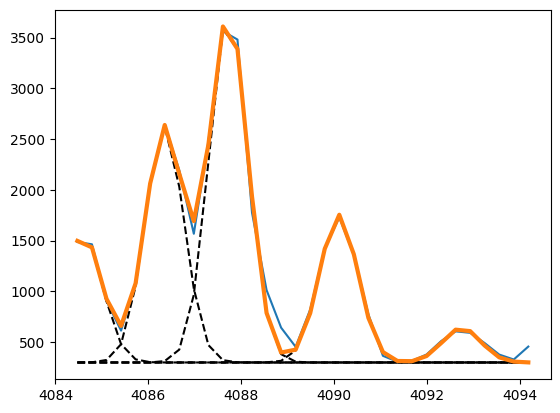

In [197]:
arc1_3729 = out_arc_3729.flatchain.arc1.mean()
arc2_3729 = out_arc_3729.flatchain.arc2.mean()
arc3_3729 = out_arc_3729.flatchain.arc3.mean()
arc4_3729 = out_arc_3729.flatchain.arc4.mean()
arc5_3729 = out_arc_3729.flatchain.arc5.mean()
sigma_arc_3729 = out_arc_3729.flatchain.sigma.mean()

plt.plot(x_arc_3729, y_arc_3729)

plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc1_3729, 4084.6, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc2_3729, 4086.35, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc3_3729, 4087.73, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc4_3729, 4090.1, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc5_3729, 4092.75, 0, sigma_arc_3729), ls='--', color='black')

plt.plot(x_arc_3729, 300 + gaussian(x_arc_3729, arc1_3729, 4084.6, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc2_3729, 4086.35, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc3_3729, 4087.73, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc4_3729, 4090.1, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc5_3729, 4092.75, 0, sigma_arc_3729), lw=3
)

### Line fitting

In [198]:
sigma_nar_3729 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3729**2))
sigma_brd_3729 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3729**2))

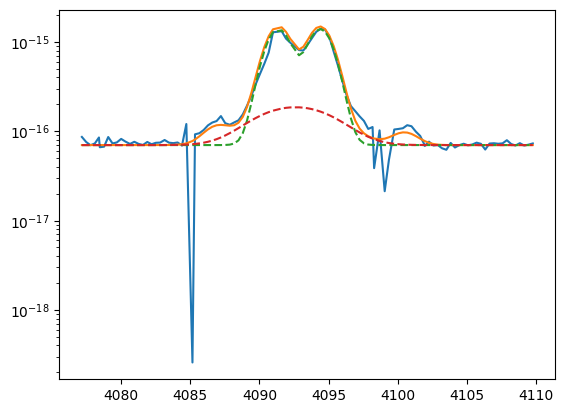

In [199]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 0.6e-16, wave_cat['H13'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, 0.3e-14, wave_cat['[OII]3729'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, 0.4e-15, wave_cat['[OII]3729'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, 0.3e-14, wave_cat['[OII]3726'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, 0.4e-15, wave_cat['[OII]3726'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, 0.8e-16, wave_cat['H14'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

bkg = 7e-17

plt.plot(oii_3727.wavelength, bkg + oiid + oiic + h13 + h14)
plt.plot(oii_3727.wavelength, bkg + oiid_nar + oiic_nar, ls='--')
plt.plot(oii_3727.wavelength, bkg + oiid_brd + oiic_brd, ls='--')

plt.yscale('log')

In [200]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_3727.add('z_ratio', value=z_ratio, vary=False)
params_oii_3727.add('sigma_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('H13', value=0.6e-16, min=0.)
params_oii_3727.add('Oiic_nar', value=0.3e-14, min=0.)
params_oii_3727.add('Oiic_brd', value=0.4e-15, min=0.)
params_oii_3727.add('Oiid_nar', value=0.3e-14, min=0.)
params_oii_3727.add('Oiid_brd', value=0.4e-15, min=0.)
params_oii_3727.add('H14', value=0.8e-16, min=0.)
params_oii_3727.add('bkg', value=7e-17, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_nar = params_oii_3727['z_nar']
    z_brd = params_oii_3727['z_nar'] * params_oii_3727['z_ratio']
    sigma_nar = params_oii_3727['sigma_nar']
    sigma_brd = params_oii_3727['sigma_brd']
    
    h13_flux = params_oii_3727['H13']
    oiic_nar_flux = params_oii_3727['Oiic_nar']
    oiic_brd_flux = params_oii_3727['Oiic_brd']
    oiid_nar_flux = params_oii_3727['Oiid_nar']
    oiid_brd_flux = params_oii_3727['Oiid_brd']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_nar, sigma_nar)
    model_oiic = gaussian(x, oiic_nar_flux, wave_cat['[OII]3729'], z_nar, sigma_nar) + \
                 gaussian(x, oiic_brd_flux, wave_cat['[OII]3729'], z_brd, sigma_brd)
    model_oiid = gaussian(x, oiid_nar_flux, wave_cat['[OII]3726'], z_nar, sigma_nar) + \
                 gaussian(x, oiid_brd_flux, wave_cat['[OII]3726'], z_brd, sigma_brd)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_nar, sigma_nar)
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [201]:
np.random.seed(950)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:41<00:00, 60.07it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 61.84173551 171.67538124 125.34733773 158.11894742 105.77996606
 102.83093435 129.77560278  34.72391431]


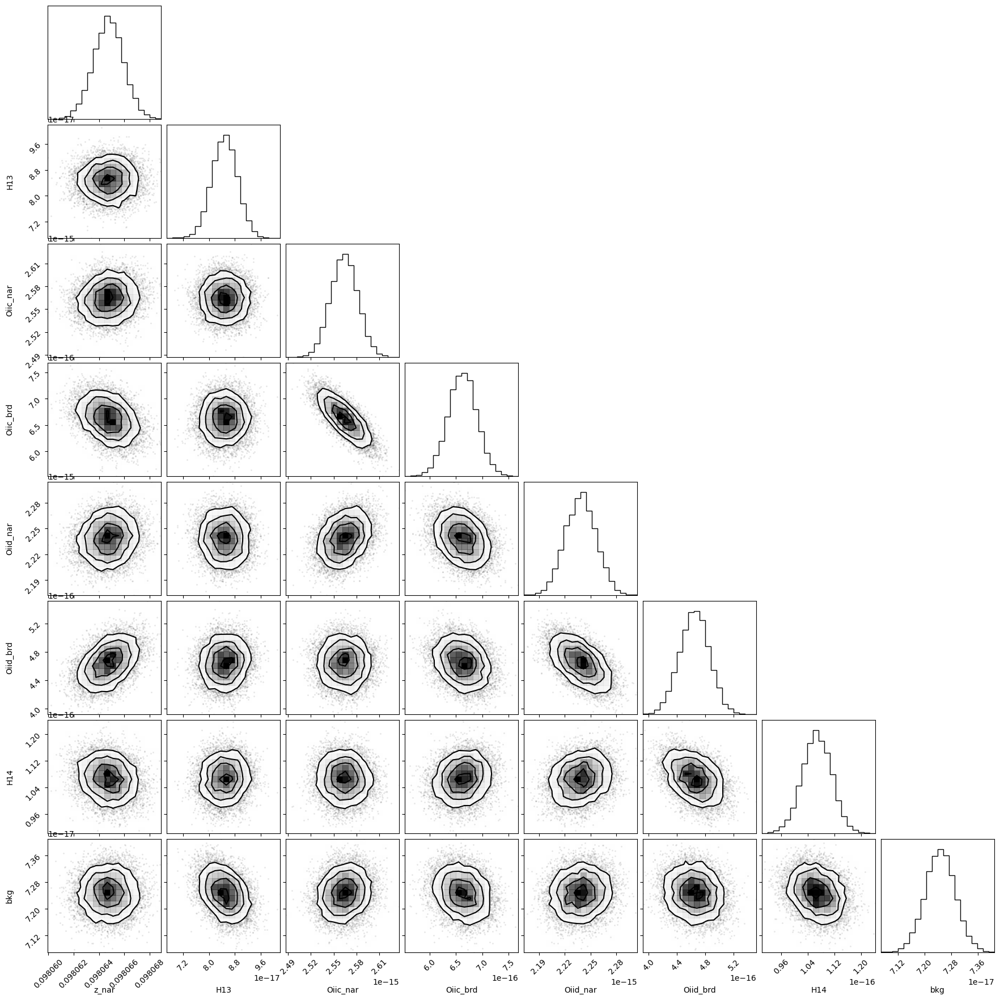

In [202]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);

In [203]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09806476,1.1921e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.90705654,,,0.9070565368910422,-inf,inf,False
sigma_brd,2.13828428,,,2.138284280429092,-inf,inf,False
H13,8.4808e-17,3.8772e-18,(4.57%),6e-17,0.00000000,inf,True
Oiic_nar,2.5638e-15,1.7866e-17,(0.70%),3e-15,0.00000000,inf,True
Oiic_brd,6.6245e-16,2.6804e-17,(4.05%),4e-16,0.00000000,inf,True
Oiid_nar,2.2386e-15,1.7983e-17,(0.80%),3e-15,0.00000000,inf,True
Oiid_brd,4.6466e-16,2.0889e-17,(4.50%),4e-16,0.00000000,inf,True
H14,1.0672e-16,4.3584e-18,(4.08%),8e-17,0.00000000,inf,True


(4e-17, 2e-15)

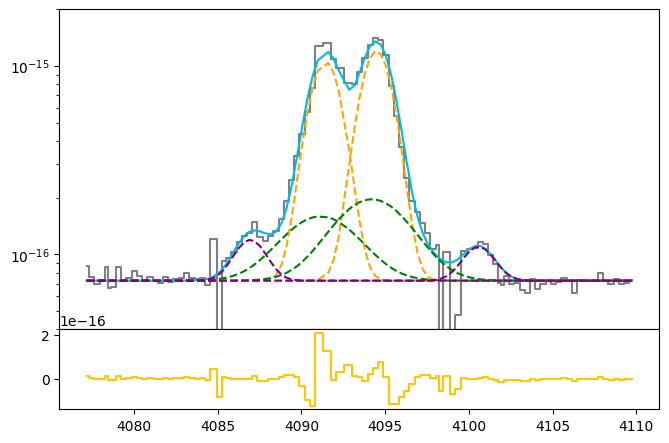

In [204]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_nar_flux = out_oii_3727.flatchain.Oiic_nar.mean()
oiic_nar_std = out_oii_3727.flatchain.Oiic_nar.std()

oiic_brd_flux = out_oii_3727.flatchain.Oiic_brd.mean()
oiic_brd_std = out_oii_3727.flatchain.Oiic_brd.std()

oiid_nar_flux = out_oii_3727.flatchain.Oiid_nar.mean()
oiid_nar_std = out_oii_3727.flatchain.Oiid_nar.std()

oiid_brd_flux = out_oii_3727.flatchain.Oiid_brd.mean()
oiid_brd_std = out_oii_3727.flatchain.Oiid_brd.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_nar.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_nar.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13, ls='--', color='purple')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h14, ls='--', color='purple')

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14, color=c[3], where='mid')
ax.set_ylim(4e-17, 2e-15)

In [205]:
# EW
EW_OII_3729_nar = ufloat(oiic_nar_flux, oiic_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729_brd = ufloat(oiic_brd_flux, oiic_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729 = (ufloat(oiic_nar_flux, oiic_nar_std) + ufloat(oiic_brd_flux, oiic_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

EW_OII_3726_nar = ufloat(oiid_nar_flux, oiid_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726_brd = ufloat(oiid_brd_flux, oiid_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = (ufloat(oiid_nar_flux, oiid_nar_std) + ufloat(oiid_brd_flux, oiid_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

# [SIII]9532

### Arc lines

In [206]:
wave_cat['[SIII]9532']*(1 + z_BN[igal])

10465.481388500002

In [207]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9532 = [wave_cat['[SIII]9532']*(1 + z_BN[igal]), wave_cat['[SIII]9532']*(1 + z_BN[igal]) + 20]
mask_arc_9532 = (wcal_red[21].data['wave_soln'][0] >= wlims_9532[0]) & (wcal_red[21].data['wave_soln'][0] < wlims_9532[1])

# Arc spectra around the fitted line
x_arc_9532 = wcal_red[21].data['wave_soln'][0][mask_arc_9532]
y_arc_9532 = wcal_red[21].data['spec'][0][mask_arc_9532]

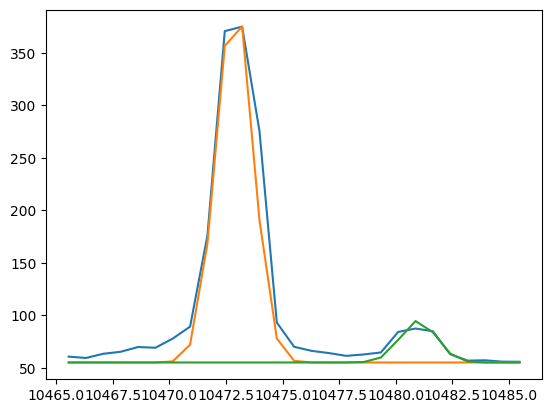

In [208]:
plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, 700, 10472.88, 0, 0.8))
plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, 80, 10481, 0, 0.8))

In [209]:
params_arc_9532 = Parameters()
params_arc_9532.add('z', value=0.0, vary=False)
params_arc_9532.add('mu1', value=10472.88, vary=False)
params_arc_9532.add('mu2', value=10481, vary=False)
params_arc_9532.add('arc1', value=700, min=0.)
params_arc_9532.add('arc2', value=80, min=0.)
params_arc_9532.add('sigma', value=0.8, min=0.)
params_arc_9532.add('bkg', value=55, vary=False)

def residual_arc_9532(params_arc_9532, x, data, uncertainty):
    
    z = params_arc_9532['z']
    mu1 = params_arc_9532['mu1']
    mu2 = params_arc_9532['mu2']
    flux1 = params_arc_9532['arc1']
    flux2 = params_arc_9532['arc2']
    sigma = params_arc_9532['sigma']
    bkg = params_arc_9532['bkg']
    
    x = x_arc_9532
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_9532) / 10

np.random.seed(950)
out_arc_9532 = minimize(residual_arc_9532, params_arc_9532, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 128.12it/s]


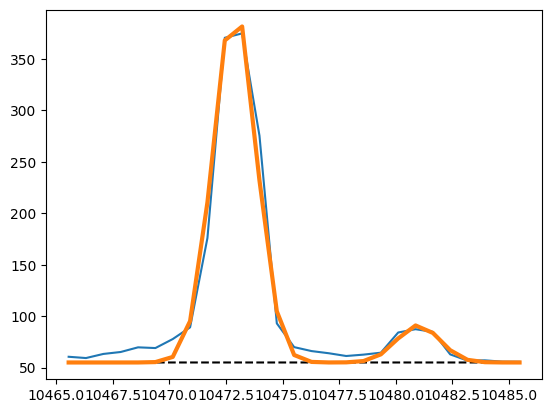

In [210]:
arc1_9532 = out_arc_9532.flatchain.arc1.mean()
arc2_9532 = out_arc_9532.flatchain.arc2.mean()
sigma_arc_9532 = out_arc_9532.flatchain.sigma.mean()

plt.plot(x_arc_9532, y_arc_9532)

plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, arc1_9532, 10472.88, 0, sigma_arc_9532), ls='--', color='black')
plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, arc2_9532, 10481, 0, sigma_arc_9532), ls='--', color='black')

plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, arc1_9532, 10472.88, 0, sigma_arc_9532) \
         + gaussian(x_arc_9532, arc2_9532, 10481, 0, sigma_arc_9532), lw=3
)

### Line fitting

In [211]:
sigma_nar_9532 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9532**2))
sigma_brd_9532 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9532**2))

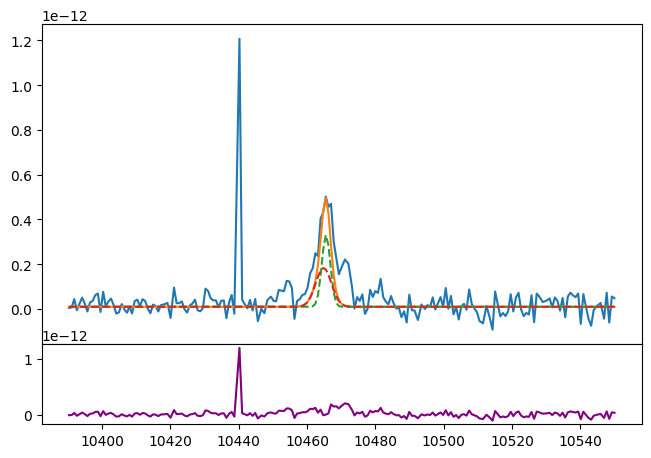

In [212]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9532.wavelength, siii_9532.flux)
bkg = 1e-14

siiia_nar = gaussian(siii_9532.wavelength, 1e-12, wave_cat['[SIII]9532'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, 1e-12, wave_cat['[SIII]9532'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9532))

ax.plot(siii_9532.wavelength, bkg + siiia_nar + siiia_brd)
ax.plot(siii_9532.wavelength, bkg + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg + siiia_brd, ls='--')
ax1.plot(siii_9532.wavelength, siii_9532.flux - bkg - siiia_nar - siiia_brd, color='purple')
#ax.set_yscale('log')

In [213]:
params_siiia = Parameters()
params_siiia.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiia.add('z_ratio', value=z_ratio, vary=False)
params_siiia.add('sigma_nar', value=upy.nominal_values(sigma_nar_9532), vary=False)
params_siiia.add('sigma_brd', value=upy.nominal_values(sigma_brd_9532), vary=False)
params_siiia.add('Siiia_nar', value=1.0e-12, min=0.)
params_siiia.add('Siiia_brd', value=1.0e-12, min=0.)
params_siiia.add('bkg', value=1e-14, min=0.)


def residual_siiia(params_siiia, x, data, uncertainty):
    
    z_nar = params_siiia['z_nar']
    z_brd = params_siiia['z_nar'] * params_siiia['z_ratio']
    sigma_nar = params_siiia['sigma_nar']
    sigma_brd = params_siiia['sigma_brd']
    siiia_nar_flux = params_siiia['Siiia_nar']
    siiia_brd_flux = params_siiia['Siiia_brd']
    bkg = params_siiia['bkg']
    
    x = siii_9532.wavelength
    model = gaussian(x, siiia_nar_flux, wave_cat['[SIII]9532'], z_nar, sigma_nar) + \
            gaussian(x, siiia_brd_flux, wave_cat['[SIII]9532'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9532.flux) / siii_9532.noise

In [214]:
np.random.seed(950)
out_siiia = minimize(residual_siiia, params_siiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 124.85it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [64.78458538 92.80912186 87.06653888 74.8694959 ]


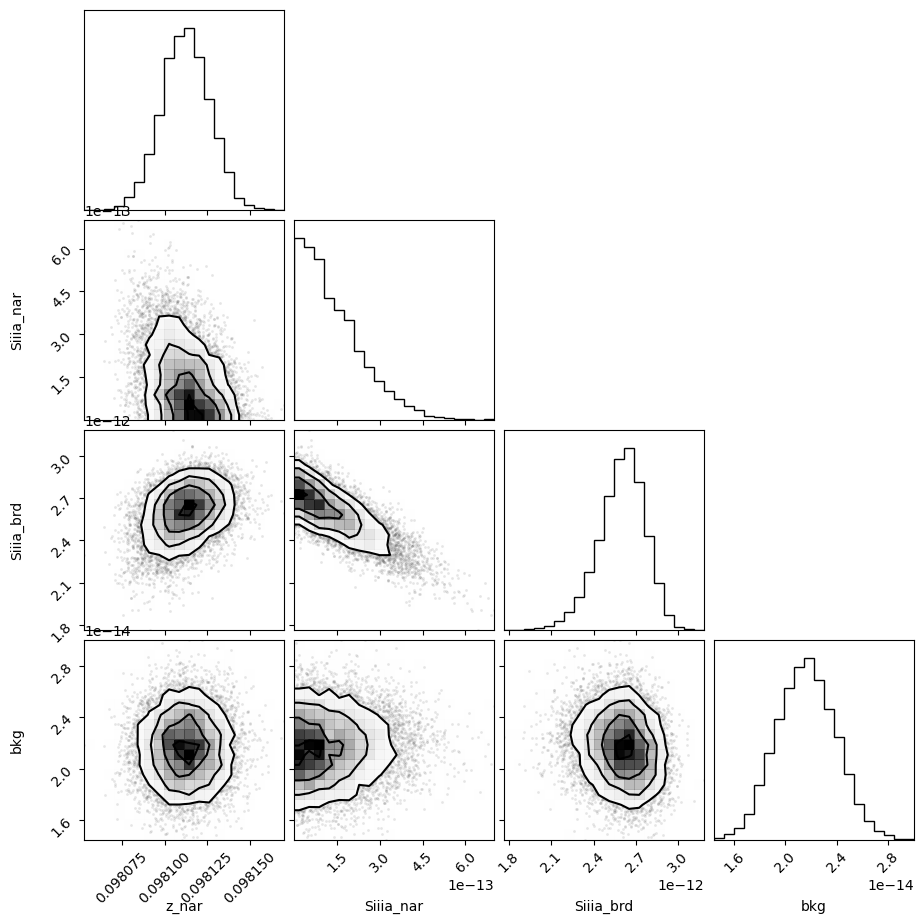

In [215]:
corner.corner(out_siiia.flatchain, labels=out_siiia.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [216]:
out_siiia.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09811244,1.3894e-05,(0.01%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.24434856,,,1.2443485646666888,-inf,inf,False
sigma_brd,2.30171924,,,2.301719238569604,-inf,inf,False
Siiia_nar,1.1369e-13,1.0723e-13,(94.32%),1e-12,0.00000000,inf,True
Siiia_brd,2.6107e-12,1.6216e-13,(6.21%),1e-12,0.00000000,inf,True
bkg,2.1645e-14,2.3111e-15,(10.68%),1e-14,0.00000000,inf,True


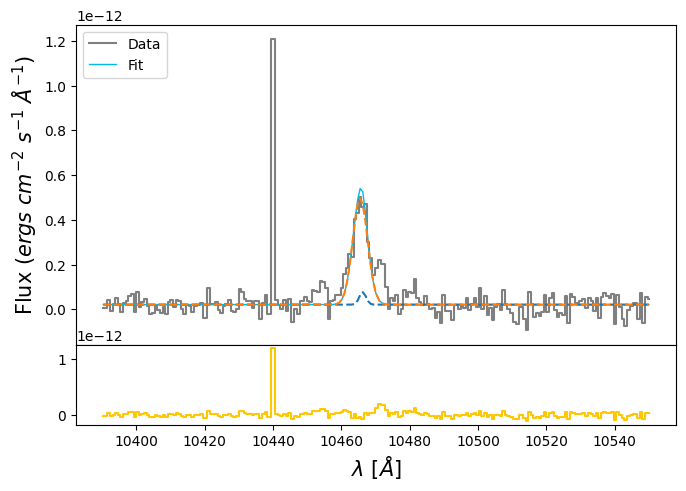

In [217]:
siiia_nar_flux = out_siiia.flatchain.Siiia_nar.mean()
siiia_nar_std = out_siiia.flatchain.Siiia_nar.std()

siiia_brd_flux = out_siiia.flatchain.Siiia_brd.mean()
siiia_brd_std = out_siiia.flatchain.Siiia_brd.std()

z_siiia = out_siiia.flatchain.z_nar.mean()
z_siiia_std = out_siiia.flatchain.z_nar.std()

bkg_siiia = out_siiia.flatchain.bkg.mean()
bkg_siiia_std = out_siiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9532.wavelength, siii_9532.flux,
            color='gray', label='Data', where='mid')

siiia_nar = gaussian(siii_9532.wavelength, siiia_nar_flux, wave_cat['[SIII]9532'], z_siiia, sigma_nar_oiii_4959)
siiia_brd = gaussian(siii_9532.wavelength, siiia_brd_flux, wave_cat['[SIII]9532'], z_siiia * z_ratio, sigma_brd_oiii_4959)
siiia = siiia_nar + siiia_brd

ax.plot(siii_9532.wavelength, bkg_siiia + siiia, lw=1, color=c[0], label='Fit')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_brd, ls='--')
ax1.step(siii_9532.wavelength, siii_9532.flux - bkg_siiia - siiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [218]:
# EW
EW_SIII_9532_nar = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532_brd = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532 = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)

# [SIII]9069

### Arc lines

In [219]:
wave_cat['[SIII]9069']*(1 + z_BN[igal])

9957.640201000002

In [220]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9069 = [wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 80, wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 100]
mask_arc_9069 = (wcal_red[21].data['wave_soln'][0] >= wlims_9069[0]) & (wcal_red[21].data['wave_soln'][0] < wlims_9069[1])

# Arc spectra around the fitted line
x_arc_9069 = wcal_red[21].data['wave_soln'][0][mask_arc_9069]
y_arc_9069 = wcal_red[21].data['spec'][0][mask_arc_9069]

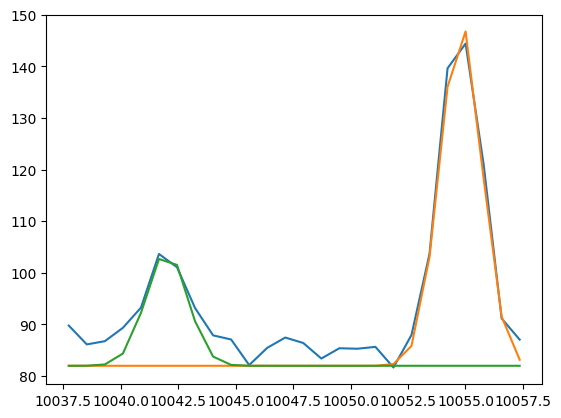

In [221]:
plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, 82 + gaussian(x_arc_9069, 150, 10054.8, 0, 0.9))
plt.plot(x_arc_9069, 82 + gaussian(x_arc_9069, 50, 10042, 0, 0.9))

In [222]:
params_arc_9069 = Parameters()
params_arc_9069.add('z', value=0.0, vary=False)
params_arc_9069.add('mu1', value=10054.8, vary=False)
params_arc_9069.add('mu2', value=10042, vary=False)
params_arc_9069.add('arc1', value=150, min=0.)
params_arc_9069.add('arc2', value=50, min=0.)
params_arc_9069.add('sigma', value=0.9, min=0.)
params_arc_9069.add('bkg', value=82, vary=False)

def residual_arc_9069(params_arc_9069, x, data, uncertainty):
    
    z = params_arc_9069['z']
    mu1 = params_arc_9069['mu1']
    mu2 = params_arc_9069['mu2']
    flux1 = params_arc_9069['arc1']
    flux2 = params_arc_9069['arc2']
    sigma = params_arc_9069['sigma']
    bkg = params_arc_9069['bkg']
    
    x = x_arc_9069
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_9069) / 10

np.random.seed(950)
out_arc_9069 = minimize(residual_arc_9069, params_arc_9069, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 135.37it/s]


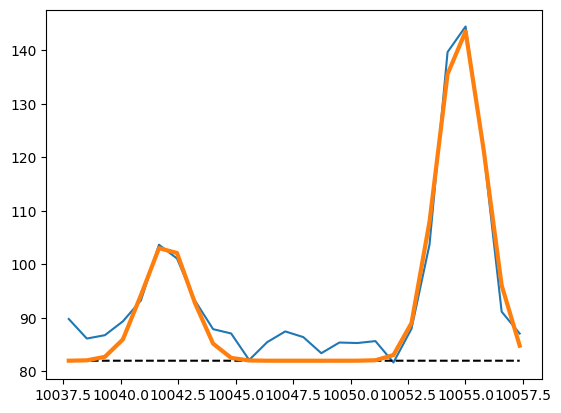

In [223]:
arc1_9069 = out_arc_9069.flatchain.arc1.mean()
arc2_9069 = out_arc_9069.flatchain.arc2.mean()
sigma_arc_9069 = out_arc_9069.flatchain.sigma.mean()

plt.plot(x_arc_9069, y_arc_9069)

plt.plot(x_arc_9069, 82 + gaussian(x_arc_9069, arc1_9069, 10054.8, 0, sigma_arc_9069), ls='--', color='black')
plt.plot(x_arc_9069, 82 + gaussian(x_arc_9069, arc2_9069, 10042, 0, sigma_arc_9069), ls='--', color='black')

plt.plot(x_arc_9069, 82 + gaussian(x_arc_9069, arc1_9069, 10054.8, 0, sigma_arc_9069) \
         + gaussian(x_arc_9069, arc2_9069, 10042, 0, sigma_arc_9069), lw=3
)

### Line fitting

In [224]:
sigma_nar_9069 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9069**2))
sigma_brd_9069 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9069**2))

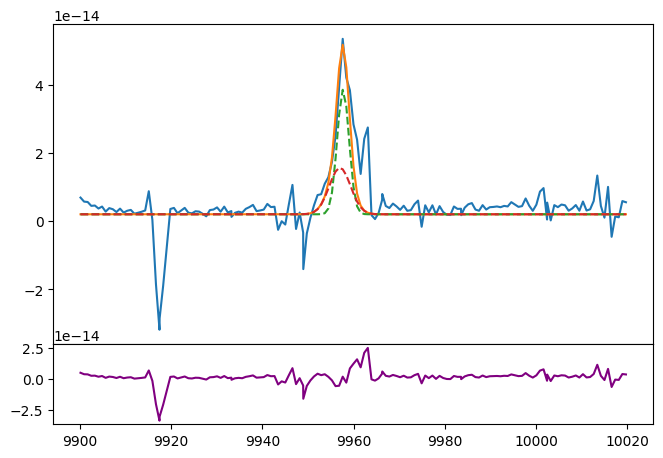

In [225]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9069.wavelength, siii_9069.flux)
bkg = 2e-15

siiib_nar = gaussian(siii_9069.wavelength, 12e-14, wave_cat['[SIII]9069'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, 8e-14, wave_cat['[SIII]9069'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9069))

ax.plot(siii_9069.wavelength, bkg + siiib_nar + siiib_brd)
ax.plot(siii_9069.wavelength, bkg + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg + siiib_brd, ls='--')
ax1.plot(siii_9069.wavelength, siii_9069.flux - bkg - siiib_nar - siiib_brd, color='purple')
#ax.set_yscale('log')

In [226]:
params_siiib = Parameters()
params_siiib.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiib.add('z_ratio', value=z_ratio, vary=False)
params_siiib.add('sigma_nar', value=upy.nominal_values(sigma_nar_9069), vary=False)
params_siiib.add('sigma_brd', value=upy.nominal_values(sigma_brd_9069), vary=False)
params_siiib.add('Siiib_nar', value=1.2e-13, min=0.)
params_siiib.add('Siiib_brd', value=0.8e-13, min=0.)
params_siiib.add('bkg', value=2e-15, min=0.)


def residual_siiib(params_siiib, x, data, uncertainty):
    
    z_nar = params_siiib['z_nar']
    z_brd = params_siiib['z_nar'] * params_siiib['z_ratio']
    sigma_nar = params_siiib['sigma_nar']
    sigma_brd = params_siiib['sigma_brd']
    siiib_nar_flux = params_siiib['Siiib_nar']
    siiib_brd_flux = params_siiib['Siiib_brd']
    bkg = params_siiib['bkg']
    
    x = siii_9069.wavelength
    model = gaussian(x, siiib_nar_flux, wave_cat['[SIII]9069'], z_nar, sigma_nar) + \
            gaussian(x, siiib_brd_flux, wave_cat['[SIII]9069'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9069.flux) / siii_9069.noise

In [227]:
np.random.seed(950)
out_siiib = minimize(residual_siiib, params_siiib, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 130.95it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 98.56993937 104.95001749 108.92098185  78.33804714]


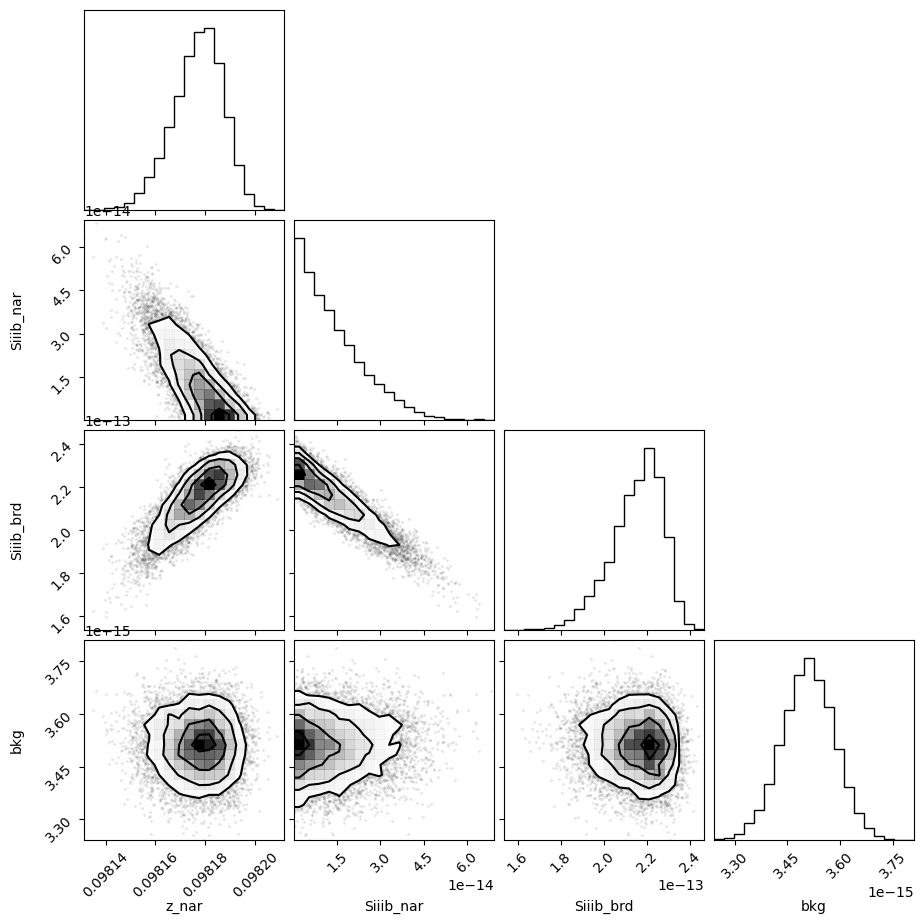

In [228]:
corner.corner(out_siiib.flatchain, labels=out_siiib.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [229]:
out_siiib.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09817779,1.0079e-05,(0.01%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.30598807,,,1.3059880684919076,-inf,inf,False
sigma_brd,2.33561832,,,2.3356183202434027,-inf,inf,False
Siiib_nar,1.0976e-14,1.1037e-14,(100.55%),1.2e-13,0.00000000,inf,True
Siiib_brd,2.1694e-13,1.1730e-14,(5.41%),8e-14,0.00000000,inf,True
bkg,3.5110e-15,7.4382e-17,(2.12%),2e-15,0.00000000,inf,True


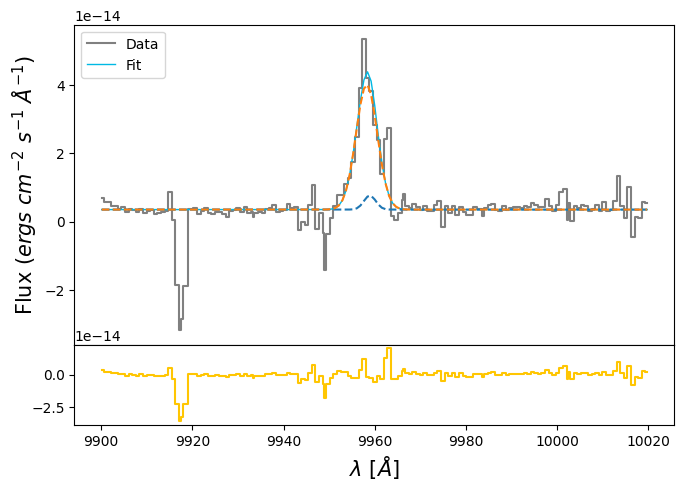

In [230]:
siiib_nar_flux = out_siiib.flatchain.Siiib_nar.mean()
siiib_nar_std = out_siiib.flatchain.Siiib_nar.std()

siiib_brd_flux = out_siiib.flatchain.Siiib_brd.mean()
siiib_brd_std = out_siiib.flatchain.Siiib_brd.std()

z_siiib = out_siiib.flatchain.z_nar.mean()
z_siiib_std = out_siiib.flatchain.z_nar.std()

bkg_siiib = out_siiib.flatchain.bkg.mean()
bkg_siiib_std = out_siiib.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9069.wavelength, siii_9069.flux,
            color='gray', label='Data', where='mid')

siiib_nar = gaussian(siii_9069.wavelength, siiib_nar_flux, wave_cat['[SIII]9069'], z_siiib, upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, siiib_brd_flux, wave_cat['[SIII]9069'], z_siiib * z_ratio, upy.nominal_values(sigma_brd_9069))
siiib = siiib_nar + siiib_brd

ax.plot(siii_9069.wavelength, bkg_siiib + siiib, lw=1, color=c[0], label='Fit')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_brd, ls='--')
ax1.step(siii_9069.wavelength, siii_9069.flux - bkg_siiib - siiib, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [231]:
# EW
EW_SIII_9069_nar = ufloat(siiib_nar_flux, siiib_nar_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069_brd = ufloat(siiib_brd_flux, siiib_brd_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069 = (ufloat(siiib_nar_flux, siiib_nar_std) + ufloat(siiib_brd_flux, siiib_brd_std)) / ufloat(bkg_siiib, bkg_siiib_std)

# [OI]6300 + [SIII]6312

### Arc lines

In [232]:
wave_cat['[SIII]6312']*(1 + z_BN[igal])

6930.862802100001

In [233]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6312 = [wave_cat['[SIII]6312']*(1 + z_BN[igal]), wave_cat['[SIII]6312']*(1 + z_BN[igal]) + 20]
mask_arc_6312 = (wcal_red[15].data['wave_soln'][0] >= wlims_6312[0]) & (wcal_red[15].data['wave_soln'][0] < wlims_6312[1])

# Arc spectra around the fitted line
x_arc_6312 = wcal_red[15].data['wave_soln'][0][mask_arc_6312]
y_arc_6312 = wcal_red[15].data['spec'][0][mask_arc_6312]

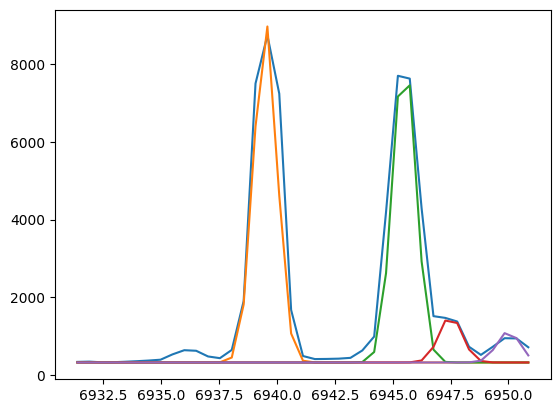

In [234]:
plt.plot(x_arc_6312, y_arc_6312)
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, 11000, 6939.5, 0, 0.5))
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, 10000, 6945.5, 0, 0.5))
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, 1500, 6947.5, 0, 0.5))
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, 1000, 6950, 0, 0.5))

In [235]:
params_arc_6312 = Parameters()
params_arc_6312.add('z', value=0.0, vary=False)
params_arc_6312.add('mu1', value=6939.5, vary=False)
params_arc_6312.add('mu2', value=6945.5, vary=False)
params_arc_6312.add('mu3', value=6947.5, vary=False)
params_arc_6312.add('mu4', value=6950, vary=False)
params_arc_6312.add('arc1', value=11000, min=0.)
params_arc_6312.add('arc2', value=10000, min=0.)
params_arc_6312.add('arc3', value=1500, min=0.)
params_arc_6312.add('arc4', value=1000, min=0.)
params_arc_6312.add('sigma', value=0.5, min=0.)
params_arc_6312.add('bkg', value=320, vary=False)

def residual_arc_6312(params_arc_6312, x, data, uncertainty):
    
    z = params_arc_6312['z']
    mu1 = params_arc_6312['mu1']
    mu2 = params_arc_6312['mu2']
    mu3 = params_arc_6312['mu3']
    mu4 = params_arc_6312['mu4']
    flux1 = params_arc_6312['arc1']
    flux2 = params_arc_6312['arc2']
    flux3 = params_arc_6312['arc3']
    flux4 = params_arc_6312['arc4']
    sigma = params_arc_6312['sigma']
    bkg = params_arc_6312['bkg']
    
    x = x_arc_6312
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_6312) / 10

np.random.seed(950)
out_arc_6312 = minimize(residual_arc_6312, params_arc_6312, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:25<00:00, 98.88it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [78.10283978 81.72449591 23.10339372 99.33720158 67.39397507]


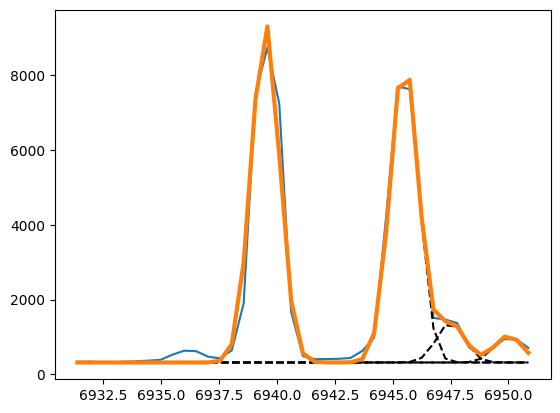

In [236]:
arc1_6312 = out_arc_6312.flatchain.arc1.mean()
arc2_6312 = out_arc_6312.flatchain.arc2.mean()
arc3_6312 = out_arc_6312.flatchain.arc3.mean()
arc4_6312 = out_arc_6312.flatchain.arc4.mean()
sigma_arc_6312 = out_arc_6312.flatchain.sigma.mean()

plt.plot(x_arc_6312, y_arc_6312)

plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, arc1_6312, 6939.5, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, arc2_6312, 6945.5, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, arc3_6312, 6947.5, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, arc4_6312, 6950, 0, sigma_arc_6312), ls='--', color='black')

plt.plot(x_arc_6312, 320 + gaussian(x_arc_6312, arc1_6312, 6939.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc2_6312, 6945.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc3_6312, 6947.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc4_6312, 6950, 0, sigma_arc_6312), lw=3
)

### Line fitting

In [237]:
sigma_nar_6312 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6312**2))
sigma_brd_6312 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6312**2))

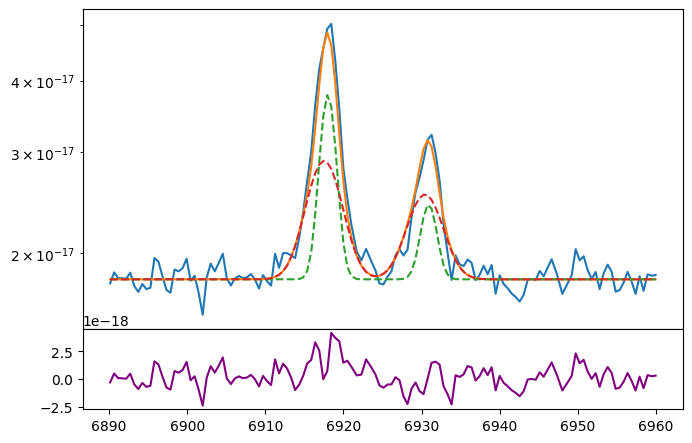

In [238]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 1.8e-17

oi_nar = gaussian(oi_siii.wavelength, 5.0e-17, wave_cat['[OI]6300'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, 6.0e-17, wave_cat['[OI]6300'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, 1.6e-17, wave_cat['[SIII]6312'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, 4.0e-17, wave_cat['[SIII]6312'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_nar + siiic_brd + oi_nar + oi_brd)
ax.plot(oi_siii.wavelength, bkg + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg + siiic_brd + oi_brd, ls='--')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_nar - siiic_brd - oi_nar - oi_brd, color='purple')
ax.set_yscale('log')

In [239]:
params_oi_siii = Parameters()
params_oi_siii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oi_siii.add('z_ratio', value=z_ratio, vary=False)
params_oi_siii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('Oi_nar', value=5.0e-17, min=0.)
params_oi_siii.add('Oi_brd', value=6.0e-17, min=0.)
params_oi_siii.add('Siiic_nar', value=1.6e-17, min=0.)
params_oi_siii.add('Siiic_brd', value=4.0e-17, min=0.)
params_oi_siii.add('bkg', value=1.8e-17, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_nar = params_oi_siii['z_nar']
    z_brd = params_oi_siii['z_nar'] * params_oi_siii['z_ratio']
    sigma_nar = params_oi_siii['sigma_nar']
    sigma_brd = params_oi_siii['sigma_brd']
    oi_nar = params_oi_siii['Oi_nar']
    oi_brd = params_oi_siii['Oi_brd']
    siiic_nar = params_oi_siii['Siiic_nar']
    siiic_brd = params_oi_siii['Siiic_brd']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_nar, wave_cat['[OI]6300'], z_nar, sigma_nar) \
             + gaussian(x, oi_brd, wave_cat['[OI]6300'], z_brd, sigma_brd)
    model_siii = gaussian(x, siiic_nar, wave_cat['[SIII]6312'], z_nar, sigma_nar) \
               + gaussian(x, siiic_brd, wave_cat['[SIII]6312'], z_brd, sigma_brd)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [240]:
np.random.seed(950)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:27<00:00, 91.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [51.43565558 64.91921725 89.10160897 89.35109805 86.81928095 49.98792138]


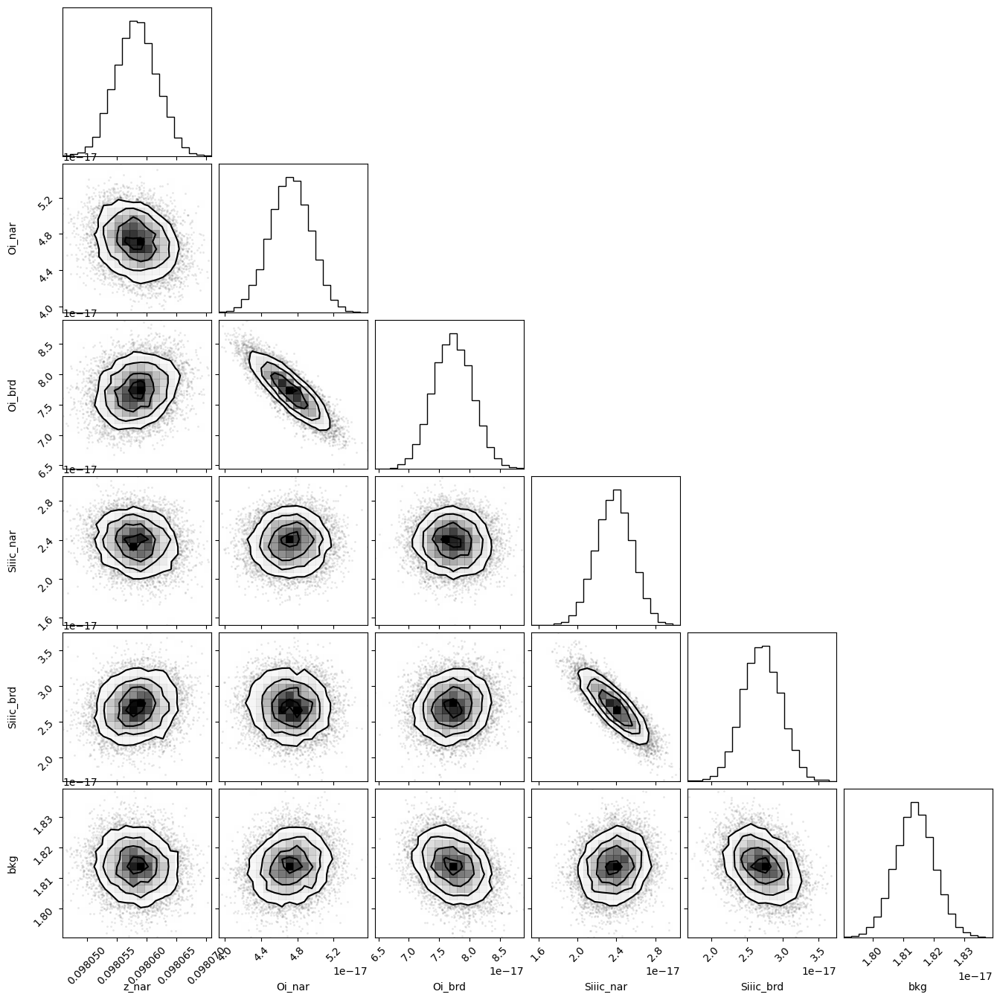

In [241]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [242]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09805826,3.5398e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,1.00715004,,,1.0071500371742625,-inf,inf,False
sigma_brd,2.18262670,,,2.1826266973977724,-inf,inf,False
Oi_nar,4.7225e-17,2.2531e-18,(4.77%),5e-17,0.00000000,inf,True
Oi_brd,7.7245e-17,3.2264e-18,(4.18%),6e-17,0.00000000,inf,True
Siiic_nar,2.3781e-17,1.8424e-18,(7.75%),1.6e-17,0.00000000,inf,True
Siiic_brd,2.7083e-17,2.6795e-18,(9.89%),4e-17,0.00000000,inf,True
bkg,1.8139e-17,6.4344e-20,(0.35%),1.8e-17,0.00000000,inf,True


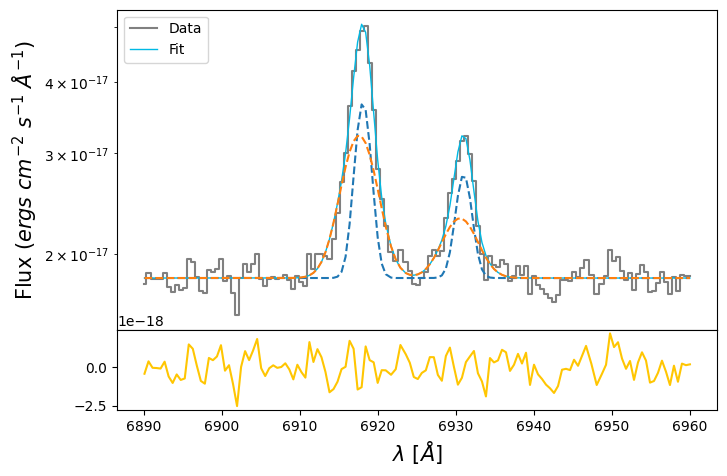

In [243]:
oi_nar_flux = out_oi_siii.flatchain.Oi_nar.mean()
oi_nar_std = out_oi_siii.flatchain.Oi_nar.std()

oi_brd_flux = out_oi_siii.flatchain.Oi_brd.mean()
oi_brd_std = out_oi_siii.flatchain.Oi_brd.std()

siiic_nar_flux = out_oi_siii.flatchain.Siiic_nar.mean()
siiic_nar_std = out_oi_siii.flatchain.Siiic_nar.std()

siiic_brd_flux = out_oi_siii.flatchain.Siiic_brd.mean()
siiic_brd_std = out_oi_siii.flatchain.Siiic_brd.std()

z_oi_siii = out_oi_siii.flatchain.z_nar.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_nar.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oi_nar = gaussian(oi_siii.wavelength, oi_nar_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, oi_brd_flux, wave_cat['[OI]6300'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, siiic_nar_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, siiic_brd_flux, wave_cat['[SIII]6312'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

oi = oi_nar + oi_brd
siiic = siiic_nar + siiic_brd

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oi,
        lw=1, color=c[0], label='Fit')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_brd + oi_brd, ls='--')

ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oi,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [244]:
# EW
EW_OI_6300_nar = ufloat(oi_nar_flux, oi_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300_brd = ufloat(oi_brd_flux, oi_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300 = (ufloat(oi_nar_flux, oi_nar_std) + ufloat(oi_brd_flux, oi_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

EW_SIII_6312_nar = ufloat(siiic_nar_flux, siiic_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312_brd = ufloat(siiic_brd_flux, siiic_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = (ufloat(siiic_nar_flux, siiic_nar_std) + ufloat(siiic_brd_flux, siiic_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [OIII]5007 + HeI 5015

### Arc lines

In [245]:
wave_cat['[OIII]5007']*(1 + z_BN[igal])

5497.688853505

In [246]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5007 = [wave_cat['[OIII]5007']*(1 + z_BN[igal]) - 5, wave_cat['[OIII]5007']*(1 + z_BN[igal]) + 5]
mask_arc_5007 = (wcal_red[11].data['wave_soln'][0] >= wlims_5007[0]) & (wcal_red[11].data['wave_soln'][0] < wlims_5007[1])

# Arc spectra around the fitted line
x_arc_5007 = wcal_red[11].data['wave_soln'][0][mask_arc_5007]
y_arc_5007 = wcal_red[11].data['spec'][0][mask_arc_5007]

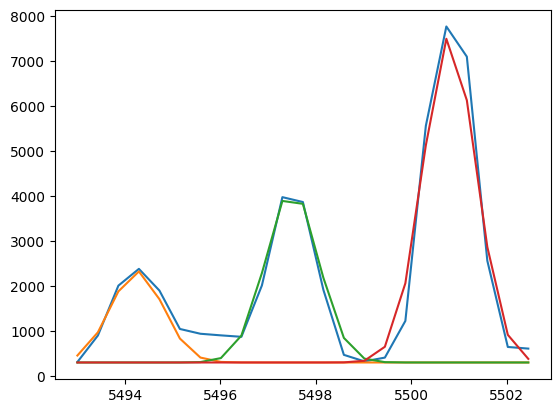

In [247]:
plt.plot(x_arc_5007, y_arc_5007)
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 2800, 5494.25, 0, 0.55))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 5300, 5497.5, 0, 0.55))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 10000, 5500.8, 0, 0.55))

In [248]:
params_arc_5007 = Parameters()
params_arc_5007.add('z', value=0.0, vary=False)
params_arc_5007.add('mu1', value=5494.25, vary=False)
params_arc_5007.add('mu2', value=5497.5, vary=False)
params_arc_5007.add('mu3', value=5500.8, vary=False)
params_arc_5007.add('arc1', value=2800, min=0.)
params_arc_5007.add('arc2', value=5300, min=0.)
params_arc_5007.add('arc3', value=10000, min=0.)
params_arc_5007.add('sigma', value=0.55, min=0.)
params_arc_5007.add('bkg', value=300, vary=False)

def residual_arc_5007(params_arc_5007, x, data, uncertainty):
    
    z = params_arc_5007['z']
    mu1 = params_arc_5007['mu1']
    mu2 = params_arc_5007['mu2']
    mu3 = params_arc_5007['mu3']
    flux1 = params_arc_5007['arc1']
    flux2 = params_arc_5007['arc2']
    flux3 = params_arc_5007['arc3']
    sigma = params_arc_5007['sigma']
    bkg = params_arc_5007['bkg']
    
    x = x_arc_5007
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_5007) / 10

np.random.seed(950)
out_arc_5007 = minimize(residual_arc_5007, params_arc_5007, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 114.46it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.54367454 72.44627888 31.24704429 66.18237419]


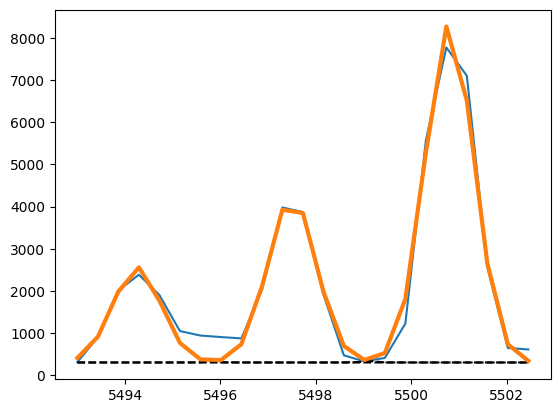

In [249]:
arc1_5007 = out_arc_5007.flatchain.arc1.mean()
arc2_5007 = out_arc_5007.flatchain.arc2.mean()
arc3_5007 = out_arc_5007.flatchain.arc3.mean()
sigma_arc_5007 = out_arc_5007.flatchain.sigma.mean()

plt.plot(x_arc_5007, y_arc_5007)

plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc1_5007, 5494.25, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc2_5007, 5497.5, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc3_5007, 5500.8, 0, sigma_arc_5007), ls='--', color='black')

plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc1_5007, 5494.25, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc2_5007, 5497.5, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc3_5007, 5500.8, 0, sigma_arc_5007), lw=3
)

### Line fitting

In [250]:
sigma_nar_5007 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5007**2))
sigma_brd_5007 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5007**2))

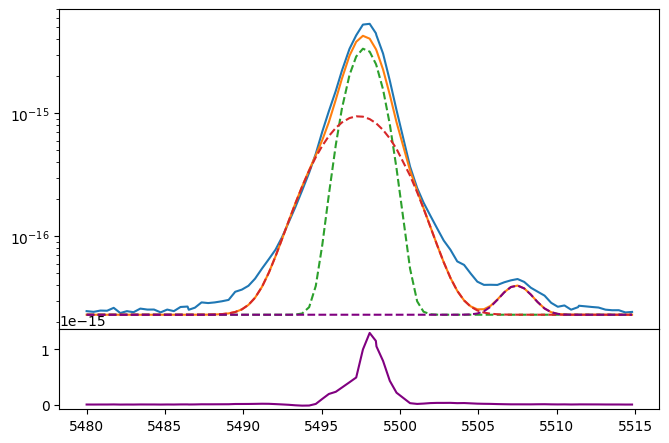

In [251]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 2.3e-17

oiiia_nar = gaussian(oiii_hei.wavelength, 8e-15, wave_cat['[OIII]5007'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, 5e-15, wave_cat['[OIII]5007'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5007))

hei_5015 = gaussian(oiii_hei.wavelength, 4e-17, wave_cat['HeI5015'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))

ax.plot(oiii_hei.wavelength, bkg + oiiia_nar + oiiia_brd + hei_5015)
ax.plot(oiii_hei.wavelength, bkg + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg + hei_5015, ls='--', color='purple')
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_nar - oiiia_brd - hei_5015, color='purple')
ax.set_yscale('log')

In [252]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiii_hei.add('z_ratio', value=z_ratio, vary=False)
params_oiii_hei.add('sigma_nar', value=upy.nominal_values(sigma_nar_5007), vary=False)
params_oiii_hei.add('sigma_brd', value=upy.nominal_values(sigma_brd_5007), vary=False)
params_oiii_hei.add('Hei', value=4e-17, min=0.)
params_oiii_hei.add('Oiiia_nar', value=8.0e-15, min=0.)
params_oiii_hei.add('Oiiia_brd', value=5.0e-15, min=0.)
params_oiii_hei.add('bkg', value=2.3e-17, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_nar = params_oiii_hei['z_nar']
    z_brd = params_oiii_hei['z_nar'] * params_oiii_hei['z_ratio']
    sigma_nar = params_oiii_hei['sigma_nar']
    sigma_brd = params_oiii_hei['sigma_brd']
    oiiia_nar = params_oiii_hei['Oiiia_nar']
    oiiia_brd = params_oiii_hei['Oiiia_brd']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_nar, wave_cat['[OIII]5007'], z_nar, sigma_nar) \
               + gaussian(x, oiiia_brd, wave_cat['[OIII]5007'], z_brd, sigma_brd)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_nar, sigma_nar)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [253]:
np.random.seed(950)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:22<00:00, 113.55it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 25.15391392 124.81361946  74.33757548  82.99700115  97.83530402]


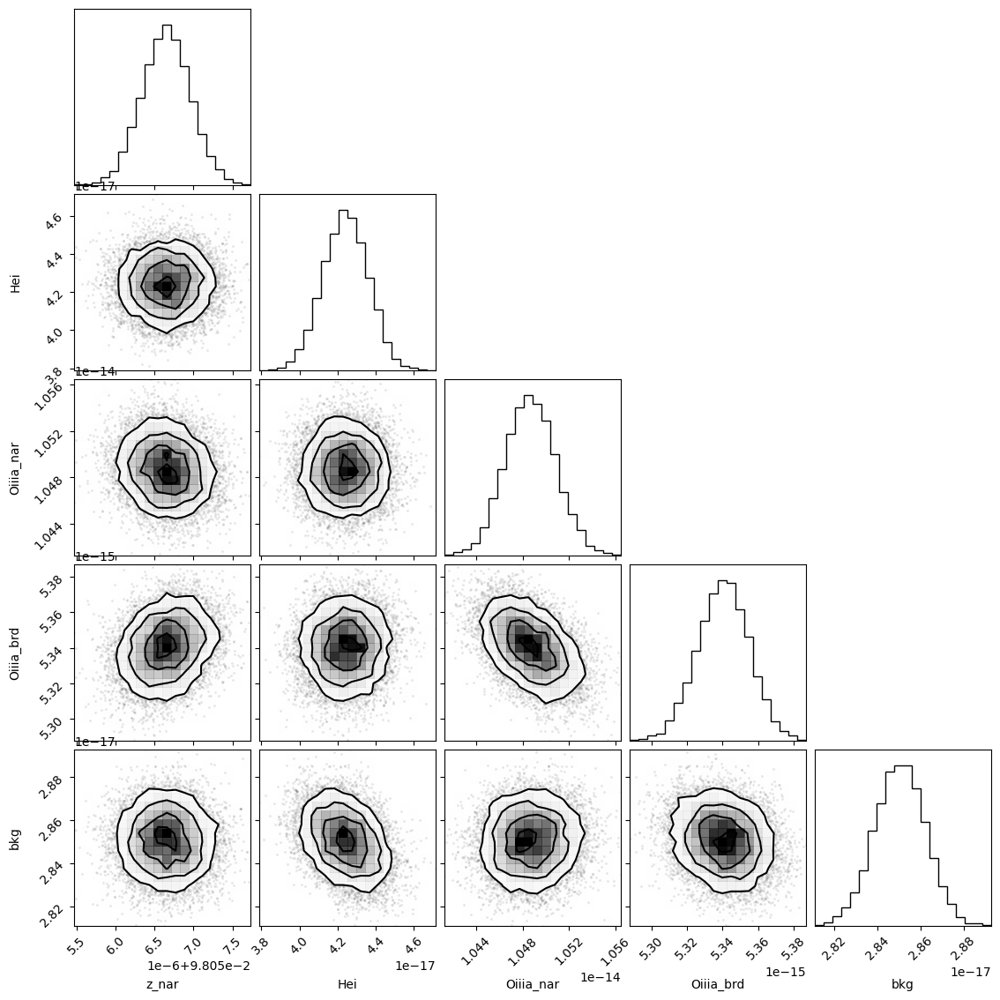

In [254]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [255]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09805665,3.1148e-07,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.95252320,,,0.9525232031553102,-inf,inf,False
sigma_brd,2.15796398,,,2.1579639837964493,-inf,inf,False
Hei,4.2420e-17,1.1893e-18,(2.80%),4e-17,0.00000000,inf,True
Oiiia_nar,1.0487e-14,2.1785e-17,(0.21%),8e-15,0.00000000,inf,True
Oiiia_brd,5.3406e-15,1.4411e-17,(0.27%),5e-15,0.00000000,inf,True
bkg,2.8506e-17,1.1851e-19,(0.42%),2.3e-17,0.00000000,inf,True


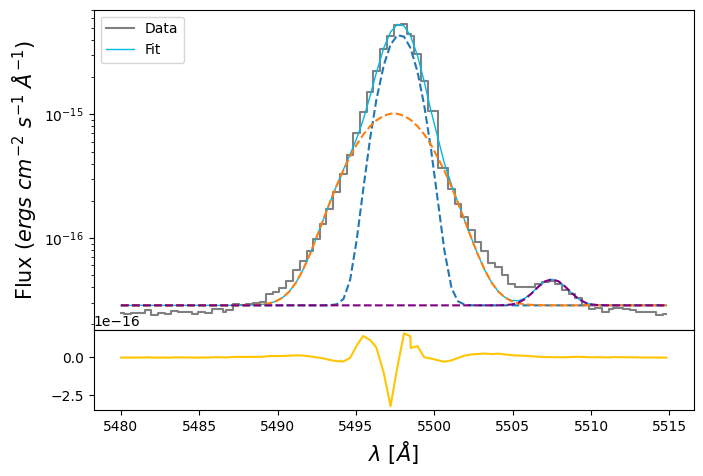

In [256]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_nar_flux = out_oiii_hei.flatchain.Oiiia_nar.mean()
oiiia_nar_std = out_oiii_hei.flatchain.Oiiia_nar.std()

oiiia_brd_flux = out_oiii_hei.flatchain.Oiiia_brd.mean()
oiiia_brd_std = out_oiii_hei.flatchain.Oiiia_brd.std()

z_oiii_hei = out_oiii_hei.flatchain.z_nar.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_nar.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))

oiiia_nar = gaussian(oiii_hei.wavelength, oiiia_nar_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, oiiia_brd_flux, wave_cat['[OIII]5007'], z_oiii_hei * z_ratio, upy.nominal_values(sigma_brd_5007))

oiiia = oiiia_nar + oiiia_brd

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [257]:
# EW
EW_OIII_5007_nar = ufloat(oiiia_nar_flux, oiiia_nar_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007_brd = ufloat(oiiia_brd_flux, oiiia_brd_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007 = (ufloat(oiiia_nar_flux, oiiia_nar_std) + ufloat(oiiia_brd_flux, oiiia_brd_std)) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [OIII]4363

### Arc lines

In [258]:
wave_cat['[OIII]4363']*(1 + z_BN[igal])

4790.956194315

In [259]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4363 = [wave_cat['[OIII]4363']*(1 + z_BN[igal]) - 5, wave_cat['[OIII]4363']*(1 + z_BN[igal]) + 5]
mask_arc_4363 = (wcal_red[7].data['wave_soln'][0] >= wlims_4363[0]) & (wcal_red[7].data['wave_soln'][0] < wlims_4363[1])

# Arc spectra around the fitted line
x_arc_4363 = wcal_red[7].data['wave_soln'][0][mask_arc_4363]
y_arc_4363 = wcal_red[7].data['spec'][0][mask_arc_4363]

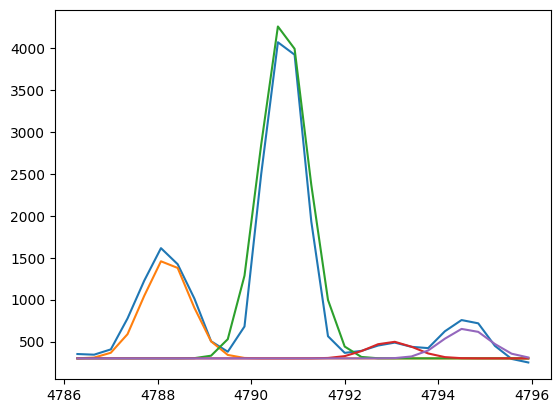

In [260]:
plt.plot(x_arc_4363, y_arc_4363)
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, 1500, 4788.2, 0, 0.5))
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, 5130, 4790.7, 0, 0.5))
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363,  250,   4793, 0, 0.5))
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363,  450, 4794.6, 0, 0.5))

In [261]:
params_arc_4363 = Parameters()
params_arc_4363.add('z', value=0.0, vary=False)
params_arc_4363.add('mu1', value=4788.2, vary=False)
params_arc_4363.add('mu2', value=4790.7, vary=False)
params_arc_4363.add('mu3', value=  4793, vary=False)
params_arc_4363.add('mu4', value=4794.6, vary=False)
params_arc_4363.add('arc1', value=1500, min=0.)
params_arc_4363.add('arc2', value=5130, min=0.)
params_arc_4363.add('arc3', value= 250, min=0.)
params_arc_4363.add('arc4', value= 450, min=0.)
params_arc_4363.add('sigma', value=0.5, min=0.)
params_arc_4363.add('bkg', value=300, vary=False)

def residual_arc_4363(params_arc_4363, x, data, uncertainty):
    
    z = params_arc_4363['z']
    mu1 = params_arc_4363['mu1']
    mu2 = params_arc_4363['mu2']
    mu3 = params_arc_4363['mu3']
    mu4 = params_arc_4363['mu4']
    flux1 = params_arc_4363['arc1']
    flux2 = params_arc_4363['arc2']
    flux3 = params_arc_4363['arc3']
    flux4 = params_arc_4363['arc4']
    sigma = params_arc_4363['sigma']
    bkg = params_arc_4363['bkg']
    
    x = x_arc_4363
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_4363) / 10

np.random.seed(950)
out_arc_4363 = minimize(residual_arc_4363, params_arc_4363, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:25<00:00, 99.71it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 55.50037693  75.23155355  59.21467692 119.96725021  94.23758776]


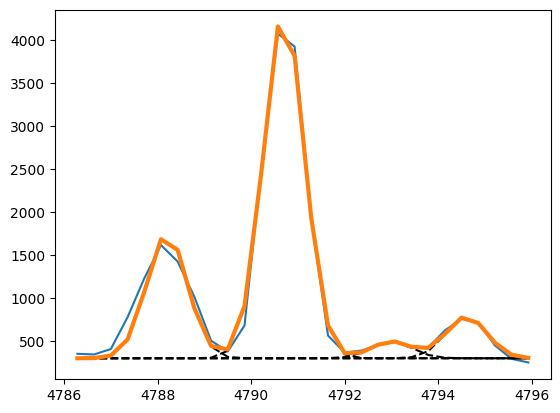

In [262]:
arc1_4363 = out_arc_4363.flatchain.arc1.mean()
arc2_4363 = out_arc_4363.flatchain.arc2.mean()
arc3_4363 = out_arc_4363.flatchain.arc3.mean()
arc4_4363 = out_arc_4363.flatchain.arc4.mean()
sigma_arc_4363 = out_arc_4363.flatchain.sigma.mean()

plt.plot(x_arc_4363, y_arc_4363)

plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, arc1_4363, 4788.2, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, arc2_4363, 4790.7, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, arc3_4363, 4793, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, arc4_4363, 4794.6, 0, sigma_arc_4363), ls='--', color='black')

plt.plot(x_arc_4363, 300 + gaussian(x_arc_4363, arc1_4363, 4788.2, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc2_4363, 4790.7, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc3_4363, 4793, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc4_4363, 4794.6, 0, sigma_arc_4363), lw=3
)

### Line fitting

In [263]:
sigma_nar_4363 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4363**2))
sigma_brd_4363 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4363**2))

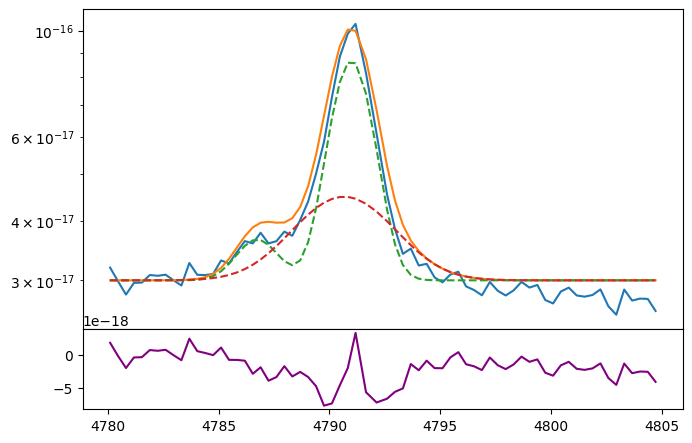

In [264]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 3e-17

feii_4360 = gaussian(oiii_4363.wavelength, 0.15e-16, wave_cat['[FeII]4360'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, 1.3e-16, wave_cat['[OIII]4363'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, 0.8e-16, wave_cat['[OIII]4363'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + oiiic_brd + feii_4360)
ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg + oiiic_brd, ls='--')
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_nar - oiiic_brd - feii_4360, color='purple')
ax.set_yscale('log')

In [265]:
params_oiiic = Parameters()

params_oiiic.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiiic.add('z_ratio', value=z_ratio, vary=False)
params_oiiic.add('sigma_nar', value=upy.nominal_values(sigma_nar_4363), vary=False)
params_oiiic.add('sigma_brd', value=upy.nominal_values(sigma_brd_4363), vary=False)
params_oiiic.add('Feii_4360_nar', value=0.15e-16, min=0.)
params_oiiic.add('Oiiic_nar', value=1.0e-16, min=0.)
params_oiiic.add('Oiiic_brd', value=1.0e-16, min=0.)
params_oiiic.add('bkg', value=3e-17, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_nar = params_oiiic['z_nar']
    z_brd = params_oiiic['z_nar'] * params_oiiic['z_ratio']
    sigma_nar = params_oiiic['sigma_nar']
    sigma_brd = params_oiiic['sigma_brd']
    feii_4360_flux = params_oiiic['Feii_4360_nar']
    oiiic_nar_flux = params_oiiic['Oiiic_nar']
    oiiic_brd_flux = params_oiiic['Oiiic_brd']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_nar_flux, wave_cat['[OIII]4363'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_brd_flux, wave_cat['[OIII]4363'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [266]:
np.random.seed(950)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:22<00:00, 113.08it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [47.1757898  50.96978778 90.20585675 93.98173437 36.34975094]


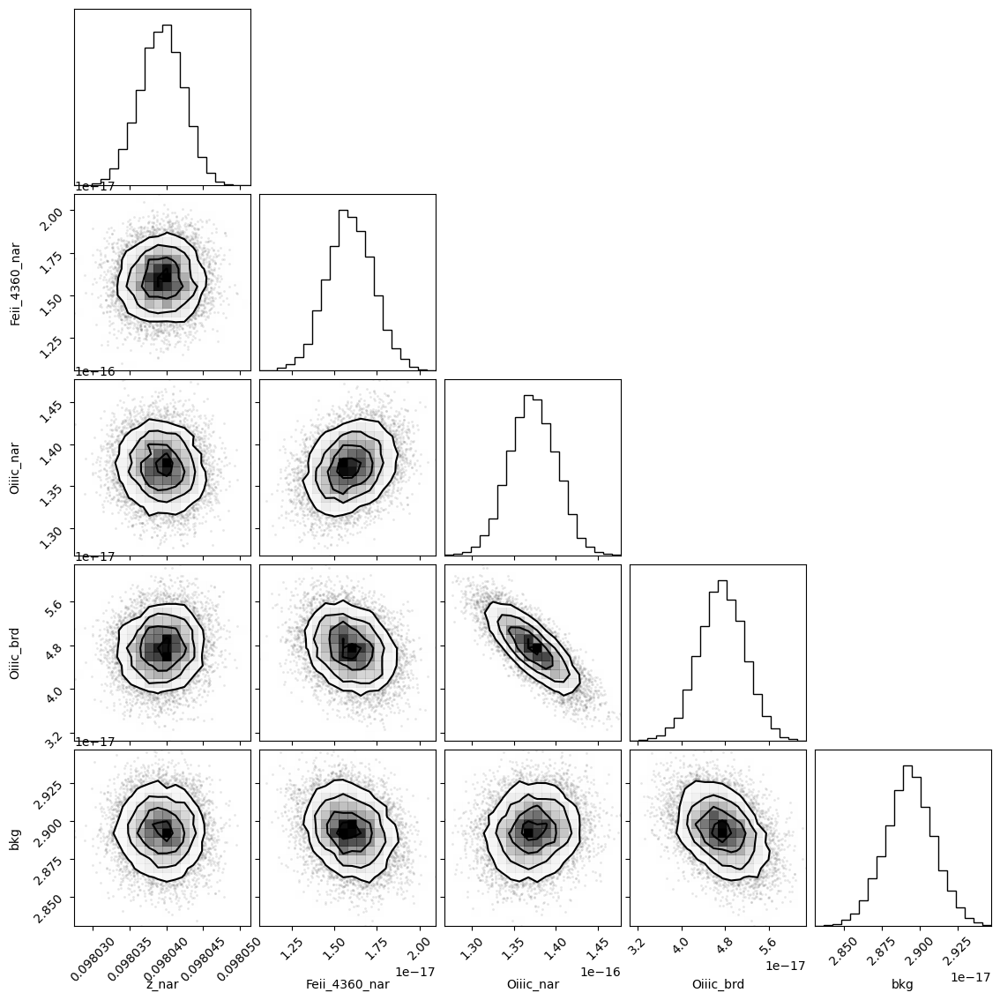

In [267]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [268]:
out_oiiic.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09803938,2.9655e-06,(0.00%),0.09804398536571471,-inf,inf,True
z_ratio,0.99922032,,,0.999220322500809,-inf,inf,False
sigma_nar,0.91623801,,,0.9162380137533156,-inf,inf,False
sigma_brd,2.14219518,,,2.1421951826712733,-inf,inf,False
Feii_4360_nar,1.5899e-17,1.3375e-18,(8.41%),1.5e-17,0.00000000,inf,True
Oiiic_nar,1.3722e-16,2.8220e-18,(2.06%),1e-16,0.00000000,inf,True
Oiiic_brd,4.7398e-17,4.2118e-18,(8.89%),1e-16,0.00000000,inf,True
bkg,2.8934e-17,1.5972e-19,(0.55%),3e-17,0.00000000,inf,True


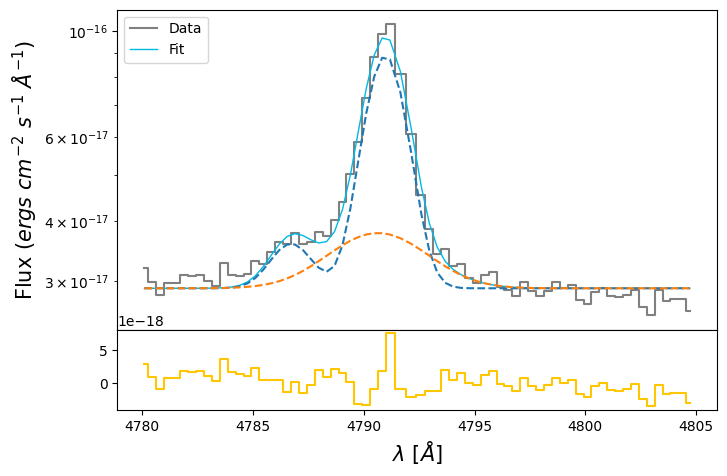

In [269]:
oiiic_nar_flux = out_oiiic.flatchain.Oiiic_nar.mean()
oiiic_nar_std = out_oiiic.flatchain.Oiiic_nar.std()

oiiic_brd_flux = out_oiiic.flatchain.Oiiic_brd.mean()
oiiic_brd_std = out_oiiic.flatchain.Oiiic_brd.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_nar.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_nar.std()

z_oiii = out_oiiic.flatchain.z_nar.mean()
z_oiii_std = out_oiiic.flatchain.z_nar.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_brd, ls='--')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [270]:
# EW
EW_OIII_4363_nar = ufloat(oiiic_nar_flux, oiiic_nar_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363_brd = ufloat(oiiic_brd_flux, oiiic_brd_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363 = (ufloat(oiiic_nar_flux, oiiic_nar_std) + ufloat(oiiic_brd_flux, oiiic_brd_std)) / ufloat(bkg_oiiic, bkg_oiiic_std)

# Saving arc data

In [271]:
sigma_arc = np.array([sigma_arc_3729,
                      sigma_arc_hd,
                      sigma_arc_hg,
                      sigma_arc_4363,
                      sigma_arc_4471,
                      sigma_arc_4685,
                      sigma_arc_hb,
                      sigma_arc_4959,
                      sigma_arc_5007,
                      sigma_arc_5755,
                      sigma_arc_5875,
                      sigma_arc_6312,
                      sigma_arc_ha,
                      sigma_arc_6678,
                      sigma_arc_6730,
                      sigma_arc_7065,
                      sigma_arc_7330,
                      sigma_arc_9069,
                      sigma_arc_9532])

x_arc = np.array([np.median(x_arc_3729),
                  np.median(x_arc_hd),
                  np.median(x_arc_hg),
                  np.median(x_arc_4363),
                  np.median(x_arc_4471),
                  np.median(x_arc_4685),
                  np.median(x_arc_hb),
                  np.median(x_arc_4959),
                  np.median(x_arc_5007),
                  np.median(x_arc_5755),
                  np.median(x_arc_5875),
                  np.median(x_arc_6312),
                  np.median(x_arc_ha),
                  np.median(x_arc_6678),
                  np.median(x_arc_6730),
                  np.median(x_arc_7065),
                  np.median(x_arc_7330),
                  np.median(x_arc_9069),
                  np.median(x_arc_9532)])

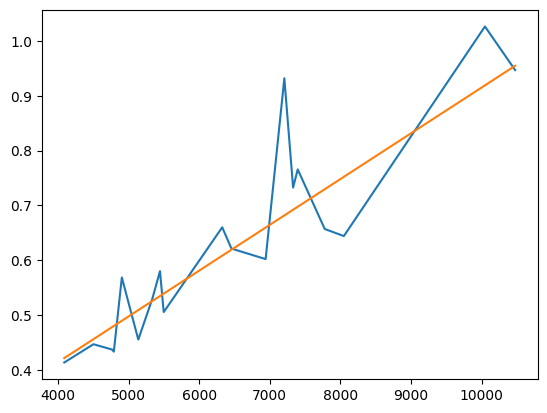

In [272]:
plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (((sigma_arc[-1] - sigma_arc[0])/(x_arc[-1] - x_arc[0])) * x_arc) + 0.08)

In [273]:
params_sigma_arc = Parameters()
params_sigma_arc.add('m', value=8.352049304985616e-05)
params_sigma_arc.add('n', value=0.08)

def residual_sigma_arc(params_sigma_arc, x, data, uncertainty):
    
    m = params_sigma_arc['m']
    n = params_sigma_arc['n']
    
    x = x_arc
    model = (m * x_arc) + n
    return (model - sigma_arc) / 0.05

np.random.seed(950)
out_sigma_arc = minimize(residual_sigma_arc, params_sigma_arc, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:10<00:00, 231.47it/s]


In [274]:
lmfit.report_fit(out_sigma_arc.params)

[[Variables]]
    m:  9.1375e-05 +/- 6.6525e-06 (7.28%) (init = 8.352049e-05)
    n:  0.04053405 +/- 0.04407090 (108.73%) (init = 0.08)
[[Correlations]] (unreported correlations are < 0.100)
    C(m, n) = -0.9655


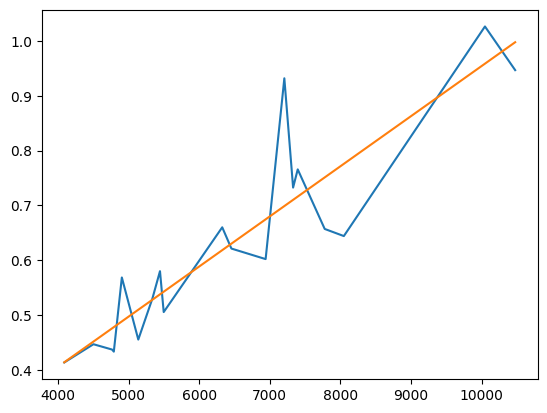

In [275]:
m = out_sigma_arc.flatchain.m.mean()
n = out_sigma_arc.flatchain.n.mean()

plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (m * x_arc) + n)

# Balmer decrements

In [276]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_nar.mean(), out_ha_nii.flatchain.Ha_nar.std()) \
            + ufloat(out_ha_nii.flatchain.Ha_brd.mean(), out_ha_nii.flatchain.Ha_brd.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_nar.mean(), out_hb.flatchain.Hb_nar.std()) \
            + ufloat(out_hb.flatchain.Hb_brd.mean(), out_hb.flatchain.Hb_brd.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_nar.mean(), out_hg.flatchain.Hg_nar.std()) \
            + ufloat(out_hg.flatchain.Hg_brd.mean(), out_hg.flatchain.Hg_brd.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_nar.mean(), out_hd.flatchain.Hd_nar.std()) \
            + ufloat(out_hd.flatchain.Hd_brd.mean(), out_hd.flatchain.Hd_brd.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

In [277]:
params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.2, min=0.)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer)) / 0.05

np.random.seed(950)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:11<00:00, 215.28it/s]


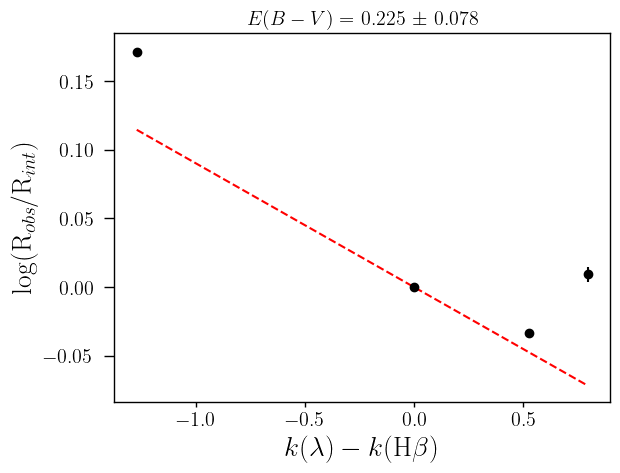

In [278]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'$E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J0950.pdf', bbox_inches='tight')

In [279]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Existent data for J0950, overwriting...
Done.


# Temperatures

In [280]:
heiia_nar_chain = out_heii4685.flatchain.Heii4685_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_brd_chain = out_heii4685.flatchain.Heii4685_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_tot_chain = heiia_nar_chain + heiia_brd_chain

heia_nar_chain = out_hei7065.flatchain.Hei7065_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_brd_chain = out_hei7065.flatchain.Hei7065_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_tot_chain = heia_nar_chain + heia_brd_chain

heib_nar_chain = out_hei6678.flatchain.Hei6678_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_brd_chain = out_hei6678.flatchain.Hei6678_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_tot_chain = heib_nar_chain + heib_brd_chain

heic_nar_chain = out_hei5875.flatchain.Hei5875_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_brd_chain = out_hei5875.flatchain.Hei5875_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_tot_chain = heic_nar_chain + heic_brd_chain

heid_nar_chain = out_hei4471.flatchain.Hei4471_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_brd_chain = out_hei4471.flatchain.Hei4471_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_tot_chain = heid_nar_chain + heid_brd_chain

oiiia_nar_chain = out_oiii_hei.flatchain.Oiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_brd_chain = out_oiii_hei.flatchain.Oiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_tot_chain = oiiia_nar_chain + oiiia_brd_chain

oiiib_nar_chain = out_oiii_4959.flatchain.Oiiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_brd_chain = out_oiii_4959.flatchain.Oiiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_tot_chain = oiiib_nar_chain + oiiib_brd_chain

oiiic_nar_chain = out_oiiic.flatchain.Oiiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_brd_chain = out_oiiic.flatchain.Oiiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_tot_chain = oiiic_nar_chain + oiiic_brd_chain

siia_nar_chain = out_sii.flatchain.Siia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_brd_chain = out_sii.flatchain.Siia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_tot_chain = siia_nar_chain + siia_brd_chain

siib_nar_chain = out_sii.flatchain.Siib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_brd_chain = out_sii.flatchain.Siib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_tot_chain = siib_nar_chain + siib_brd_chain

oiia_nar_chain = out_oii_7320.flatchain.Oiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_brd_chain = out_oii_7320.flatchain.Oiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_tot_chain = oiia_nar_chain + oiia_brd_chain

oiib_nar_chain = out_oii_7320.flatchain.Oiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_brd_chain = out_oii_7320.flatchain.Oiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_tot_chain = oiib_nar_chain + oiib_brd_chain

oiic_nar_chain = out_oii_3727.flatchain.Oiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_brd_chain = out_oii_3727.flatchain.Oiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_tot_chain = oiic_nar_chain + oiic_brd_chain

oiid_nar_chain = out_oii_3727.flatchain.Oiid_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_brd_chain = out_oii_3727.flatchain.Oiid_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_tot_chain = oiid_nar_chain + oiid_brd_chain

siiia_nar_chain = out_siiia.flatchain.Siiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_brd_chain = out_siiia.flatchain.Siiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_tot_chain = siiia_nar_chain + siiia_brd_chain

siiib_nar_chain = out_siiib.flatchain.Siiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_brd_chain = out_siiib.flatchain.Siiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_tot_chain = siiib_nar_chain + siiib_brd_chain

siiic_nar_chain = out_oi_siii.flatchain.Siiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_brd_chain = out_oi_siii.flatchain.Siiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_tot_chain = siiic_nar_chain + siiic_brd_chain

niia_nar_chain = out_ha_nii.flatchain.Niia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_brd_chain = out_ha_nii.flatchain.Niia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_tot_chain = niia_nar_chain + niia_brd_chain

niib_nar_chain = out_ha_nii.flatchain.Niia_nar * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_brd_chain = out_ha_nii.flatchain.Niia_brd * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_tot_chain = niib_nar_chain + niib_brd_chain

niic_nar_chain = out_nii.flatchain.Niic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]5755']))
niic_brd_chain = out_nii.flatchain.Niic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]5755']))
niic_tot_chain = niic_nar_chain + niic_brd_chain

hd_nar_chain = out_hd.flatchain.Hd_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_brd_chain = out_hd.flatchain.Hd_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_tot_chain = hd_nar_chain + hd_brd_chain

hg_nar_chain = out_hg.flatchain.Hg_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_brd_chain = out_hg.flatchain.Hg_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_tot_chain = hg_nar_chain + hg_brd_chain

hb_nar_chain = out_hb.flatchain.Hb_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_brd_chain = out_hb.flatchain.Hb_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_tot_chain = hb_nar_chain + hb_brd_chain

ha_nar_chain = out_ha_nii.flatchain.Ha_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_brd_chain = out_ha_nii.flatchain.Ha_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_tot_chain = ha_nar_chain + ha_brd_chain

In [283]:
chains_dict = {'[OII]3726_nar': oiid_nar_chain.to_numpy(),
               '[OII]3726_brd': oiid_brd_chain.to_numpy(),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': oiic_nar_chain.to_numpy(),
               '[OII]3729_brd': oiic_brd_chain.to_numpy(),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               'Hd_nar': hd_nar_chain.to_numpy(),
               'Hd_brd': hd_brd_chain.to_numpy(),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': hg_nar_chain.to_numpy(),
               'Hg_brd': hg_brd_chain.to_numpy(),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': oiiic_nar_chain.to_numpy(),
               '[OIII]4363_brd': oiiic_brd_chain.to_numpy(),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': heid_nar_chain.to_numpy(),
               'HeI4471_brd': heid_brd_chain.to_numpy(),
               'HeI4471': heid_tot_chain.to_numpy(),
               
               'HeII4686_nar': heiia_nar_chain.to_numpy(),
               'HeII4686_brd': heiia_brd_chain.to_numpy(),
               'HeII4686': heiia_tot_chain.to_numpy(),
               
               'Hb_nar': hb_nar_chain.to_numpy(),
               'Hb_brd': hb_brd_chain.to_numpy(),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': oiiib_nar_chain.to_numpy(),
               '[OIII]4959_brd': oiiib_brd_chain.to_numpy(),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': oiiia_nar_chain.to_numpy(),
               '[OIII]5007_brd': oiiia_brd_chain.to_numpy(),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': niic_nar_chain.to_numpy(),
               '[NII]5755_brd': niic_brd_chain.to_numpy(),
               '[NII]5755': niic_tot_chain.to_numpy(),
               
               'HeI5875_nar': heic_nar_chain.to_numpy(),
               'HeI5875_brd': heic_brd_chain.to_numpy(),
               'HeI5875': heic_tot_chain.to_numpy(),
               
               '[SIII]6312_nar': siiic_nar_chain.to_numpy(),
               '[SIII]6312_brd': siiic_brd_chain.to_numpy(),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': niib_nar_chain.to_numpy(),
               '[NII]6548_brd': niib_brd_chain.to_numpy(),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': ha_nar_chain.to_numpy(),
               'Ha_brd': ha_brd_chain.to_numpy(),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': niia_nar_chain.to_numpy(),
               '[NII]6584_brd': niia_brd_chain.to_numpy(),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': heib_nar_chain.to_numpy(),
               'HeI6678_brd': heib_brd_chain.to_numpy(),
               'HeI6678': heib_tot_chain.to_numpy(),
               
               '[SII]6716_nar': siib_nar_chain.to_numpy(),
               '[SII]6716_brd': siib_brd_chain.to_numpy(),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': siia_nar_chain.to_numpy(),
               '[SII]6730_brd': siia_brd_chain.to_numpy(),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': heia_nar_chain.to_numpy(),
               'HeI7065_brd': heia_brd_chain.to_numpy(),
               'HeI7065': heia_tot_chain.to_numpy(),
               
               '[OII]7319_nar': oiib_nar_chain.to_numpy(),
               '[OII]7319_brd': oiib_brd_chain.to_numpy(),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': oiia_nar_chain.to_numpy(),
               '[OII]7330_brd': oiia_brd_chain.to_numpy(),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': siiib_nar_chain.to_numpy(),
               '[SIII]9069_brd': siiib_brd_chain.to_numpy(),
               '[SIII]9069': siiib_tot_chain.to_numpy(),
               
               '[SIII]9532_nar': siiia_nar_chain.to_numpy(),
               '[SIII]9532_brd': siiia_brd_chain.to_numpy(),
               '[SIII]9532': siiia_tot_chain.to_numpy()
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J0950.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J0021.csv')

In [281]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': heid_tot_chain.mean(),
              'HeI4471_err': heid_tot_chain.std(),
              'HeII4686': heiia_tot_chain.mean(),
              'HeII4686_err': heiia_tot_chain.std(),
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5575': None,
              '[NII]5575_err':None,
              'HeI5875': heic_tot_chain.mean(),
              'HeI5875_err': heic_tot_chain.std(),
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': heib_tot_chain.mean(),
              'HeI6678_err': heib_tot_chain.std(),
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': heia_tot_chain.mean(),
              'HeI7065_err': heia_tot_chain.std(),
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': None,
              '[SIII]9069_err': None,
              '[SIII]9532': None,
              '[SIII]9532_err': None
              
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines.csv')

Existent catalog (.csv) file.
Existent data for J0950, overwriting...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal

galname = 'J0950'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]

if E_BV < 0:
    E_BV = 0

In [2]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J0950.csv')

In [6]:
t_OIII_nar = TO3(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['[OIII]4363_nar'].to_numpy())
t_OIII_brd = TO3(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['[OIII]4363_brd'].to_numpy())
t_OIII_tot = TO3(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['[OIII]4363'].to_numpy())

O2_H_nar = 10**(double_log_OH(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OIII_nar) - 12)
O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
O2_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['Hb'].to_numpy()    , t_OIII_tot) - 12)

O_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

IO2_R_nar = 9.36 * (t_OIII_nar**0.44) * O2_H_nar * chains['Hb_nar'].to_numpy()
IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
IO2_R_tot = 9.36 * (t_OIII_tot**0.44) * O2_H_tot * chains['Hb'].to_numpy()    

den_nar = ne(chains['[SII]6730_nar'].to_numpy(), chains['[SII]6716_nar'].to_numpy(), t_OIII_nar)
den_brd = ne(chains['[SII]6730_brd'].to_numpy(), chains['[SII]6716_brd'].to_numpy(), t_OIII_brd)
den_tot = ne(chains['[SII]6730'].to_numpy()    , chains['[SII]6716'].to_numpy()    , t_OIII_tot)

t_OII_nar = TO2(chains['[OII]7330_nar'].to_numpy(), chains['[OII]7319_nar'].to_numpy(), chains['[OII]3729_nar'].to_numpy(), chains['[OII]3726_nar'].to_numpy(), den_nar, IO2_R_nar)
t_OII_brd = TO2(chains['[OII]7330_brd'].to_numpy(), chains['[OII]7319_brd'].to_numpy(), chains['[OII]3729_brd'].to_numpy(), chains['[OII]3726_brd'].to_numpy(), den_brd, IO2_R_brd)
t_OII_tot = TO2(chains['[OII]7330'].to_numpy()    , chains['[OII]7319'].to_numpy()    , chains['[OII]3729'].to_numpy()    , chains['[OII]3726'].to_numpy()    , den_tot, IO2_R_tot)

# Garnett
t_OII_tot_garnett = ((0.7 * (t_OIII_tot * 10)) + 0.3) / 10

# PM17 DENSITY DEPENDENT
#t_OII_tot_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_tot_lin = (slope_o3o2 * t_OIII_tot) + intercept_o3o2

# Non-linear
#t_OII_tot_nlin = (2.4 / ((t_OIII_tot**-1) + 1.5))

# Polynomial
#t_OII_tot_poly = (-6.6 * t_OIII_tot) + (15.1 * (t_OIII_tot**2)) + (-8.3 * (t_OIII_tot**3)) + (0.69 * (t_OIII_tot**5))

# Square root
#t_OII_tot_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot))

#N_H_nar = 10**(log_NH_12(chains['[NII]6584_nar'].to_numpy(), chains['[NII]6548_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OII_nar) - 12)
#N_H_brd = 10**(log_NH_12(chains['[NII]6584_brd'].to_numpy(), chains['[NII]6548_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OII_brd) - 12)
N_H_tot = 10**(log_NH_12(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['Hb'].to_numpy()    , t_OII_tot) - 12)

#IN2_R_nar = 3.19 * ((t_OII_nar)**0.30) * N_H_nar * chains['Hb_nar'].to_numpy()
#IN2_R_brd = 3.19 * ((t_OII_brd)**0.30) * N_H_brd * chains['Hb_brd'].to_numpy()
#IN2_R_tot = 3.19 * ((t_OII_tot)**0.30) * N_H_tot * chains['Hb'].to_numpy()    

t_SIII_nar = TS3(chains['[SIII]9532_nar'].to_numpy(), chains['[SIII]9069_nar'].to_numpy(), chains['[SIII]6312_nar'].to_numpy())
t_SIII_brd = TS3(chains['[SIII]9532_brd'].to_numpy(), chains['[SIII]9069_brd'].to_numpy(), chains['[SIII]6312_brd'].to_numpy())
t_SIII_tot = TS3(chains['[SIII]9532'].to_numpy()    , chains['[SIII]9069'].to_numpy()    , chains['[SIII]6312'].to_numpy()    )

#t_NII_nar = TN2(chains['[NII]6584_nar'].to_numpy(), chains['[NII]6548_nar'].to_numpy(), chains['[NII]5755_nar'].to_numpy(), IN2_R_nar)
#t_NII_brd = TN2(chains['[NII]6584_brd'].to_numpy(), chains['[NII]6548_brd'].to_numpy(), chains['[NII]5755_brd'].to_numpy(), IN2_R_brd)
#t_NII_tot = TN2(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['[NII]5755'].to_numpy()    , IN2_R_tot)

In [4]:

N_H_tot = 10**(log_NH_12(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['Hb'].to_numpy()    , t_OII_tot) - 12)
IN2_R_tot = 3.19 * ((t_OII_tot * 10000)**0.30) * N_H_tot * chains['Hb'].to_numpy()    

(array([   8.,   60.,  425., 1437., 2755., 2915., 1754.,  545.,   88.,
          13.]),
 array([2.65563273, 2.74969638, 2.84376003, 2.93782369, 3.03188734,
        3.12595099, 3.22001464, 3.31407829, 3.40814195, 3.5022056 ,
        3.59626925]),
 <BarContainer object of 10 artists>)

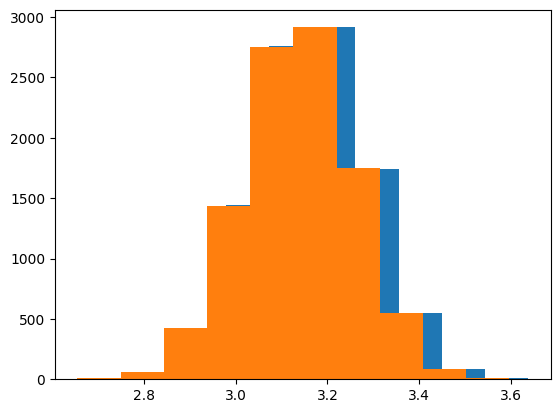

In [5]:
plt.hist(TN2(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['[NII]5755'].to_numpy()    , 0))
plt.hist(TN2(chains['[NII]6584'].to_numpy()    , chains['[NII]6548'].to_numpy()    , chains['[NII]5755'].to_numpy()    , IN2_R_tot))

Text(0.5, 0, 'T[NII]$_{tot}$ (10$^{4}$ K)')

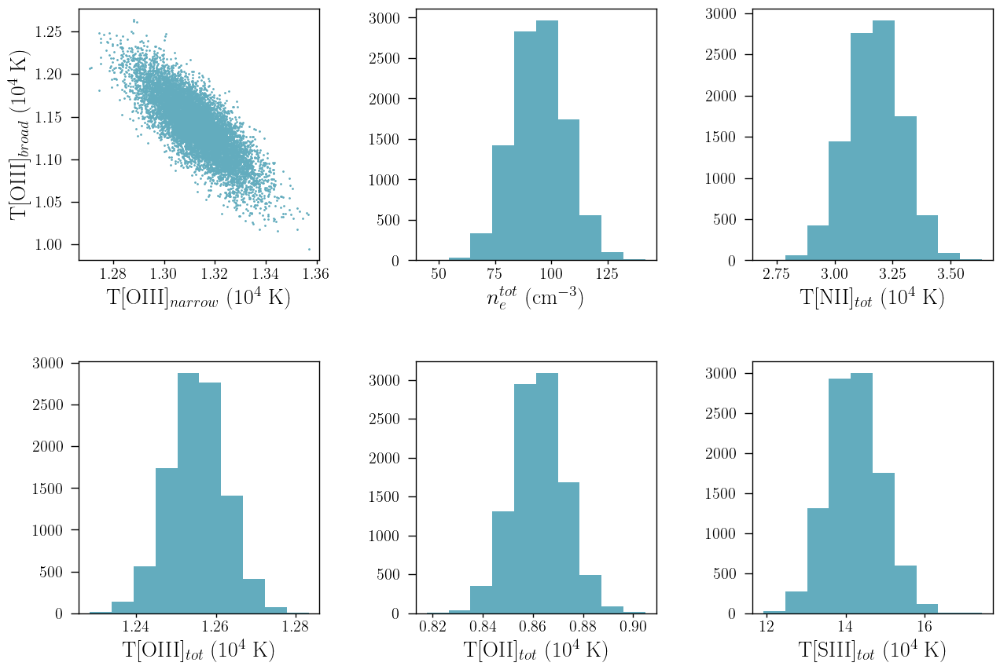

In [4]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')

axs[1, 0].hist(t_OIII_tot, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(den_tot, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(t_OII_tot, color=cr[2])
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

axs[1, 2].hist(t_SIII_tot, color=cr[2])
axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 2].hist(t_NII_tot, color=cr[2])
axs[0, 2].set_xlabel(r'T[NII]$_{tot}$ (10$^{4}$ K)')

# Using Temperature relations derived by me

In [350]:
#t_SIII_tot_temprel = (0.86 * t_OIII_tot) + 0.17

In [5]:
t_OIII_nar_mean = np.nanpercentile(t_OIII_nar, 50)
t_OIII_nar_16 = np.nanpercentile(t_OIII_nar, 16)
t_OIII_nar_84 = np.nanpercentile(t_OIII_nar, 84)

t_OIII_brd_mean = np.nanpercentile(t_OIII_brd, 50)
t_OIII_brd_16 = np.nanpercentile(t_OIII_brd, 16)
t_OIII_brd_84 = np.nanpercentile(t_OIII_brd, 84)

t_OIII_tot_mean = np.nanpercentile(t_OIII_tot, 50)
t_OIII_tot_16 = np.nanpercentile(t_OIII_tot, 16)
t_OIII_tot_84 = np.nanpercentile(t_OIII_tot, 84)

t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Measured by me
t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Photoionization models
t_OII_garnett = ((0.7 * (t_OIII_tot_mean * 10)) + 0.3) / 10
t_OII_garnett_16 = ((0.7 * (t_OIII_tot_16 * 10)) + 0.3) / 10
t_OII_garnett_84 = ((0.7 * (t_OIII_tot_84 * 10)) + 0.3) / 10

# Using PM
#t_OII_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_mean**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_16 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_16**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_84 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_84**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_lin = (slope_o3o2 * t_OIII_tot_mean) + intercept_o3o2
t_OII_lin_16 = (slope_o3o2 * t_OIII_tot_16) + intercept_o3o2
t_OII_lin_84 = (slope_o3o2 * t_OIII_tot_84) + intercept_o3o2

## Non-linear
#t_OII_nlin = (2.4 / ((t_OIII_tot_mean**-1) + 1.5))
#t_OII_nlin_16 = (2.4 / ((t_OIII_tot_16**-1) + 1.5))
#t_OII_nlin_84 = (2.4 / ((t_OIII_tot_84**-1) + 1.5))

## Polynomial
#t_OII_poly = (-6.6 * t_OIII_tot_mean) + (15.1 * (t_OIII_tot_mean**2)) + (-8.3 * (t_OIII_tot_mean**3)) + (0.69 * (t_OIII_tot_mean**5))
#t_OII_poly_16 = (-6.6 * t_OIII_tot_16) + (15.1 * (t_OIII_tot_16**2)) + (-8.3 * (t_OIII_tot_16**3)) + (0.69 * (t_OIII_tot_16**5))
#t_OII_poly_84 = (-6.6 * t_OIII_tot_84) + (15.1 * (t_OIII_tot_84**2)) + (-8.3 * (t_OIII_tot_84**3)) + (0.69 * (t_OIII_tot_84**5))

## Square-root
#t_OII_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot_mean))
#t_OII_sqrt_16 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_16))
#t_OII_sqrt_84 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_84))

density = np.nanpercentile(den_tot, 50)
density_16 = np.nanpercentile(den_tot, 16)
density_84 = np.nanpercentile(den_tot, 84)

#t_NII = np.nanpercentile(t_NII_tot, 50)
#t_NII_16 = np.nanpercentile(t_NII_tot, 16)
#t_NII_84 = np.nanpercentile(t_NII_tot, 84)
#
#t_SIII = np.nanpercentile(t_SIII_tot, 50)
#t_SIII_16 = np.nanpercentile(t_SIII_tot, 16)
#t_SIII_84 = np.nanpercentile(t_SIII_tot, 84)

In [289]:
temden_dict = {'galname': galname,
               'tOIII_nar': t_OIII_nar_mean,
               'tOIII_nar_16': t_OIII_nar_16,
               'tOIII_nar_84': t_OIII_nar_84,
               'tOIII_brd': t_OIII_brd_mean,
               'tOIII_brd_16': t_OIII_brd_16,
               'tOIII_brd_84': t_OIII_brd_84,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               #'tOII_PM': t_OII_PM,
               #'tOII_PM_16': t_OII_PM_16,
               #'tOII_PM_84': t_OII_PM_84,
               #'tOII_lin': t_OII_lin,
               #'tOII_lin_16': t_OII_lin_16,
               #'tOII_lin_84': t_OII_lin_84,
               #'tOII_nlin': t_OII_nlin,
               #'tOII_nlin_16': t_OII_nlin_16,
               #'tOII_nlin_84': t_OII_nlin_84,
               #'tOII_poly': t_OII_poly,
               #'tOII_poly_16': t_OII_poly_16,
               #'tOII_poly_84': t_OII_poly_84,
               #'tOII_sqrt': t_OII_sqrt,
               #'tOII_sqrt_16': t_OII_sqrt_16,
               #'tOII_sqrt_84': t_OII_sqrt_84,
               'ne': density,
               'ne_16': density_16,
               'ne_84': density_84,
               'tNII': None,
               'tNII_16': None,
               'tNII_84': None,
               'tSIII': None,
               'tSIII_16': None,
               'tSIII_84': None,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0950, adding new data...
Done.


In [6]:
temden_dict = {'galname': galname,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               'tOII_lin': t_OII_lin,
               'tOII_lin_16': t_OII_lin_16,
               'tOII_lin_84': t_OII_lin_84
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0950, adding new data...
Done.


# Abundances

In [7]:
# HELIUM

tau_4471 = 0.921 * E_BV * k_cal(wave_cat['HeI4471'])
tau_5875 = 0.921 * E_BV * k_cal(wave_cat['HeI5875'])
tau_6678 = 0.921 * E_BV * k_cal(wave_cat['HeI6678'])
tau_7065 = 0.921 * E_BV * k_cal(wave_cat['HeI7065'])

f_4471 = optical_depth_function(t_OIII_tot, den_tot, tau_4471, line='4471')
f_5875 = optical_depth_function(t_OIII_tot, den_tot, tau_5875, line='5875')
f_6678 = optical_depth_function(t_OIII_tot, den_tot, tau_6678, line='6678')
f_7065 = optical_depth_function(t_OIII_tot, den_tot, tau_7065, line='7065')

F4471, F5875, F6678, F7065 = emissivities(t_OIII_tot, den_tot)

y_plus_F4471 = yplus(chains['HeI4471'].to_numpy(), chains['Hb'].to_numpy(), F4471, f_4471)
y_plus_F5875 = yplus(chains['HeI5875'].to_numpy(), chains['Hb'].to_numpy(), F5875, f_5875)
y_plus_F6678 = yplus(chains['HeI6678'].to_numpy(), chains['Hb'].to_numpy(), F6678, f_6678)
y_plus_F7065 = yplus(chains['HeI7065'].to_numpy(), chains['Hb'].to_numpy(), F7065, f_7065)

y_plus = np.nanmean(np.array([y_plus_F4471,
                              y_plus_F5875,
                              y_plus_F6678,
                              y_plus_F7065]), axis=0)

y2_plus = y2plus(chains['HeII4686'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
y = y_plus + y2_plus

In [8]:
# OXYGEN MEASURED

log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_tot = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot)

O2plus_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) * ICF_Oxygen
log_OH_tot = np.log10(O_H_tot) + 12

In [9]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot)

O2plus_H_G92 = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_G92 = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) * ICF_Oxygen
log_OH_G92 = np.log10(O_H_G92) + 12

In [10]:
# OXYGEN lin

log_O2plus_H_lin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_lin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot)

O2plus_H_lin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_lin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_lin = (O2plus_H_lin + Oplus_H_lin) * ICF_Oxygen
log_OH_lin = np.log10(O_H_lin) + 12

In [358]:
# OXYGEN PM

#log_O2plus_H_PM = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_PM = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot)
#
#O2plus_H_PM = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_PM = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_PM = (O2plus_H_PM + Oplus_H_PM) * ICF_Oxygen
#log_OH_PM = np.log10(O_H_PM) + 12

In [360]:
# OXYGEN nlin

#log_O2plus_H_nlin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_nlin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot)
#
#O2plus_H_nlin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_nlin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_nlin = (O2plus_H_nlin + Oplus_H_nlin) * ICF_Oxygen
#log_OH_nlin = np.log10(O_H_nlin) + 12

In [361]:
# OXYGEN poly

#log_O2plus_H_poly = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_poly = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot)
#
#O2plus_H_poly = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_poly = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_poly = (O2plus_H_poly + Oplus_H_poly) * ICF_Oxygen
#log_OH_poly = np.log10(O_H_poly) + 12

In [362]:
# OXYGEN sqrt

#log_O2plus_H_sqrt = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_sqrt = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot)
#
#O2plus_H_sqrt = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_sqrt = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_sqrt = (O2plus_H_sqrt + Oplus_H_sqrt) * ICF_Oxygen
#log_OH_sqrt = np.log10(O_H_sqrt) + 12

In [363]:
# SULFUR

#log_S2plus_H_tot = double_log_S_noline(chains['[SIII]6312'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot_temprel)
#log_Splus_H_tot = single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)
#
#S2plus_H_tot = 10**(double_log_S_noline(chains['[SIII]6312'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot_temprel) - 12)
#Splus_H_tot = 10**(single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot) - 12)
#
#ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)
#
#S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
#log_SH_tot = np.log10(S_H_tot) + 12

In [11]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'].to_numpy(), chains['[NII]6548'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = np.log10(N_H_tot) + 12

In [12]:
# Nitrogen-to-Oxygen ratio
log_NO_tot = log_NO(chains['[NII]6584'].to_numpy(), chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), t_OII_tot)

(0.0, 1.0, 0.0, 1.0)

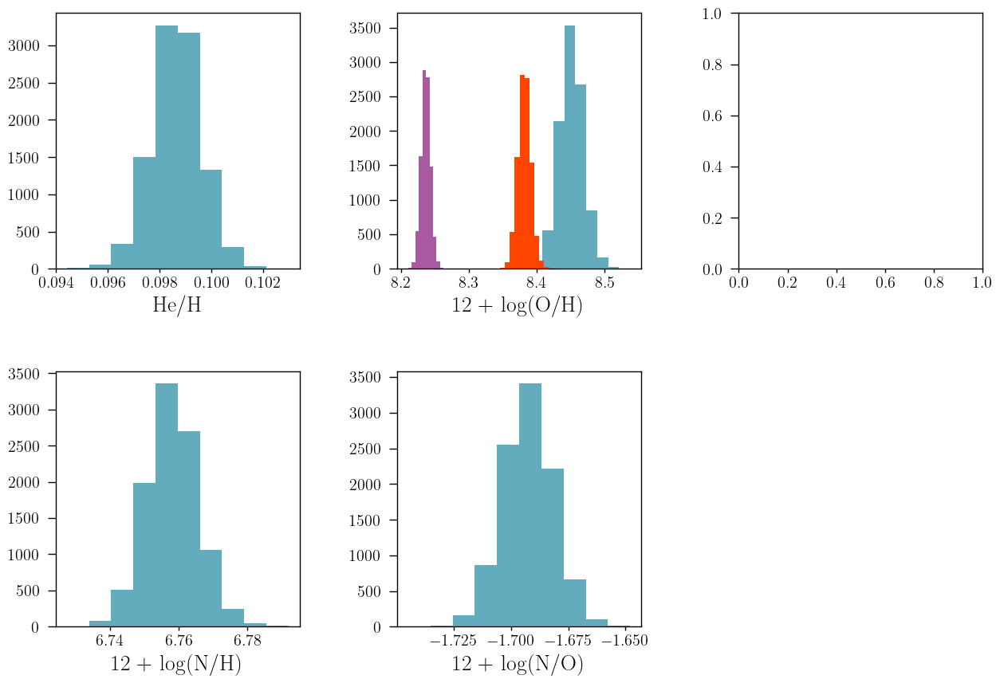

In [13]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(y, color=cr[2])
axs[0, 0].set_xlabel(r'He/H')

axs[0, 1].hist(log_OH_tot, color=cr[2])
axs[0, 1].hist(log_OH_G92, color='Orangered')
#axs[0, 1].hist(log_OH_PM, color='Pink')
axs[0, 1].hist(log_OH_lin, color=cz[1])
#axs[0, 1].hist(log_OH_nlin, color='Green')
#axs[0, 1].hist(log_OH_poly, color='Blue')
#axs[0, 1].hist(log_OH_sqrt, color='Gray')
axs[0, 1].set_xlabel(r'12 + log(O/H)')

#axs[0, 2].hist(log_SH_tot, color=cr[2])
#axs[0, 2].set_xlabel(r'12 + log(S/H)')

axs[1, 0].hist(log_NH_tot, color=cr[2])
axs[1, 0].set_xlabel(r'12 + log(N/H)')

axs[1, 1].hist(log_NO_tot, color=cr[2])
axs[1, 1].set_xlabel(r'12 + log(N/O)')

axs[1, 2].axis('off')

In [14]:
He_tot_mean = np.nanpercentile(y, 50)
He_tot_16 = np.nanpercentile(y, 16)
He_tot_84 = np.nanpercentile(y, 84)

log_OH_tot_mean = np.nanpercentile(log_OH_tot, 50)
log_OH_tot_16 = np.nanpercentile(log_OH_tot, 16)
log_OH_tot_84 = np.nanpercentile(log_OH_tot, 84)

log_OH_G92_mean = np.nanpercentile(log_OH_G92, 50)
log_OH_G92_16 = np.nanpercentile(log_OH_G92, 16)
log_OH_G92_84 = np.nanpercentile(log_OH_G92, 84)

#log_OH_PM_mean = np.nanpercentile(log_OH_PM, 50)
#log_OH_PM_16 = np.nanpercentile(log_OH_PM, 16)
#log_OH_PM_84 = np.nanpercentile(log_OH_PM, 84)

log_OH_lin_mean = np.nanpercentile(log_OH_lin, 50)
log_OH_lin_16 = np.nanpercentile(log_OH_lin, 16)
log_OH_lin_84 = np.nanpercentile(log_OH_lin, 84)

#log_OH_nlin_mean = np.nanpercentile(log_OH_nlin, 50)
#log_OH_nlin_16 = np.nanpercentile(log_OH_nlin, 16)
#log_OH_nlin_84 = np.nanpercentile(log_OH_nlin, 84)

#log_OH_poly_mean = np.nanpercentile(log_OH_poly, 50)
#log_OH_poly_16 = np.nanpercentile(log_OH_poly, 16)
#log_OH_poly_84 = np.nanpercentile(log_OH_poly, 84)

#log_OH_sqrt_mean = np.nanpercentile(log_OH_sqrt, 50)
#log_OH_sqrt_16 = np.nanpercentile(log_OH_sqrt, 16)
#log_OH_sqrt_84 = np.nanpercentile(log_OH_sqrt, 84)

#log_SH_tot_mean = np.nanpercentile(log_SH_tot, 50)
#log_SH_tot_16 = np.nanpercentile(log_SH_tot, 16)
#log_SH_tot_84 = np.nanpercentile(log_SH_tot, 84)

log_NH_tot_mean = np.nanpercentile(log_NH_tot, 50)
log_NH_tot_16 = np.nanpercentile(log_NH_tot, 16)
log_NH_tot_84 = np.nanpercentile(log_NH_tot, 84)

log_NO_tot_mean = np.nanpercentile(log_NO_tot, 50)
log_NO_tot_16 = np.nanpercentile(log_NO_tot, 16)
log_NO_tot_84 = np.nanpercentile(log_NO_tot, 84)

In [297]:
abundance_dict = {'galname': galname,
               'He/H': He_tot_mean,
               'He/H_16': He_tot_16,
               'He/H_84': He_tot_84,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               #'log_OH_PM': log_OH_G92_mean,
               #'log_OH_PM_16': log_OH_G92_16,
               #'log_OH_PM_84': log_OH_G92_84,
               #'log_OH_lin': log_OH_lin_mean,
               #'log_OH_lin_16': log_OH_lin_16,
               #'log_OH_lin_84': log_OH_lin_84,
               #'log_OH_nlin': log_OH_nlin_mean,
               #'log_OH_nlin_16': log_OH_nlin_16,
               #'log_OH_nlin_84': log_OH_nlin_84,
               #'log_OH_poly': log_OH_poly_mean,
               #'log_OH_poly_16': log_OH_poly_16,
               #'log_OH_poly_84': log_OH_poly_84,
               #'log_OH_sqrt': log_OH_sqrt_mean,
               #'log_OH_sqrt_16': log_OH_sqrt_16,
               #'log_OH_sqrt_84': log_OH_sqrt_84,
               'log_SH': None,
               'log_SH_16': None,
               'log_SH_84': None,
               'log_NH': log_NH_tot_mean,
               'log_NH_16': log_NH_tot_16,
               'log_NH_84': log_NH_tot_84,
               'log_NO': log_NO_tot_mean,
               'log_NO_16': log_NO_tot_16,
               'log_NO_84': log_NO_tot_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0950, adding new data...
Done.


In [15]:
abundance_dict = {'galname': galname,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               'log_OH_lin': log_OH_lin_mean,
               'log_OH_lin_16': log_OH_lin_16,
               'log_OH_lin_84': log_OH_lin_84
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0950, adding new data...
Done.


# Test for Starlight

(-2.5e-17, 1e-16)

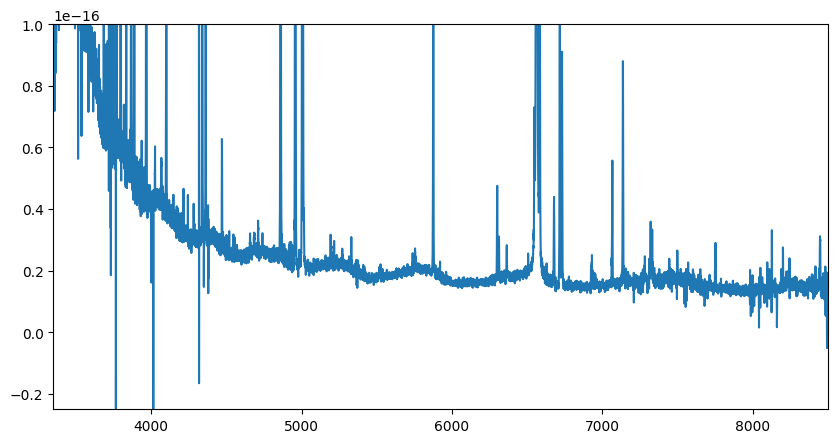

In [88]:
rf_wave = wave / (1 + z_nar_oiii_4959)
plt.figure(figsize=(10, 5))
plt.plot(rf_wave, flux)
plt.xlim(3350, 8500)
plt.ylim(-0.25e-16, 1e-16)

In [89]:
import spectres

rf_new_wave = np.arange(3350, 8500, 1)
new_flux, new_err = spectres.spectres(rf_new_wave, rf_wave, flux, err)

mask_flux = (new_flux > 0)

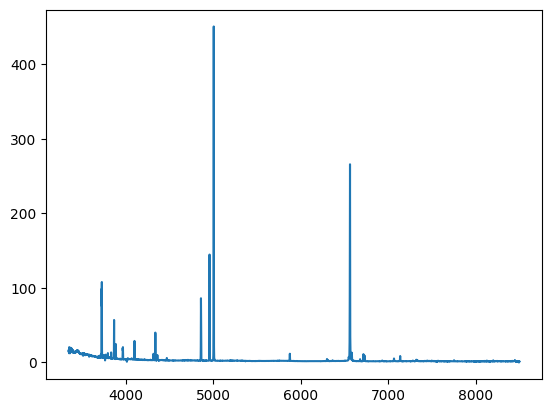

In [90]:
plt.plot(rf_new_wave, new_flux/1e-17)
#plt.xlim(9520, 9550)

In [91]:
mask = False
mask_count = 0
mask_list = []
for line in wave_cat:
    if (wave_cat[line] > 3350) & (wave_cat[line] < 8500):
        sigma_line = (8.5719e-05 * (wave_cat[line] * (1 + z_nar_oiii_4959))) + 0.07847417
        sigma3 = 3 * np.sqrt(((upy.nominal_values(sigma_brd_intrinsic)**2) + (sigma_line**2)))
        lim_sup = wave_cat[line] + sigma3
        lim_inf = wave_cat[line] - sigma3
        mask_list.append([round(lim_inf), round(lim_sup)])
        mask_count += 1
        mask += (rf_new_wave > lim_inf) & (rf_new_wave < lim_sup)

In [92]:
with open('J0950_mask.cxt', 'a', newline='\n') as f:
    f.write(str(mask_count)+'\n')
    for masks in mask_list:
        f.write(str(masks[0])+' '+str(masks[1])+' '+'0\n')

In [93]:
from scipy.signal import medfilt
gpixs = np.where(abs(new_flux[~mask]-medfilt(new_flux[~mask],31))<0.4e-16)[0]

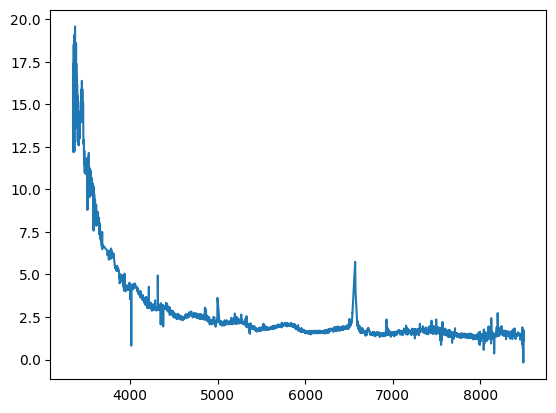

In [94]:
plt.plot(rf_new_wave[~mask][gpixs], new_flux[~mask][gpixs]/1e-17)
#plt.xlim(3300, 8500)
#plt.xlim(6000, 7000)
#plt.ylim(-50, 50)

In [95]:
from astropy.io import ascii
for i in range(len(rf_new_wave)):
    if i in gpixs:
        flag = 0
    else:
        flag = 99
    spec_str = str(rf_new_wave[i])+' '+str(new_flux[i]/1e-17)+' '+str(new_err[i]/1e-17)+' '+str(flag)+'\n'
    with open('J0950.cxt', 'a', newline='\n') as f:
        f.write(spec_str)

In [96]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

130.7466102321719

# After fitting

In [28]:
with open('/home/benjamin/Documents/STARLIGHTv04/J0950/J0950.cxt.sc4.C11.im.CAL.BS', 'r') as bf:
    # limits of lines to read
    line_lims = [531, 5682]
    # To store lines
    lines = []
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 5682:
            # don't read after line 7 to save time
            break
print(lines[0])
print(lines[-1])

3350.00    8.54815   3.77931   -1.000
8500.00    0.00000   0.67448   -2.000


In [32]:
with open('/home/benjamin/Documents/STARLIGHTv04/J0950/J0950.cxt.sc4.C11.im.CAL.BN', 'r') as bf:
    # limits of lines to read
    line_lims = [216, 5367]
    # To store lines
    lines = []
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 5367:
            # don't read after line 7 to save time
            break
print(lines[0])
print(lines[-1])

3350.00    8.54815   3.60971   -1.000
8500.00    0.00000   0.66012   -2.000


In [33]:
wl = []
input_flux = []
best_model = []
for element in lines:
    wl.append(float(element.split()[0]))
    input_flux.append(float(element.split()[1]))
    best_model.append(float(element.split()[2]))

(0.0, 5.0)

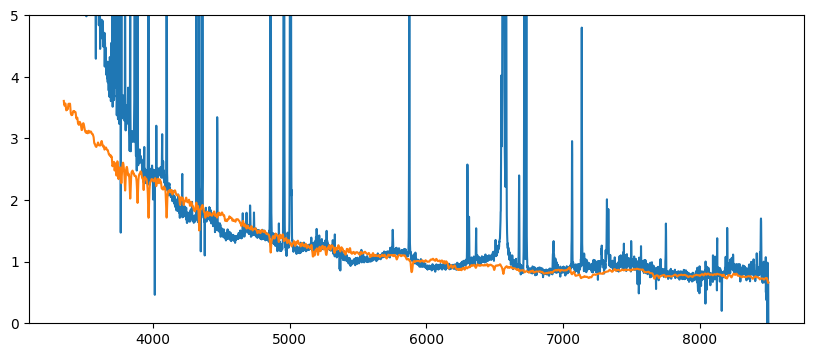

In [34]:
plt.figure(figsize=(10, 4))
plt.plot(wl, input_flux)
plt.plot(wl, best_model)
#plt.xlim(4500, 5000)
plt.ylim(0, 5)

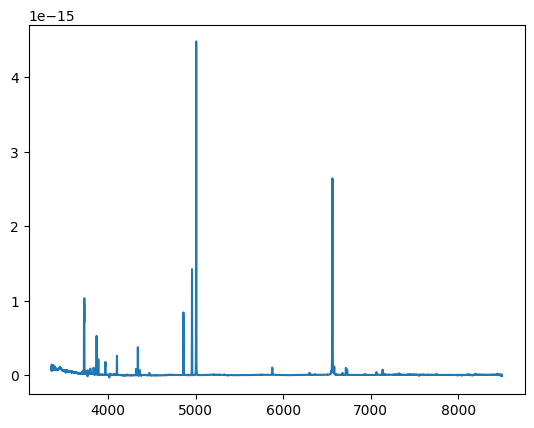

In [31]:
plt.plot(np.array(wl), (np.array(input_flux) - np.array(best_model)) * 1.765180E+00 * 1e-17)

In [101]:
np.log10(3.16398E+04 * 1e-17 * (1/3.826e33) * 4 * np.pi * ((1.40028e+27)**2))

9.30912839970327

In [22]:
z_nar_oiii_4959

0.09805976839067501

In [21]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

130.7466102321719